In [2]:
import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [142]:
pip install geopandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 6.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.6/18.6 MB 7.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 7.9 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 6.5 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [251]:
import geopandas as gpd

In [37]:
pip install epyestim

Note: you may need to restart the kernel to use updated packages.


In [694]:
pip install statsmodels

Note: you may need to restart the kernel to use updated packages.


In [624]:
pip install networkx

Note: you may need to restart the kernel to use updated packages.


In [625]:
import networkx as nx

In [4]:
import statsmodels.api as sm

In [5]:
import epyestim
import epyestim.covid19 as covid19

In [6]:
casedata = pd.read_csv('ltla_2023-07-13.csv')
np.asarray(casedata['date'], dtype='datetime64[s]')

array(['2023-07-05T00:00:00', '2023-07-04T00:00:00',
       '2023-07-04T00:00:00', ..., '2020-03-03T00:00:00',
       '2020-03-03T00:00:00', '2020-03-02T00:00:00'],
      dtype='datetime64[s]')

In [7]:
keep = ["E"]
casedata = casedata[casedata["areaCode"].str.contains('|'.join(keep))]


In [8]:
populations = pd.read_csv('Populations4.csv')
populations = populations.drop(columns=['Geography1', 'Code'])
test = populations.dtypes
test
#populations['All ages'] = populations['All ages'].astype(str).astype(int)

Name         object
All ages    float64
dtype: object

In [9]:
casedata = casedata.merge(populations, how='left', left_on = 'areaName', right_on='Name')
#casedata

In [10]:
casedata['New Cases per 100,000 People'] = (casedata['newCasesBySpecimenDate']/casedata['All ages'])*100000

In [1168]:
casedata = casedata.drop(columns=['areaType', 'areaCode', 'cumCasesBySpecimenDate', 'cumCasesBySpecimenDateRate', 'Name'])
#casedata

In [11]:
ltla2region = pd.read_csv('Local_Authority_District_to_Region.csv')
ltla2region = ltla2region.drop(columns = ['FID', 'LAD19CD', 'RGN19CD'])


In [12]:
casedata = casedata.merge(ltla2region, how='left', left_on = 'areaName', right_on='LAD19NM')
casedata = casedate.rename(columns={'RGN19NM':'Region'})
casedata

,areaCode,areaName,areaType,date,cumCasesBySpecimenDate,cumCasesBySpecimenDateRate,newCasesBySpecimenDate,Name,All ages,"New Cases per 100,000 People",LAD19NM,RGN19NM
0,E06000003,Redcar and Cleveland,ltla,2023-07-04,52991,38615.3,0,Redcar and Cleveland,137150.0,0.000000,Redcar and Cleveland,North East
1,E07000040,East Devon,ltla,2023-07-04,49568,33473.8,1,East Devon,146284.0,0.683602,East Devon,South West
2,E07000090,Havant,ltla,2023-07-04,45515,36026.1,1,Havant,126220.0,0.792267,Havant,South East
3,E07000214,Surrey Heath,ltla,2023-07-04,35310,39583.4,0,Surrey Heath,89305.0,0.000000,Surrey Heath,South East
4,E07000229,Worthing,ltla,2023-07-04,40042,36162.8,1,Worthing,110570.0,0.904404,Worthing,South East
...,...,...,...,...,...,...,...,...,...,...,...,...
383031,E07000084,Basingstoke and Deane,ltla,2020-03-04,1,0.6,1,Basingstoke and Deane,176582.0,0.566309,Basingstoke and Deane,South East
383032,E09000017,Hillingdon,ltla,2020-03-04,2,0.6,1,Hillingdon,306870.0,0.325871,Hillingdon,London
383033,E07000044,South Hams,ltla,2020-03-03,1,1.1,1,South Hams,87004.0,1.149372,South Hams,South West
383034,E09000017,Hillingdon,ltla,2020-03-03,1,0.3,0,Hillingdon,306870.0,0.000000,Hillingdon,London


In [55]:
casedata = casedata.rename(columns={'RGN19NM':'Region'})
casedata

,areaCode,areaName,areaType,date,cumCasesBySpecimenDate,cumCasesBySpecimenDateRate,newCasesBySpecimenDate,Name,All ages,"New Cases per 100,000 People",Region
4797,E06000003,Redcar and Cleveland,ltla,2022-06-30,48927,35653.8,50,Redcar and Cleveland,137150.0,36.456435,North East
4798,E07000040,East Devon,ltla,2022-06-30,43856,29616.4,82,East Devon,146284.0,56.055344,South West
4799,E07000090,Havant,ltla,2022-06-30,40783,32280.6,48,Havant,126220.0,38.028839,South East
4800,E07000214,Surrey Heath,ltla,2022-06-30,32281,36187.8,35,Surrey Heath,89305.0,39.191535,South East
4801,E07000229,Worthing,ltla,2022-06-30,36237,32726.4,45,Worthing,110570.0,40.698200,South East
...,...,...,...,...,...,...,...,...,...,...,...
383031,E07000084,Basingstoke and Deane,ltla,2020-03-04,1,0.6,1,Basingstoke and Deane,176582.0,0.566309,South East
383032,E09000017,Hillingdon,ltla,2020-03-04,2,0.6,1,Hillingdon,306870.0,0.325871,London
383033,E07000044,South Hams,ltla,2020-03-03,1,1.1,1,South Hams,87004.0,1.149372,South West
383034,E09000017,Hillingdon,ltla,2020-03-03,1,0.3,0,Hillingdon,306870.0,0.000000,London


In [13]:
casedata = casedata.drop(columns = ['LAD19NM'])

We will remove the last years worth of data in the cell below to reduce running times.

In [34]:
end_date = '2022-06-31'
mask = casedata['date'] <= end_date
casedata = casedata.loc[mask]

,areaCode,areaName,areaType,date,cumCasesBySpecimenDate,cumCasesBySpecimenDateRate,newCasesBySpecimenDate,Name,All ages,"New Cases per 100,000 People",Region


In [678]:
casedata = casedata.set_index('date')


,areaName,newCasesBySpecimenDate,All ages,"New Cases per 100,000 People"
date,,,,
2023-07-04,Redcar and Cleveland,0,137150.0,0.000000
2023-07-04,East Devon,1,146284.0,0.683602
2023-07-04,Havant,1,126220.0,0.792267
2023-07-04,Surrey Heath,0,89305.0,0.000000
2023-07-04,Worthing,1,110570.0,0.904404
...,...,...,...,...
2020-03-04,Basingstoke and Deane,1,176582.0,0.566309
2020-03-04,Hillingdon,1,306870.0,0.325871
2020-03-03,South Hams,1,87004.0,1.149372


In [14]:
import statsmodels

In [15]:
import statsmodels.api as sm

# Defining COVID-19 Waves

First Wave: 1st March 2020 - 31st July 2020 


Second Wave: 1st September 2020 - 31st March 2021 


Third Wave: 1st June 2021 - 31st May 2022

In [35]:
start_date = '2020-03-01'
end_date = '2020-07-31'
mask1 = (casedata['date'] >= start_date) & (casedata['date'] <= end_date)
first_wave = casedata.loc[mask1]


In [36]:
start_date = '2020-09-01'
end_date = '2021-03-31'
mask2 = (casedata['date'] >= start_date) & (casedata['date'] <= end_date)
second_wave = casedata.loc[mask2]


In [37]:
start_date = '2021-06-01'
end_date = '2022-05-31'
mask3 = (casedata['date'] >= start_date) & (casedata['date'] <= end_date)
third_wave = casedata.loc[mask3]


# Importing Geofiles

In [432]:
map_df = gpd.read_file('LAD_APR_2019_UK_BUC.shp')

In [433]:
keep = ["E"]
map_df = map_df[map_df['LAD19CD'].str.contains('|'.join(keep))]
map_df

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53..."
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51..."
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52..."
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51..."
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51..."
...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16..."
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18..."
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19..."
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17..."


In [434]:
map_df['Centroid'] = map_df['geometry'].centroid


In [118]:
(map_df['Centroid'].iloc[0]).distance(map_df['Centroid'].iloc[1])

14289.49475679787

# EDA

In [44]:
england = pd.read_csv('nation_2023-07-13.csv')
end_date = '2022-09-31'
mask4 = (england['date'] <= end_date)
england = england.loc[mask4]
england = england.set_index('date')

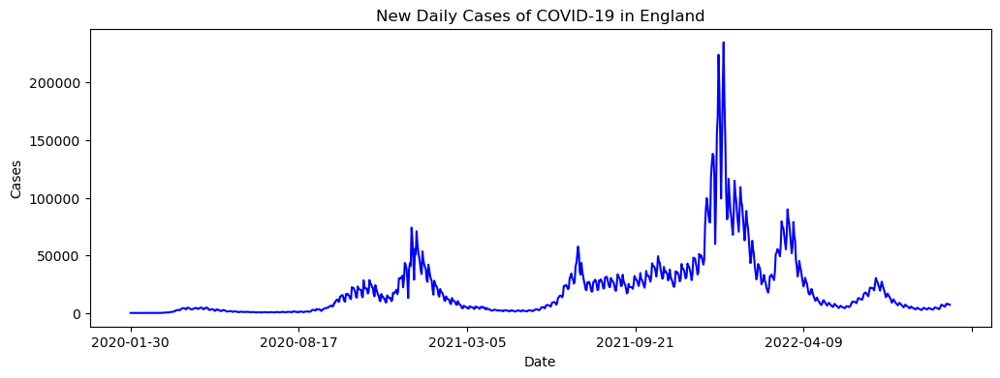

In [46]:
fig, ax = plt.subplots(1,1, figsize=(12, 4))
(england.loc[:,'newCasesBySpecimenDate'])[::-1].plot(ax=ax, color='blue')
ax.set_xlabel('Date')
ax.set_ylabel('Cases')
ax.set_title('New Daily Cases of COVID-19 in England')
plt.show()

In [90]:
england['7 Day Case Rolling Average'] = (england['newCasesBySpecimenDate'])[::-1].rolling(7).mean()
england.dropna(inplace=True)
england.nlargest(3, 'newCasesBySpecimenDate')

,areaCode,areaName,areaType,newCasesBySpecimenDate,7 Day Case Rolling Average
date,,,,,
2022-01-04,E92000001,England,nation,234873,178020.714286
2021-12-29,E92000001,England,nation,224031,137656.714286
2022-01-03,E92000001,England,nation,193617,168836.857143


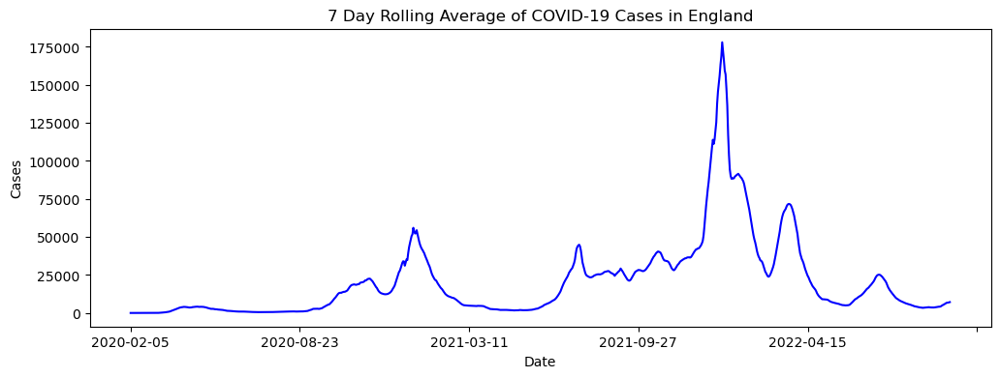

In [53]:
fig, ax = plt.subplots(1,1, figsize=(12, 4))
(england.loc[:,'7 Day Case Rolling Average'])[::-1].plot(ax=ax, color='blue')
ax.set_xlabel('Date')
ax.set_ylabel('Cases')
ax.set_title('7 Day Rolling Average of COVID-19 Cases in England')
plt.show()

In [77]:
first_lockdown = casedata.loc[casedata['date'] == '2020-03-23']
first_lockdown= first_lockdown.set_index('areaName')
first_lockdown = first_lockdown.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [78]:
first_lockdown_map = map_df.set_index('LAD19NM').join(first_lockdown)
first_lockdown_map.nlargest(5, 'New Cases per 100,000 People')

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,areaCode,areaType,date,cumCasesBySpecimenDate,cumCasesBySpecimenDateRate,newCasesBySpecimenDate,Name,All ages,"New Cases per 100,000 People",Region
LAD19NM,,,,,,,,,,,,,,,,,,
Brent,E09000005,NaN,519615,186468,-0.275680,51.5644,55a16f82-1966-4989-b832-cc1a42769ca9,"POLYGON ((520113.102 190480.805, 521462.703 18...",E09000005,ltla,2020-03-23,240.0,73.2,47.0,Brent,329771.0,14.252314,London
Southwark,E09000028,NaN,533945,175862,-0.073090,51.4659,89d8fab4-6482-4035-851c-c13722dab0a4,"POLYGON ((533334.201 180406.719, 533720.112 18...",E09000028,ltla,2020-03-23,252.0,78.7,44.0,Southwark,318830.0,13.800458,London
Sutton,E09000029,NaN,527356,163640,-0.172270,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",E09000029,ltla,2020-03-23,78.0,37.6,25.0,Sutton,206349.0,12.115397,London
Bromley,E09000006,NaN,542036,165708,0.039246,51.3727,f47271d8-9029-4cde-afbb-8bed8aa8225c,"POLYGON ((541137.200 173365.504, 543441.497 17...",E09000006,ltla,2020-03-23,159.0,47.8,35.0,Bromley,332336.0,10.531510,London
Barrow-in-Furness,E07000027,NaN,321750,474171,-3.199760,54.1574,7d0411b3-20f2-44cd-8a2d-020078fec2f4,"MULTIPOLYGON (((324785.300 463816.400, 323456....",E07000027,ltla,2020-03-23,41.0,61.4,7.0,Barrow-in-Furness,67049.0,10.440126,North West


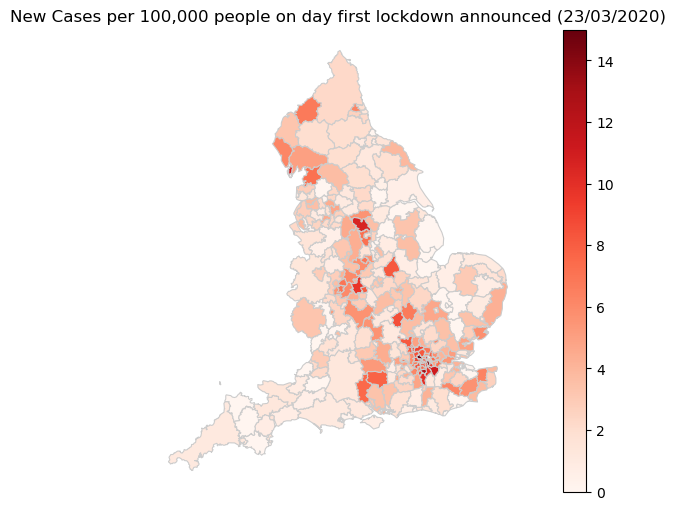

In [80]:
variable = 'New Cases per 100,000 People'
vmin, vmax = 0.0, 15.0
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('New Cases per 100,000 people on day first lockdown announced (23/03/2020)')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

first_lockdown_map.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [81]:
second_lockdown = casedata.loc[casedata['date'] == '2020-11-05']
second_lockdown= second_lockdown.set_index('areaName')
second_lockdown = second_lockdown.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [83]:
second_lockdown_map = map_df.set_index('LAD19NM').join(second_lockdown)
second_lockdown_map.nsmallest(5, 'New Cases per 100,000 People')

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,areaCode,areaType,date,cumCasesBySpecimenDate,cumCasesBySpecimenDateRate,newCasesBySpecimenDate,Name,All ages,"New Cases per 100,000 People",Region
LAD19NM,,,,,,,,,,,,,,,,,,
Maldon,E07000074,NaN,591460,212199,0.773857,51.7757,02665918-f5c4-4e00-ac87-0c05b1d2e234,"MULTIPOLYGON (((591595.800 205851.500, 590340....",E07000074,ltla,2020-11-05,341.0,521.4,2.0,Maldon,64926.0,3.080430,East of England
Mendip,E07000187,NaN,362238,144090,-2.541780,51.1948,6d614d45-2e6a-4c0e-a39f-820e22367097,"POLYGON ((346813.799 158441.896, 351670.404 15...",E07000187,ltla,2020-11-05,504.0,433.4,4.0,Mendip,115587.0,3.460597,South West
Fenland,E07000010,NaN,536361,294959,0.009016,52.5354,ce7b81ca-7380-440d-969c-68caa436bc5e,"POLYGON ((534698.403 301468.401, 533246.099 30...",E07000010,ltla,2020-11-05,880.0,862.1,5.0,Fenland,101850.0,4.909180,East of England
Hastings,E07000062,NaN,581599,110745,0.579429,50.8677,6d8235df-b0c2-4576-a843-b56a16fe1af2,"POLYGON ((576321.488 107830.598, 577561.901 10...",E07000062,ltla,2020-11-05,425.0,459.2,5.0,Hastings,92661.0,5.396013,South East
Mid Devon,E07000042,NaN,288064,108911,-3.592120,50.8688,d3613d2b-19e2-4045-bb02-9460f2ba8994,"POLYGON ((287618.399 124318.404, 292391.003 12...",E07000042,ltla,2020-11-05,473.0,567.9,6.0,Mid Devon,82311.0,7.289427,South West


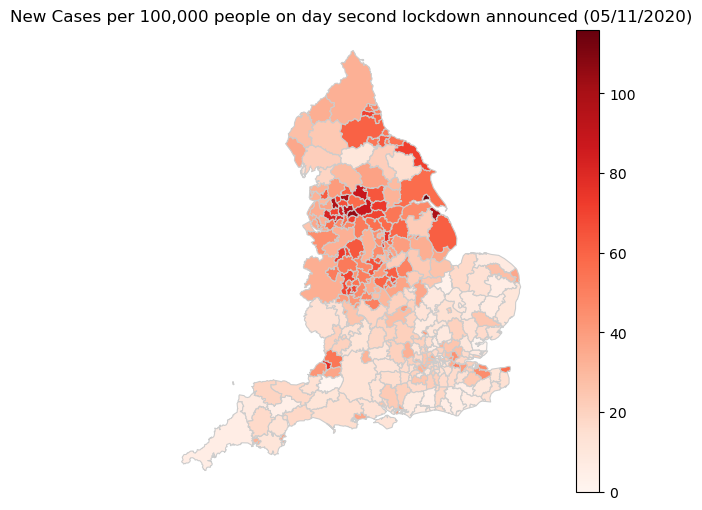

In [84]:
variable = 'New Cases per 100,000 People'
vmin, vmax = 0.0, 116.0
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('New Cases per 100,000 people on day second lockdown announced (05/11/2020)')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

second_lockdown_map.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [85]:
third_lockdown = casedata.loc[casedata['date'] == '2021-01-06']
third_lockdown= third_lockdown.set_index('areaName')
third_lockdown = third_lockdown.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [87]:
third_lockdown_map = map_df.set_index('LAD19NM').join(third_lockdown)
third_lockdown_map.nlargest(5, 'New Cases per 100,000 People')

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,areaCode,areaType,date,cumCasesBySpecimenDate,cumCasesBySpecimenDateRate,newCasesBySpecimenDate,Name,All ages,"New Cases per 100,000 People",Region
LAD19NM,,,,,,,,,,,,,,,,,,
Barking and Dagenham,E09000002,NaN,547759,185107,0.129506,51.5455,20f1fe28-e3f2-4603-b796-3e07305f96d1,"POLYGON ((548881.299 187727.503, 549951.904 18...",E09000002,ltla,2021-01-06,16791.0,7842.3,497.0,Barking and Dagenham,212906.0,233.436352,London
Newham,E09000025,NaN,540721,183327,0.027369,51.5313,3af70c71-9a15-4def-811d-893d57504659,"POLYGON ((542212.801 187004.100, 543522.496 18...",E09000025,ltla,2021-01-06,25016.0,7041.5,815.0,Newham,353134.0,230.790578,London
Knowsley,E08000011,NaN,344762,393778,-2.832970,53.4379,b2cafe68-2231-45fc-82aa-ab92a9051121,"POLYGON ((341198.698 401158.299, 342697.699 39...",E08000011,ltla,2021-01-06,11264.0,7388.6,308.0,Knowsley,150862.0,204.160093,North West
Halton,E06000006,NaN,354246,382146,-2.688530,53.3342,b3e7f8f4-c7b8-4b31-b4ac-b0a7f54b73d8,"POLYGON ((355191.802 384297.230, 358131.901 38...",E06000006,ltla,2021-01-06,7749.0,5971.8,251.0,Halton,129410.0,193.957190,North West
Thurrock,E06000034,NaN,562126,181586,0.334902,51.5099,99b99607-6487-49d5-a9e0-baa8b4f90e8e,"POLYGON ((565233.498 187905.902, 565870.000 18...",E06000034,ltla,2021-01-06,13348.0,7604.4,331.0,Thurrock,174341.0,189.857807,East of England


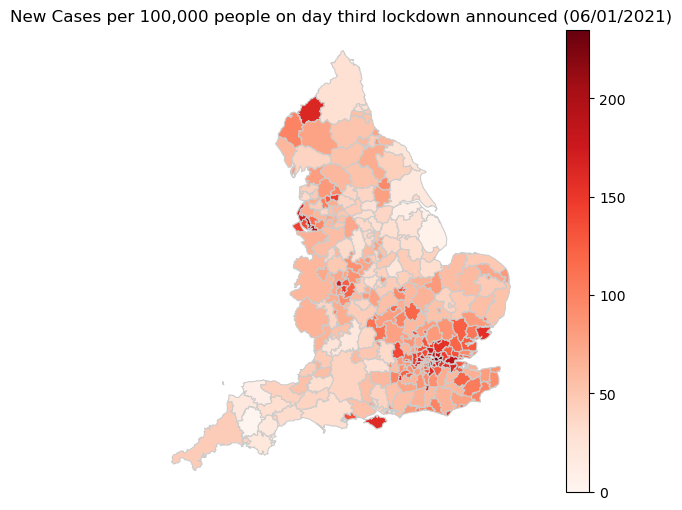

In [93]:
variable = 'New Cases per 100,000 People'
vmin, vmax = 0.0, 235
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('New Cases per 100,000 people on day third lockdown announced (06/01/2021)')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

third_lockdown_map.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [91]:
peak_inf = casedata.loc[casedata['date'] == '2021-01-04']
peak_inf = peak_inf.set_index('areaName')
peak_inf = peak_inf.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [94]:
peak_inf_map = map_df.set_index('LAD19NM').join(peak_inf)
peak_inf_map.nsmallest(5, 'New Cases per 100,000 People')

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,areaCode,areaType,date,cumCasesBySpecimenDate,cumCasesBySpecimenDateRate,newCasesBySpecimenDate,Name,All ages,"New Cases per 100,000 People",Region
LAD19NM,,,,,,,,,,,,,,,,,,
North Devon,E07000043,NaN,265110,132524,-3.926910,51.0761,5a3fc501-ec10-4645-9767-7f22a354b9a1,"POLYGON ((279957.501 149619.201, 279063.200 14...",E07000043,ltla,2021-01-04,1583.0,1612.5,22.0,North Devon,97145.0,22.646559,South West
Torridge,E07000046,NaN,244206,114405,-4.217310,50.9080,9a0606c0-c74b-4547-bbde-f6ab792eb5ed,"MULTIPOLYGON (((213329.104 143304.599, 212711....",E07000046,ltla,2021-01-04,768.0,1117.6,20.0,Torridge,68267.0,29.296732,South West
East Lindsey,E07000137,NaN,534862,376106,0.020549,53.2648,e776aa08-2072-406c-afed-9941bb71dc76,"POLYGON ((533824.804 405078.297, 535854.696 40...",E07000137,ltla,2021-01-04,4818.0,3392.2,42.0,East Lindsey,141727.0,29.634438,East Midlands
West Devon,E07000047,NaN,256379,86998,-4.033570,50.6649,54990ef7-4720-4ea1-a876-65e3a2deb5e7,"POLYGON ((235005.403 85575.904, 236645.502 873...",E07000047,ltla,2021-01-04,830.0,1478.5,18.0,West Devon,55796.0,32.260377,South West
Rutland,E06000017,NaN,492992,308655,-0.626300,52.6676,61849040-6560-4c51-b42e-46bb5455a3df,"POLYGON ((490252.797 318512.096, 493877.598 31...",E06000017,ltla,2021-01-04,841.0,2077.8,15.0,Rutland,39927.0,37.568563,East Midlands


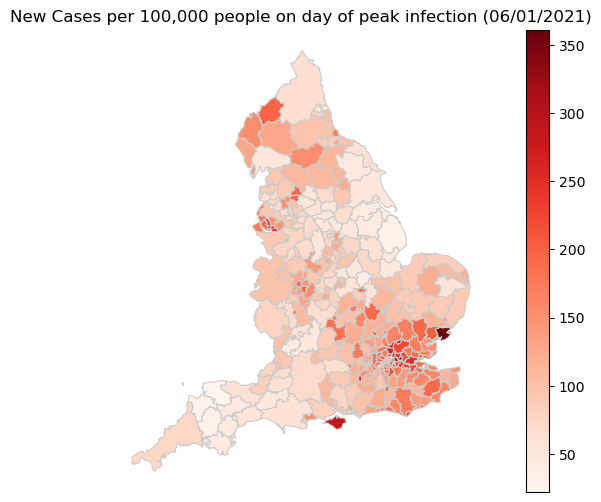

In [95]:
variable = 'New Cases per 100,000 People'
vmin, vmax = 22.0, 361.0
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('New Cases per 100,000 people on day of peak infection (06/01/2021)')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

peak_inf_map.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

# Epyestim Test

In [96]:
eng_r = england['newCasesBySpecimenDate'].tolist()

In [97]:
england

,areaCode,areaName,areaType,newCasesBySpecimenDate,7 Day Case Rolling Average
date,,,,,
2022-09-30,E92000001,England,nation,7099,7141.000000
2022-09-29,E92000001,England,nation,7352,6984.857143
2022-09-28,E92000001,England,nation,7806,6833.714286
2022-09-27,E92000001,England,nation,7644,6710.000000
2022-09-26,E92000001,England,nation,8040,6646.571429
...,...,...,...,...,...
2020-02-15,E92000001,England,nation,0,1.142857
2020-02-14,E92000001,England,nation,0,1.571429
2020-02-13,E92000001,England,nation,1,1.571429


In [98]:
eng_ser = pd.Series(eng_r, index=pd.date_range(date(2020,2,11), periods=963))

In [99]:
england_r = covid19.r_covid(eng_ser, smoothing_window = 14, r_window_size = 7)

In [100]:
england_r

,cases,R_mean,R_var,Q0.025,Q0.5,Q0.975
2020-02-18,6006.0,0.755726,0.000017,0.747591,0.755719,0.763893
2020-02-19,6294.0,0.723343,0.000017,0.715183,0.723335,0.731537
2020-02-20,6940.0,0.691971,0.000018,0.683699,0.691962,0.700243
2020-02-21,7200.0,0.665440,0.000018,0.657032,0.665431,0.673920
2020-02-22,5702.0,0.651237,0.000020,0.642561,0.651227,0.659971
...,...,...,...,...,...,...
2022-09-16,3.0,3.000000,3.000000,0.618672,2.674060,7.224688
2022-09-17,2.0,3.000000,3.000000,0.618672,2.674060,7.224688
2022-09-18,6.0,3.000000,3.000000,0.618672,2.674060,7.224688
2022-09-19,0.0,3.000000,3.000000,0.618672,2.674060,7.224688


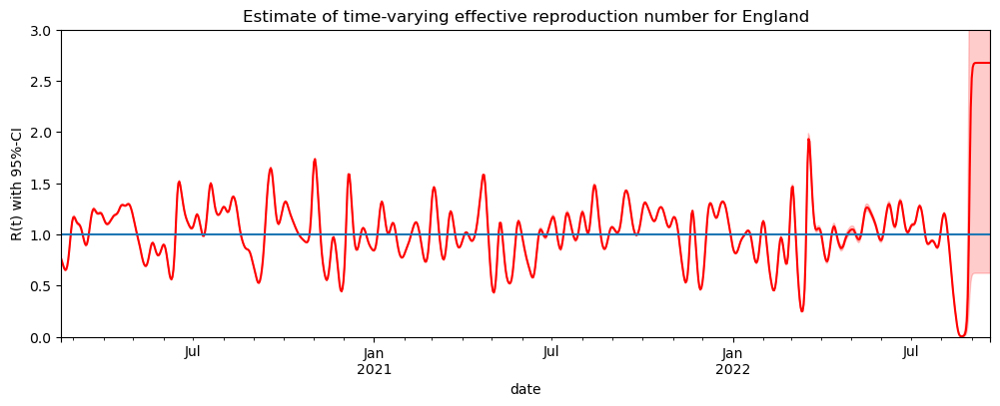

In [101]:
fig, ax = plt.subplots(1,1, figsize=(12, 4))

england_r.loc[:,'Q0.5'].plot(ax=ax, color='red')
ax.fill_between(england_r.index, 
                    england_r['Q0.025'], 
                    england_r['Q0.975'], 
                    color='red', alpha=0.2)
ax.set_xlabel('date')
ax.set_ylabel('R(t) with 95%-CI')
ax.set_ylim([0,3])
ax.axhline(y=1)
ax.set_title('Estimate of time-varying effective reproduction number for England')
plt.show()

# Cross-correlations

In [555]:
import scipy
from scipy import stats
from itertools import combinations
import itertools
import time

In [538]:
ltlas = pd.unique(casedata['areaName'])
ltlas = ltlas.tolist()
ltlas

['Redcar and Cleveland',
 'East Devon',
 'Havant',
 'Surrey Heath',
 'Worthing',
 'Bolton',
 'Trafford',
 'Barnsley',
 'Bradford',
 'Barnet',
 'Hounslow',
 'Wandsworth',
 'Westminster',
 'South Bucks',
 'Braintree',
 'Winchester',
 'Rossendale',
 'South Northamptonshire',
 'Selby',
 'Mendip',
 'Mid Suffolk',
 'Bromsgrove',
 'Gateshead',
 'Merton',
 'Reading',
 'Fenland',
 'South Lakeland',
 'Cotswold',
 'Dacorum',
 'North Hertfordshire',
 'Great Yarmouth',
 'South Somerset',
 'Malvern Hills',
 'Wirral',
 'Newcastle upon Tyne',
 'Stockton-on-Tees',
 'Stoke-on-Trent',
 'Swindon',
 'Allerdale',
 'Amber Valley',
 'Castle Point',
 'Fylde',
 'South Holland',
 'Scarborough',
 'Runnymede',
 'Knowsley',
 'Kensington and Chelsea',
 'Redbridge',
 'Darlington',
 'Shropshire',
 'Epping Forest',
 'Maldon',
 'Gosport',
 'Broxbourne',
 'Northampton',
 'Stratford-on-Avon',
 'Wychavon',
 'Wyre Forest',
 'St Albans',
 'Havering',
 'Islington',
 'Wiltshire',
 'South Cambridgeshire',
 'Chesterfield',
 'Der

In [518]:
range(len(ltlas))

range(0, 315)

In [465]:
f = combinations(ltlas, 2)
f

In [561]:
res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
len(res)

49455

In [542]:
res_test = res[:5]
res_test

[('Redcar and Cleveland', 'East Devon'),
 ('Redcar and Cleveland', 'Havant'),
 ('Redcar and Cleveland', 'Surrey Heath'),
 ('Redcar and Cleveland', 'Worthing'),
 ('Redcar and Cleveland', 'Bolton')]

In [560]:
ltlas_test = ltlas[:30]
test_list = itertools.combinations(ltlas_test, 2)
len(list(test_list))

435

In [543]:
test_list2 = itertools.combinations(range(5), 2)
print(list(test_list2))

[(0, 1), (0, 2), (0, 3), (0, 4), (1, 2), (1, 3), (1, 4), (2, 3), (2, 4), (3, 4)]


In [548]:
def testrun(x, y):
    return x+y

g = [testrun(x, y) for x, y in itertools.combinations(range(5), 2)]
print(g)

[1, 2, 3, 4, 3, 4, 5, 5, 6, 7]


In [562]:

start = time.time()

def pearson(x, y):
    series1 = (casedata.loc[casedata['areaName'] == ltlas[x]])['newCasesBySpecimenDate']
    series2 = (casedata.loc[casedata['areaName'] == ltlas[y]])['newCasesBySpecimenDate']
    
    return series1.corr(series2)
        #return scipy.stats.pearsonr(series1, series2)
#res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
h = [pearson(x, y) for x, y in itertools.combinations(range(len(ltlas)), 2)]



end= time.time()
print(end - start)

2709.9429881572723


In [565]:
pearson_corrs = h

pearson_corrs = list(pearson_corrs)

pearson_corrs


[0.6832087855711176,
 0.7886146742549152,
 0.7813551901736419,
 0.7270523214034006,
 0.906318516775692,
 0.8607073679008133,
 0.9547778074725135,
 0.9259246210475852,
 0.7828720233590163,
 0.8111131153577923,
 0.6486914985101024,
 0.7189844445968469,
 0.7804129409478443,
 0.7801897485501184,
 0.7155091780208098,
 0.9122515764094541,
 0.775094466071724,
 0.8984784318690199,
 0.7342122897472408,
 0.7096616446660395,
 0.8735184006815381,
 0.9639968779102688,
 0.719769201717046,
 0.7979890497106775,
 0.7676135894140135,
 0.8808837230046042,
 0.7024385214471336,
 0.7880234242417595,
 0.7435421198934156,
 0.8744930965265607,
 0.7333572151762696,
 0.7434186286444373,
 0.9042064440319201,
 0.9227688087763529,
 0.9818055999010901,
 0.9150020438746937,
 0.8483296496519556,
 0.9278630171236876,
 0.8817801401764255,
 0.7492140597820152,
 0.9359749108547369,
 0.7914719075675145,
 0.9031292180048626,
 0.7808023284768506,
 0.8804598015600952,
 0.7284453543957012,
 0.7339245197826014,
 0.9485679109416

In [578]:
for i in res:
    print(i[1])

East Devon
Havant
Surrey Heath
Worthing
Bolton
Trafford
Barnsley
Bradford
Barnet
Hounslow
Wandsworth
Westminster
South Bucks
Braintree
Winchester
Rossendale
South Northamptonshire
Selby
Mendip
Mid Suffolk
Bromsgrove
Gateshead
Merton
Reading
Fenland
South Lakeland
Cotswold
Dacorum
North Hertfordshire
Great Yarmouth
South Somerset
Malvern Hills
Wirral
Newcastle upon Tyne
Stockton-on-Tees
Stoke-on-Trent
Swindon
Allerdale
Amber Valley
Castle Point
Fylde
South Holland
Scarborough
Runnymede
Knowsley
Kensington and Chelsea
Redbridge
Darlington
Shropshire
Epping Forest
Maldon
Gosport
Broxbourne
Northampton
Stratford-on-Avon
Wychavon
Wyre Forest
St Albans
Havering
Islington
Wiltshire
South Cambridgeshire
Chesterfield
Derbyshire Dales
Forest of Dean
Maidstone
Charnwood
King's Lynn and West Norfolk
Bassetlaw
Staffordshire Moorlands
Walsall
Camden
Hammersmith and Fulham
North Lincolnshire
South Gloucestershire
Plymouth
Windsor and Maidenhead
Dorset
Barrow-in-Furness
Lewes
Uttlesford
Eastleigh
Pend

In [588]:
ltlas1 = [i[0] for i in res]
ltlas2 = [i[1] for i in res]

ltlas1 = list(ltlas1)
ltlas2 = list(ltlas2)

In [581]:

def first_place(places):
    
    for i in places:
        return (i[0])
    
ltlas1 = first_place(res)

def second_place(places2):
    
    for i in places2:
        return (i[1])
    
ltlas2 = second_place(res)

In [587]:
print(ltlas1)

['Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cleveland', 'Redcar and Cle

In [589]:
list_of_tuples = list(zip(ltlas1, ltlas2, pearson_corrs))

p_corrs = pd.DataFrame(list_of_tuples, columns = ['LTLA 1', 'LTLA 2', 'Pearson Correlation'])
p_corrs

,LTLA 1,LTLA 2,Pearson Correlation
0,Redcar and Cleveland,East Devon,0.683209
1,Redcar and Cleveland,Havant,0.788615
2,Redcar and Cleveland,Surrey Heath,0.781355
3,Redcar and Cleveland,Worthing,0.727052
4,Redcar and Cleveland,Bolton,0.906319
...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.936442
49451,Basingstoke and Deane,Hillingdon,0.902395
49452,Tunbridge Wells,Rushcliffe,0.923809
49453,Tunbridge Wells,Hillingdon,0.890623


In [596]:
randc_corrs = p_corrs.loc[p_corrs['LTLA 1'] == 'Redcar and Cleveland']
randc_corrs

,LTLA 1,LTLA 2,Pearson Correlation
0,Redcar and Cleveland,East Devon,0.683209
1,Redcar and Cleveland,Havant,0.788615
2,Redcar and Cleveland,Surrey Heath,0.781355
3,Redcar and Cleveland,Worthing,0.727052
4,Redcar and Cleveland,Bolton,0.906319
...,...,...,...
309,Redcar and Cleveland,Colchester,0.770018
310,Redcar and Cleveland,Basingstoke and Deane,0.793727
311,Redcar and Cleveland,Tunbridge Wells,0.722682
312,Redcar and Cleveland,Rushcliffe,0.837388


In [605]:

randc_new = randc_corrs.set_index('LTLA 2')
randc_new = randc_new.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [606]:
corr_test = map_df.set_index('LAD19NM').join(randc_new)
corr_test

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,LTLA 1,Pearson Correlation
LAD19NM,,,,,,,,,,
Hartlepool,E06000001,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",Redcar and Cleveland,0.966392
Middlesbrough,E06000002,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",Redcar and Cleveland,0.981148
Redcar and Cleveland,E06000003,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",NaN,NaN
Stockton-on-Tees,E06000004,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",Redcar and Cleveland,0.981806
Darlington,E06000005,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",Redcar and Cleveland,0.948568
...,...,...,...,...,...,...,...,...,...,...
Sutton,E09000029,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",Redcar and Cleveland,0.749433
Tower Hamlets,E09000030,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",Redcar and Cleveland,0.693173
Waltham Forest,E09000031,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",Redcar and Cleveland,0.716267


<AxesSubplot:title={'center':'Pearson Correlation with Redcar & Cleveland'}>

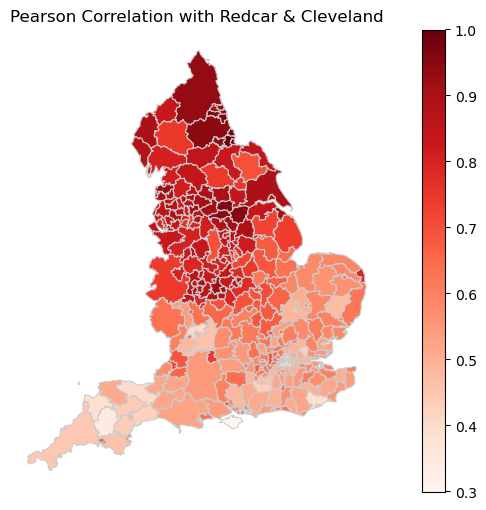

In [607]:
variable = 'Pearson Correlation'
vmin, vmax = 0.3, 1.0
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('Pearson Correlation with Redcar & Cleveland')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

corr_test.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')

In [632]:
bham_corrs = p_corrs.loc[p_corrs['LTLA 2'] == 'Birmingham']
bham_corrs

,LTLA 1,LTLA 2,Pearson Correlation
254,Redcar and Cleveland,Birmingham,0.908092
567,East Devon,Birmingham,0.717901
879,Havant,Birmingham,0.858592
1190,Surrey Heath,Birmingham,0.876264
1500,Worthing,Birmingham,0.822397
...,...,...,...
47379,Norwich,Birmingham,0.886784
47442,South Norfolk,Birmingham,0.831223
47504,Cherwell,Birmingham,0.876244
47565,Chichester,Birmingham,0.809969


In [633]:
bham_new = bham_corrs.set_index('LTLA 1')
bham_new = bham_new.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [636]:
corr_test2 = map_df.set_index('LAD19NM').join(bham_new)
corr_test2

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,LTLA 2,Pearson Correlation
LAD19NM,,,,,,,,,,
Hartlepool,E06000001,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",NaN,NaN
Middlesbrough,E06000002,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",Birmingham,0.915574
Redcar and Cleveland,E06000003,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",Birmingham,0.908092
Stockton-on-Tees,E06000004,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",Birmingham,0.932617
Darlington,E06000005,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",Birmingham,0.920369
...,...,...,...,...,...,...,...,...,...,...
Sutton,E09000029,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",Birmingham,0.884148
Tower Hamlets,E09000030,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",Birmingham,0.853242
Waltham Forest,E09000031,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",Birmingham,0.875309


In [637]:
bham_corrs2 = p_corrs.loc[p_corrs['LTLA 1'] == 'Birmingham']


In [638]:

bham_new2 = bham_corrs2.set_index('LTLA 2')
bham_new2 = bham_new2.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})


In [646]:
corr_test2new = corr_test2
corr_test2new = corr_test2new.merge(bham_new2,how='left', left_on = 'LAD19NM', right_on='LTLA 2')
corr_test2new

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,LTLA 2,Pearson Correlation_x,LTLA 1,Pearson Correlation_y
0,E06000001,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",NaN,NaN,Birmingham,0.92577
1,E06000002,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",Birmingham,0.915574,NaN,NaN
2,E06000003,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",Birmingham,0.908092,NaN,NaN
3,E06000004,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",Birmingham,0.932617,NaN,NaN
4,E06000005,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",Birmingham,0.920369,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",Birmingham,0.884148,NaN,NaN
313,E09000030,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",Birmingham,0.853242,NaN,NaN
314,E09000031,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",Birmingham,0.875309,NaN,NaN
315,E09000032,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",Birmingham,0.786866,NaN,NaN


In [645]:
corr_test2new = corr_test2new['Pearson Correlation_x'].fillna(0)
corr_test2new = corr_test2new['Pearson Correlation_y'].fillna(0)

0      0.92577
1      0.00000
2      0.00000
3      0.00000
4      0.00000
        ...   
312    0.00000
313    0.00000
314    0.00000
315    0.00000
316    0.00000
Name: Pearson Correlation_y, Length: 317, dtype: float64

In [648]:
corr_test2new["Pearson Correlation"] = corr_test2new['Pearson Correlation_x'].fillna(0) + corr_test2new["Pearson Correlation_y"].fillna(0)
corr_test2new

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,LTLA 2,Pearson Correlation_x,LTLA 1,Pearson Correlation_y,Pearson Correlation
0,E06000001,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",NaN,NaN,Birmingham,0.92577,0.925770
1,E06000002,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",Birmingham,0.915574,NaN,NaN,0.915574
2,E06000003,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",Birmingham,0.908092,NaN,NaN,0.908092
3,E06000004,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",Birmingham,0.932617,NaN,NaN,0.932617
4,E06000005,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",Birmingham,0.920369,NaN,NaN,0.920369
...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",Birmingham,0.884148,NaN,NaN,0.884148
313,E09000030,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",Birmingham,0.853242,NaN,NaN,0.853242
314,E09000031,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",Birmingham,0.875309,NaN,NaN,0.875309
315,E09000032,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",Birmingham,0.786866,NaN,NaN,0.786866


In [652]:
corr_test2new.nsmallest(5, 'Pearson Correlation')

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,LTLA 2,Pearson Correlation_x,LTLA 1,Pearson Correlation_y,Pearson Correlation
49,E06000053,NaN,91327,11447,-6.30217,49.9233,93f50e1a-542f-499f-85ea-3365a54d5e5b,"MULTIPOLYGON (((92817.200 15013.600, 91433.700...",NaN,NaN,NaN,NaN,0.000000
271,E08000025,NaN,408150,287352,-1.88141,52.4840,c1446f62-d94e-4820-a4c7-51340a4a7dfc,"POLYGON ((408730.901 298576.703, 409988.001 30...",NaN,NaN,NaN,NaN,0.000000
284,E09000001,NaN,532382,181358,-0.09351,51.5156,1f8b4af9-6e0a-45fc-8154-6306fec75376,"POLYGON ((531554.600 181659.100, 532946.103 18...",NaN,NaN,NaN,NaN,0.000000
295,E09000012,NaN,534560,185787,-0.06045,51.5549,62b898ea-f14d-40b8-b303-20a20a17717a,"POLYGON ((534444.098 188327.401, 535464.202 18...",NaN,NaN,NaN,NaN,0.000000
86,E07000047,NaN,256379,86998,-4.03357,50.6649,54990ef7-4720-4ea1-a876-65e3a2deb5e7,"POLYGON ((235005.403 85575.904, 236645.502 873...",NaN,NaN,Birmingham,0.660817,0.660817


<AxesSubplot:title={'center':'Pearson Correlation with Birmingham'}>

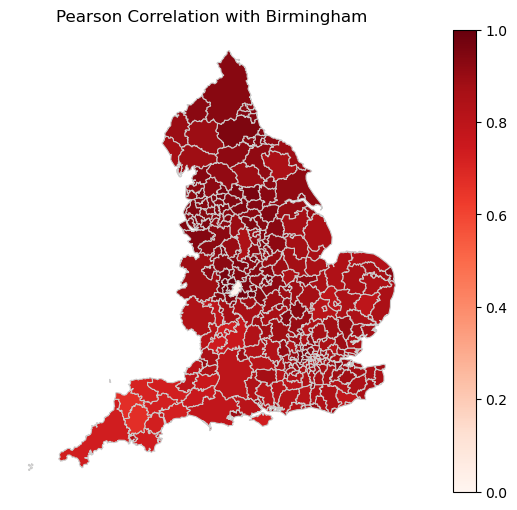

In [653]:
variable = 'Pearson Correlation'
vmin, vmax = 0.0, 1.0
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('Pearson Correlation with Birmingham')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

corr_test2new.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')

In [654]:
edevon_corrs = p_corrs.loc[p_corrs['LTLA 1'] == 'East Devon']


In [655]:
edevon_new = edevon_corrs.set_index('LTLA 2')
edevon_new = edevon_new.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [656]:
corr_test3 = map_df.set_index('LAD19NM').join(edevon_new)

<AxesSubplot:title={'center':'Pearson Correlations with East Devon'}>

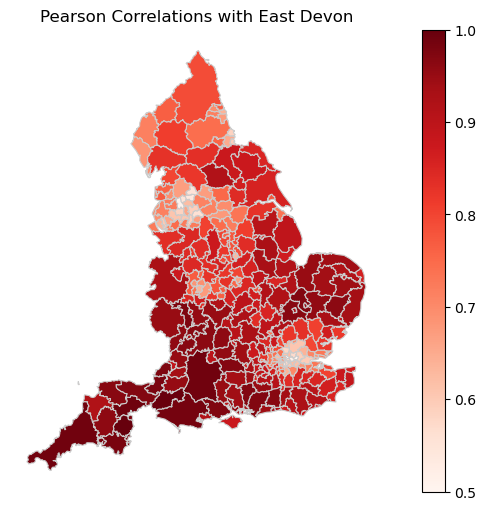

In [659]:
variable = 'Pearson Correlation'
vmin, vmax = 0.5, 1.0
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('Pearson Correlations with East Devon')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

corr_test3.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')

In [660]:
havant_corrs = p_corrs.loc[p_corrs['LTLA 1'] == 'Havant']
havant_new = havant_corrs.set_index('LTLA 2')
havant_new = havant_new.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [661]:
corr_test4 = map_df.set_index('LAD19NM').join(havant_new)

<AxesSubplot:title={'center':'Pearson Correlations with East Devon'}>

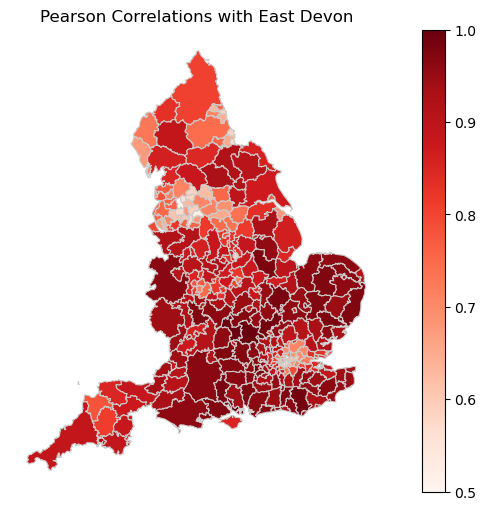

In [662]:
variable = 'Pearson Correlation'
vmin, vmax = 0.5, 1.0
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('Pearson Correlations with Havant')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

corr_test4.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')

In [664]:
sns.heatmap(p_corrs)

ValueError: could not convert string to float: 'Redcar and Cleveland'

In [570]:
p_corrs.nsmallest(50, 'Pearson Correlation')

,LTLAs,Pearson Correlation
28429,"(Barking and Dagenham, Torridge)",0.512399
37404,"(Newham, Torridge)",0.518194
42827,"(Torridge, Lambeth)",0.542690
28491,"(Barking and Dagenham, West Devon)",0.546898
28455,"(Barking and Dagenham, North Devon)",0.549185
42806,"(Torridge, Hackney and City of London)",0.550103
26396,"(Blackburn with Darwen, West Devon)",0.554481
37466,"(Newham, West Devon)",0.556440
37430,"(Newham, North Devon)",0.558394
33763,"(Southwark, Torridge)",0.560408


In [ ]:
dudley = casedata.loc[casedata['areaName'] == 'Dudley']
start_date = '2020-04-01'
end_date = '2020-07-30'
mask = (dudley['date'] > start_date) & (dudley['date'] <= end_date)
dudley_firstwave = dudley.loc[mask]

In [564]:
cl_forward = sm.tsa.stattools.ccf(ss_firstwave['newCasesBySpecimenDate'], dudley_firstwave['newCasesBySpecimenDate'], adjusted = False)
cl_backward = sm.tsa.stattools.ccf(ss_firstwave['newCasesBySpecimenDate'][::-1], dudley_firstwave['newCasesBySpecimenDate'][::-1], adjusted = False)[::-1]
ccf_output2 = np.r_[cl_backward[:-1], cl_forward]

[0.6832087855711176]

In [714]:
start = time.time()

def cross_corr(x, y):
    series1 = (casedata.loc[casedata['areaName'] == ltlas[x]])['newCasesBySpecimenDate']
    series2 = (casedata.loc[casedata['areaName'] == ltlas[y]])['newCasesBySpecimenDate']
    
    cc_forward = sm.tsa.stattools.ccf(series1, series2, adjusted = False)
    cc_backward = sm.tsa.stattools.ccf(series1[::-1], series2[::-1], adjusted = False)[::-1]
    
    return np.r_[cc_backward[:-1], cc_forward]
        #return scipy.stats.pearsonr(series1, series2)
#res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
z = [cross_corr(x, y) for x, y in itertools.combinations(range(len(ltlas)), 2)]



end= time.time()
print(end - start)

2371.4876358509064


In [1081]:
z

[array([0.00028531, 0.00054251, 0.00080874, ..., 0.00086365, 0.00057114,
        0.00027879]),
 array([0.00028519, 0.00057188, 0.00083732, ..., 0.00088075, 0.00057971,
        0.0002865 ]),
 array([0.00026768, 0.00053873, 0.00079732, ..., 0.0008159 , 0.00054801,
        0.00027083]),
 array([0.00027169, 0.00054561, 0.00080692, ..., 0.00081711, 0.00053716,
        0.00026547]),
 array([0.00026955, 0.00053613, 0.0007903 , ..., 0.00080887, 0.00053925,
        0.00026651]),
 array([0.00025994, 0.00052454, 0.00077348, ..., 0.00079148, 0.00052784,
        0.00025745]),
 array([0.00025597, 0.00050937, 0.00075098, ..., 0.00075869, 0.00049959,
        0.00024691]),
 array([0.0002916 , 0.00057465, 0.00084818, ..., 0.00087003, 0.00057838,
        0.00028494]),
 array([0.00025848, 0.00051336, 0.00075637, ..., 0.00076952, 0.0005111 ,
        0.00025483]),
 array([0.00025494, 0.00050404, 0.00074453, ..., 0.00075302, 0.00050411,
        0.00025208]),
 array([0.00022181, 0.00043855, 0.00064515, ..., 0

In [1080]:
z.to_csv('Whole_Pandemic_Corrs_Original.csv', index=None)

AttributeError: 'list' object has no attribute 'to_csv'

In [769]:

test2 = cross_corrs[13230]
test2 = list(test2)
max_value = max(test2)
ind = test2.index(max(test2))

print(ind)

1287


In [744]:
cross_corrs2 = z
max(cross_corrs2[1])

0.7619999235439872

TypeError: only integer scalar arrays can be converted to a scalar index

In [748]:
max_corrs = [max(cross_corrs2[i]) for i in range(len(cross_corrs2))]


[0.6845074551594501,
 0.7619999235439872,
 0.7599799046921322,
 0.6968127970450784,
 0.9083891906326719,
 0.8910681631807565,
 0.9638579932780651,
 0.9261387269243193,
 0.8028801795622397,
 0.8128675811399011,
 0.8572936909385624,
 0.8475364676419854,
 0.7811753086595428,
 0.7913216536298269,
 0.7162312858249827,
 0.8824016927872177,
 0.7553371640138506,
 0.8785997303336962,
 0.7349271127175948,
 0.7102109618718144,
 0.8735184006815385,
 0.9319120004459824,
 0.8106286942812315,
 0.7983831788633937,
 0.7685581518468777,
 0.8820938078228536,
 0.708565623036817,
 0.830582410666057,
 0.7499240224532975,
 0.849031383435334,
 0.7333572151762696,
 0.7117145804985344,
 0.9064839913121706,
 0.9245986965209474,
 0.9820991484841401,
 0.8754088732387005,
 0.8498441811609073,
 0.9035838781955764,
 0.8675797723039587,
 0.7831685986968364,
 0.9094058194237583,
 0.792745807424755,
 0.8542839489320267,
 0.7810081474262233,
 0.8686934894401818,
 0.8446354584738894,
 0.7723116467924765,
 0.94955294951876

In [766]:
lag_time = [(list(cross_corrs2[i])).index(max(list(cross_corrs2[i]))) - (len(cross_corrs2[i])/2) for i in range(len(cross_corrs2))]

In [765]:
(list(cross_corrs2[1]).index(max(list(cross_corrs2[1])))) - (len(cross_corrs2[1])/2)

-1.5

In [764]:
5-2

3

In [761]:
len(cross_corrs2[5])

2439

In [774]:
tuples_list = list(zip(ltlas1, ltlas2, max_corrs, lag_time))

c_corrs = pd.DataFrame(tuples_list, columns = ['LTLA 1','LTLA 2','Maximum Correlation', 'Lag in Days'])
c_corrs

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.684507,7.5
1,Redcar and Cleveland,Havant,0.762000,-1.5
2,Redcar and Cleveland,Surrey Heath,0.759980,-1.5
3,Redcar and Cleveland,Worthing,0.696813,-1.5
4,Redcar and Cleveland,Bolton,0.908389,8.5
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.911049,-1.5
49451,Basingstoke and Deane,Hillingdon,0.902859,1.5
49452,Tunbridge Wells,Rushcliffe,0.924659,3.5
49453,Tunbridge Wells,Hillingdon,0.893895,13.5


In [1079]:
c_corrs.to_csv('Whole_Pandemic_Corrs.csv', index=None)

In [786]:
randc_corrs2 = c_corrs.loc[c_corrs['LTLA 1'] == 'Redcar and Cleveland']
randc_new2 = randc_corrs2.set_index('LTLA 2')
randc_new2 = randc_new2.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})
randc_new2.nsmallest(10, 'Lag in Days')

,LTLA 1,Maximum Correlation,Lag in Days
LTLA 2,,,
Wandsworth,Redcar and Cleveland,0.857294,-14.5
Kensington and Chelsea,Redcar and Cleveland,0.844635,-14.5
Camden,Redcar and Cleveland,0.832456,-14.5
Hammersmith and Fulham,Redcar and Cleveland,0.851243,-14.5
Tower Hamlets,Redcar and Cleveland,0.803834,-14.5
Greenwich,Redcar and Cleveland,0.814642,-14.5
Elmbridge,Redcar and Cleveland,0.758984,-14.5
Waltham Forest,Redcar and Cleveland,0.791528,-14.5
Haringey,Redcar and Cleveland,0.827413,-14.5


In [781]:
corr_testnew = map_df.set_index('LAD19NM').join(randc_new2)
corr_testnew

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,LTLA 1,Maximum Correlation,Lag in Days
LAD19NM,,,,,,,,,,,
Hartlepool,E06000001,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",Redcar and Cleveland,0.908279,-1.5
Middlesbrough,E06000002,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",Redcar and Cleveland,0.929354,-1.5
Redcar and Cleveland,E06000003,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",NaN,NaN,NaN
Stockton-on-Tees,E06000004,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",Redcar and Cleveland,0.982099,0.5
Darlington,E06000005,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",Redcar and Cleveland,0.949553,3.5
...,...,...,...,...,...,...,...,...,...,...,...
Sutton,E09000029,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",Redcar and Cleveland,0.809194,-7.5
Tower Hamlets,E09000030,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",Redcar and Cleveland,0.803834,-14.5
Waltham Forest,E09000031,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",Redcar and Cleveland,0.791528,-14.5


<AxesSubplot:title={'center':'Lag in Days with Redcar & Cleveland'}>

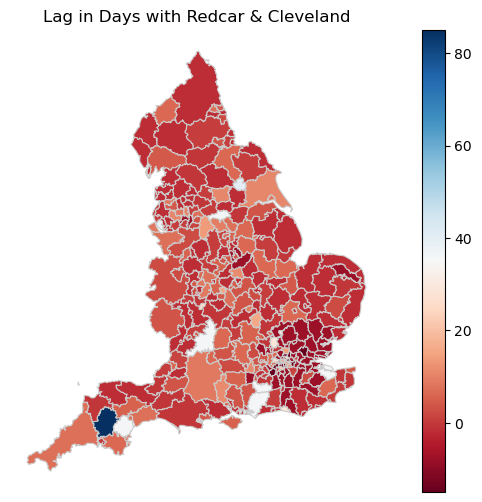

In [792]:
variable = 'Lag in Days'
vmin, vmax = -15, 85
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('Lag in Days with Redcar & Cleveland')
sm = plt.cm.ScalarMappable(cmap='RdBu', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

corr_testnew.plot(column=variable, cmap='RdBu', linewidth=0.8, ax=ax, edgecolor='0.8')

<AxesSubplot:title={'center':'Max Correlation with Redcar & Cleveland'}>

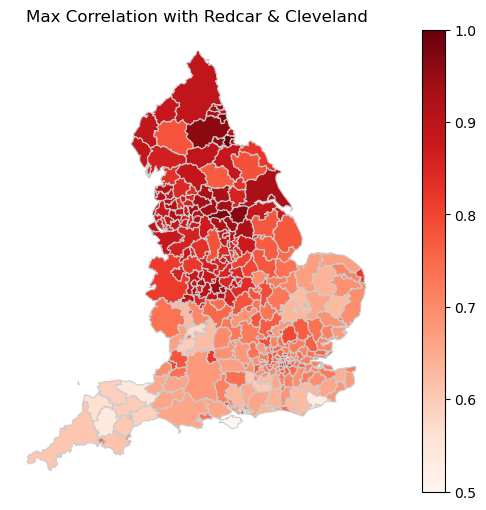

In [789]:
variable = 'Maximum Correlation'
vmin, vmax = 0.5, 1.0
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('Max Correlation with Redcar & Cleveland')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

corr_testnew.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')

Text(0, 0.5, 'ACF')

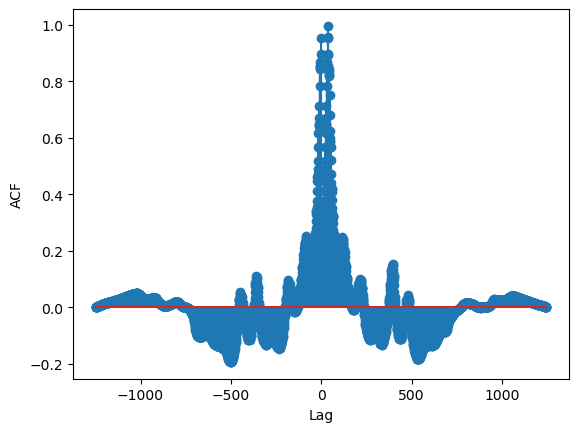

In [770]:
plt.stem(range(-len(test2)//2, len(test2)//2), test2)
plt.xlabel('Lag')
plt.ylabel('ACF')
# 95% UCL / LCL
#plt.axhline(-1.96/np.sqrt(len(test2)), color='k', ls='--') 
#plt.axhline(1.96/np.sqrt(len(test2)), color='k', ls='--')

## Defining COVID-19 Waves in England

First Wave: 1st March 2020 - 31st July 2020 


Second Wave: 1st September 2020 - 31st March 2021 


Third Wave: 1st June 2021 - 31st May 2022

In [822]:
start_date = '2020-03-01'
end_date = '2020-07-31'
mask = (casedata['date'] >= start_date) & (casedata['date'] <= end_date)
first_wave = casedata.loc[mask]
first_wave = first_wave.reset_index()

In [1021]:
start_date = '2020-09-01'
end_date = '2021-03-31'
mask = (casedata['date'] > start_date) & (casedata['date'] <= end_date)
second_wave = casedata.loc[mask]
second_wave = second_wave.reset_index()

In [1045]:
start_date = '2021-06-01'
end_date = '2022-05-31'
mask = (casedata['date'] > start_date) & (casedata['date'] <= end_date)
third_wave = casedata.loc[mask]
third_wave = third_wave.reset_index()

In [1046]:
test4 = itertools.combinations(range(len(ltlas)), 2)


In [826]:
start = time.time()

def cross_corr2(x, y):
    series1 = (first_wave.loc[first_wave['areaName'] == ltlas[x]])['newCasesBySpecimenDate']
    series2 = (first_wave.loc[first_wave['areaName'] == ltlas[y]])['newCasesBySpecimenDate']
    
    cc_forward = sm.tsa.stattools.ccf(series1, series2, adjusted = False)
    cc_backward = sm.tsa.stattools.ccf(series1[::-1], series2[::-1], adjusted = False)[::-1]
    
    return np.r_[cc_backward[:-1], cc_forward]
        #return scipy.stats.pearsonr(series1, series2)
#res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
firstwave_corrs = [cross_corr2(x, y) for x, y in itertools.combinations(range(len(ltlas)), 2)]



end= time.time()
print(end - start)

367.6242182254791


In [827]:
maxcorrs_fw = [max(firstwave_corrs[i]) for i in range(len(firstwave_corrs))]
lag_fw = [(list(firstwave_corrs[i])).index(max(list(firstwave_corrs[i]))) - (len(firstwave_corrs[i])/2) for i in range(len(firstwave_corrs))]

In [828]:
tuples_list2 = list(zip(ltlas1, ltlas2, maxcorrs_fw, lag_fw))

cc_firstwave = pd.DataFrame(tuples_list2, columns = ['LTLA 1','LTLA 2','Maximum Correlation', 'Lag in Days'])
cc_firstwave

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.597890,5.5
1,Redcar and Cleveland,Havant,0.705012,-6.5
2,Redcar and Cleveland,Surrey Heath,0.610272,-6.5
3,Redcar and Cleveland,Worthing,0.618926,-6.5
4,Redcar and Cleveland,Bolton,0.696269,8.5
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.476345,5.5
49451,Basingstoke and Deane,Hillingdon,0.750190,-3.5
49452,Tunbridge Wells,Rushcliffe,0.382597,-7.5
49453,Tunbridge Wells,Hillingdon,0.413961,-47.5


In [1078]:
cc_firstwave.to_csv('First_Wave_Corrs.csv', index=None)

In [830]:
cc_firstwave.nlargest(20, 'Maximum Correlation')

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
28571,Brent,Southwark,0.937753,5.5
33806,Southwark,Lambeth,0.934179,-0.5
28675,Brent,Croydon,0.925487,-0.5
3524,Wandsworth,Southwark,0.920782,-0.5
28676,Brent,Lambeth,0.917605,4.5
46793,Croydon,Lewisham,0.916885,5.5
3061,Barnet,Lewisham,0.914688,-0.5
28715,Brent,Lewisham,0.914135,5.5
2917,Barnet,Southwark,0.912025,-0.5
2852,Barnet,Camden,0.911921,-0.5


In [831]:
def cross_corr3(x, y):
    series1 = (second_wave.loc[second_wave['areaName'] == ltlas[x]])['newCasesBySpecimenDate']
    series2 = (second_wave.loc[second_wave['areaName'] == ltlas[y]])['newCasesBySpecimenDate']
    
    cc_forward = sm.tsa.stattools.ccf(series1, series2, adjusted = False)
    cc_backward = sm.tsa.stattools.ccf(series1[::-1], series2[::-1], adjusted = False)[::-1]
    
    return np.r_[cc_backward[:-1], cc_forward]
        #return scipy.stats.pearsonr(series1, series2)
#res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
secondwave_corrs = [cross_corr3(x, y) for x, y in itertools.combinations(range(len(ltlas)), 2)]

In [839]:
maxcorrs_sw = [max(secondwave_corrs[i]) for i in range(len(secondwave_corrs))]
lag_sw = [(list(secondwave_corrs[i])).index(max(list(secondwave_corrs[i]))) - (len(secondwave_corrs[i])/2) + 0.5  for i in range(len(secondwave_corrs))]

In [840]:
tuples_list3 = list(zip(ltlas1, ltlas2, maxcorrs_sw, lag_sw))

cc_secondwave = pd.DataFrame(tuples_list3, columns = ['LTLA 1','LTLA 2','Maximum Correlation', 'Lag in Days'])
cc_secondwave

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.693965,0.0
1,Redcar and Cleveland,Havant,0.611459,0.0
2,Redcar and Cleveland,Surrey Heath,0.565359,0.0
3,Redcar and Cleveland,Worthing,0.601492,0.0
4,Redcar and Cleveland,Bolton,0.724827,0.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.553512,0.0
49451,Basingstoke and Deane,Hillingdon,0.913231,0.0
49452,Tunbridge Wells,Rushcliffe,0.440782,0.0
49453,Tunbridge Wells,Hillingdon,0.922426,0.0


In [1077]:
cc_secondwave.to_csv('Second_Wave_Corrs.csv', index=None)

In [841]:
def cross_corr4(x, y):
    series1 = (third_wave.loc[third_wave['areaName'] == ltlas[x]])['newCasesBySpecimenDate']
    series2 = (third_wave.loc[third_wave['areaName'] == ltlas[y]])['newCasesBySpecimenDate']
    
    cc_forward = sm.tsa.stattools.ccf(series1, series2, adjusted = False)
    cc_backward = sm.tsa.stattools.ccf(series1[::-1], series2[::-1], adjusted = False)[::-1]
    
    return np.r_[cc_backward[:-1], cc_forward]
        #return scipy.stats.pearsonr(series1, series2)
#res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
thirdwave_corrs = [cross_corr4(x, y) for x, y in itertools.combinations(range(len(ltlas)), 2)]

In [842]:
maxcorrs_tw = [max(thirdwave_corrs[i]) for i in range(len(thirdwave_corrs))]
lag_tw = [(list(thirdwave_corrs[i])).index(max(list(thirdwave_corrs[i]))) - (len(thirdwave_corrs[i])/2) + 0.5  for i in range(len(thirdwave_corrs))]

In [843]:
tuples_list4 = list(zip(ltlas1, ltlas2, maxcorrs_tw, lag_tw))

cc_thirdwave = pd.DataFrame(tuples_list4, columns = ['LTLA 1','LTLA 2','Maximum Correlation', 'Lag in Days'])
cc_thirdwave

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.534703,0.0
1,Redcar and Cleveland,Havant,0.718688,0.0
2,Redcar and Cleveland,Surrey Heath,0.709259,0.0
3,Redcar and Cleveland,Worthing,0.615529,0.0
4,Redcar and Cleveland,Bolton,0.907420,0.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.917484,0.0
49451,Basingstoke and Deane,Hillingdon,0.906936,0.0
49452,Tunbridge Wells,Rushcliffe,0.903993,0.0
49453,Tunbridge Wells,Hillingdon,0.868682,0.0


In [1074]:
cc_thirdwave.to_csv('Third_Wave_Corrs.csv', index=None)

In [851]:
cc_thirdwave.nlargest(30, 'Lag in Days')

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
4999,Rossendale,Isle of Wight,0.515258,77.0
5000,Rossendale,Cornwall and Isles of Scilly,0.568857,77.0
5148,Rossendale,West Devon,0.508711,77.0
22836,Pendle,West Devon,0.506091,77.0
26247,Blackburn with Darwen,Isle of Wight,0.474757,77.0
26248,Blackburn with Darwen,Cornwall and Isles of Scilly,0.545761,77.0
26396,Blackburn with Darwen,West Devon,0.490405,77.0
30680,Ribble Valley,West Devon,0.556344,77.0
34866,Hyndburn,West Devon,0.500592,77.0
37155,Oldham,West Devon,0.484994,77.0


In [848]:
thirdwave_corrs[0]

array([ 0.00291984,  0.00577979,  0.0085499 ,  0.01138193,  0.01421656,
        0.01705059,  0.01982213,  0.02262509,  0.02521755,  0.02787738,
        0.03051192,  0.03317434,  0.03552064,  0.03802843,  0.04034455,
        0.0427429 ,  0.04506873,  0.04761253,  0.05021042,  0.05252775,
        0.05474127,  0.05651759,  0.05815401,  0.05988253,  0.06242419,
        0.0645009 ,  0.06622166,  0.06792551,  0.06928816,  0.07094987,
        0.07291814,  0.07501252,  0.07681079,  0.0776753 ,  0.07838731,
        0.07882812,  0.0796694 ,  0.08035299,  0.08170799,  0.08216465,
        0.08129545,  0.08041863,  0.07887801,  0.07701655,  0.07607953,
        0.0760696 ,  0.07566661,  0.07540187,  0.07494851,  0.07419475,
        0.07407473,  0.07405078,  0.0741433 ,  0.0742445 ,  0.07352197,
        0.07243651,  0.07066589,  0.06822347,  0.06761625,  0.06714177,
        0.06662346,  0.06502105,  0.06232019,  0.05890084,  0.05588425,
        0.05332841,  0.05276256,  0.05231317,  0.05069362,  0.04

In [854]:
test3 = thirdwave_corrs[3422]
test3 = list(test3)

Text(0, 0.5, 'ACF')

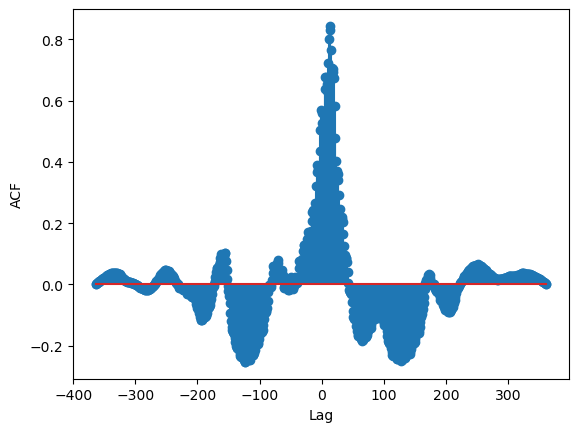

In [855]:
plt.stem(range(-len(test3)//2, len(test3)//2), test3)
plt.xlabel('Lag')
plt.ylabel('ACF')
# 95% UCL / LCL
#plt.axhline(-1.96/np.sqrt(len(test2)), color='k', ls='--') 
#plt.axhline(1.96/np.sqrt(len(test2)), color='k', ls='--')

# Calculating R Values

In [1172]:
casedata_r = casedata.set_index('date')

In [1173]:
casedata_r

,areaName,newCasesBySpecimenDate,All ages,"New Cases per 100,000 People",RGN19NM
date,,,,,
2023-07-04,Redcar and Cleveland,0,137150.0,0.000000,North East
2023-07-04,East Devon,1,146284.0,0.683602,South West
2023-07-04,Havant,1,126220.0,0.792267,South East
2023-07-04,Surrey Heath,0,89305.0,0.000000,South East
2023-07-04,Worthing,1,110570.0,0.904404,South East
...,...,...,...,...,...
2020-03-04,Basingstoke and Deane,1,176582.0,0.566309,South East
2020-03-04,Hillingdon,1,306870.0,0.325871,London
2020-03-03,South Hams,1,87004.0,1.149372,South West


In [858]:
casedata_r = casedata_r.drop(columns=['All ages', 'New Cases per 100,000 People'])
casedata_r

,areaName,newCasesBySpecimenDate
date,,
2023-07-04,Redcar and Cleveland,0
2023-07-04,East Devon,1
2023-07-04,Havant,1
2023-07-04,Surrey Heath,0
2023-07-04,Worthing,1
...,...,...
2020-03-04,Basingstoke and Deane,1
2020-03-04,Hillingdon,1
2020-03-03,South Hams,1


In [ ]:
casedata_r

In [886]:
casedata_r[casedata_r['newCasesBySpecimenDate'].isna()]

,areaName,newCasesBySpecimenDate
date,,


In [930]:
rseries = [(casedata_r.loc[casedata_r['areaName'] == ltlas[i]])['newCasesBySpecimenDate'] for i in range(len(ltlas))]


In [931]:
r_lists = [rseries[i].values.tolist() for i in range(len(ltlas))]

In [942]:
get_ltla = [casedata.loc[casedata['areaName'] == ltlas[i]] for i in range(len(ltlas))]



In [943]:
min_date = [(get_ltla[i])['date'].min() for i in range(len(ltlas))]

In [947]:
min_date[0]

'2020-03-10'

In [941]:
date_test = get_ltla[0]
date_test['date'].min()

'2020-03-10'

In [912]:
len(r_lists[0])

1212

In [950]:
r_series = [pd.Series(r_lists[i], index = pd.date_range(start = min_date[i], periods = len(r_lists[i]), freq = 'D')) for i in range(len(ltlas))]

In [951]:
r_series[0]

2020-03-10    0
2020-03-11    1
2020-03-12    3
2020-03-13    0
2020-03-14    0
             ..
2023-06-30    0
2023-07-01    0
2023-07-02    0
2023-07-03    0
2023-07-04    1
Freq: D, Length: 1212, dtype: int64

In [952]:
r_values = [covid19.r_covid(r_series[i], smoothing_window = 14, r_window_size = 7) for i in range(len(ltlas))]

In [1073]:
rvalues_df = pd.DataFrame(r_values, columns = ['cases', 'R_mean', 'R_var', 'Q0.025', 'Q0.5', 'Q0.975', 'LTLA'])


/Users/dansutton/opt/anaconda3/lib/python3.9/site-packages/pandas/core/internals/construction.py:576: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  values = np.array([convert(v) for v in values])


,cases
0,cases R_mean R_var Q0.02...
1,cases R_mean R_var Q0.02...
2,cases R_mean R_var Q0.02...
3,cases R_mean R_var Q0.02...
4,cases R_mean R_var Q0.02...
...,...
310,cases R_mean R_var Q0.02...
311,cases R_mean R_var Q0.02...
312,cases R_mean R_var Q0.02...
313,cases R_mean R_var Q0.02...


In [1069]:
r_values.to_csv('LTLA_R_Values.csv', index=None)

AttributeError: 'list' object has no attribute 'to_csv'

In [975]:
rvalues_ltla2 = r_values
rvalues_ltla3 = rvalues_ltla2[0].drop(columns = ['LTLA'])

In [980]:
r_values

[            cases    R_mean     R_var    Q0.025      Q0.5    Q0.975  \
 2020-03-24    1.0  1.603589  0.240238  0.784560  1.561724  2.662052   
 2020-03-25    0.0  1.804449  0.283304  0.918753  1.746542  2.964638   
 2020-03-26    0.0  1.967953  0.295104  1.019360  1.913394  3.191289   
 2020-03-27    1.0  2.024362  0.269101  1.141952  1.964358  3.189172   
 2020-03-28    1.0  1.999630  0.231633  1.170114  1.952144  3.067616   
 ...           ...       ...       ...       ...       ...       ...   
 2023-06-20    2.0  0.342670  0.019726  0.120769  0.323211  0.668650   
 2023-06-21    2.0  0.369355  0.027589  0.112812  0.341070  0.758324   
 2023-06-22    3.0  0.425935  0.044463  0.112199  0.390705  0.915949   
 2023-06-23    1.0  0.526643  0.079467  0.127225  0.477451  1.205534   
 2023-06-24    0.0  0.685279  0.144854  0.154548  0.617330  1.612580   
 
                             LTLA  
 2020-03-24  Redcar and Cleveland  
 2020-03-25  Redcar and Cleveland  
 2020-03-26  Redcar and Cl

In [983]:
test7 = r_values
(test7[4])['R_mean']

2020-03-30    1.381177
2020-03-31    1.376676
2020-04-01    1.373140
2020-04-02    1.391195
2020-04-03    1.385838
                ...   
2023-06-20    0.716159
2023-06-21    0.806381
2023-06-22    0.881729
2023-06-23    0.965075
2023-06-24    1.036068
Freq: D, Name: R_mean, Length: 1182, dtype: float64

In [965]:
test7['LTLA'] = ltlas[0]
test7

,cases,R_mean,R_var,Q0.025,Q0.5,Q0.975,LTLA
2020-03-24,1.0,1.603589,0.240238,0.784560,1.561724,2.662052,Redcar and Cleveland
2020-03-25,0.0,1.804449,0.283304,0.918753,1.746542,2.964638,Redcar and Cleveland
2020-03-26,0.0,1.967953,0.295104,1.019360,1.913394,3.191289,Redcar and Cleveland
2020-03-27,1.0,2.024362,0.269101,1.141952,1.964358,3.189172,Redcar and Cleveland
2020-03-28,1.0,1.999630,0.231633,1.170114,1.952144,3.067616,Redcar and Cleveland
...,...,...,...,...,...,...,...
2023-06-20,2.0,0.342670,0.019726,0.120769,0.323211,0.668650,Redcar and Cleveland
2023-06-21,2.0,0.369355,0.027589,0.112812,0.341070,0.758324,Redcar and Cleveland
2023-06-22,3.0,0.425935,0.044463,0.112199,0.390705,0.915949,Redcar and Cleveland
2023-06-23,1.0,0.526643,0.079467,0.127225,0.477451,1.205534,Redcar and Cleveland


In [966]:
rvalues_ltla = [rvalues_ltla[i] for i in range(len(ltlas))]

In [969]:
rvalues_ltla[0]

,cases,R_mean,R_var,Q0.025,Q0.5,Q0.975,LTLA
2020-03-24,1.0,1.603589,0.240238,0.784560,1.561724,2.662052,Redcar and Cleveland
2020-03-25,0.0,1.804449,0.283304,0.918753,1.746542,2.964638,Redcar and Cleveland
2020-03-26,0.0,1.967953,0.295104,1.019360,1.913394,3.191289,Redcar and Cleveland
2020-03-27,1.0,2.024362,0.269101,1.141952,1.964358,3.189172,Redcar and Cleveland
2020-03-28,1.0,1.999630,0.231633,1.170114,1.952144,3.067616,Redcar and Cleveland
...,...,...,...,...,...,...,...
2023-06-20,2.0,0.342670,0.019726,0.120769,0.323211,0.668650,Redcar and Cleveland
2023-06-21,2.0,0.369355,0.027589,0.112812,0.341070,0.758324,Redcar and Cleveland
2023-06-22,3.0,0.425935,0.044463,0.112199,0.390705,0.915949,Redcar and Cleveland
2023-06-23,1.0,0.526643,0.079467,0.127225,0.477451,1.205534,Redcar and Cleveland


In [970]:
add_ltla = [(rvalues_ltla['LTLA'] = ltlas[i]) for i in range(len(ltlas))]

TypeError: list indices must be integers or slices, not str

In [899]:
r_test = r_test.values.tolist()

In [900]:
test_ser = pd.Series(r_test, index=pd.date_range(date(2020,3,10), periods=1212))
test_ser

2020-03-10    0
2020-03-11    1
2020-03-12    3
2020-03-13    0
2020-03-14    0
             ..
2023-06-30    0
2023-07-01    0
2023-07-02    0
2023-07-03    0
2023-07-04    1
Freq: D, Length: 1212, dtype: int64

In [901]:
test_r = covid19.r_covid(test_ser, smoothing_window = 14, r_window_size = 7)

In [902]:
test_r

,cases,R_mean,R_var,Q0.025,Q0.5,Q0.975
2020-03-24,1.0,1.649431,0.275637,0.796619,1.606127,2.793859
2020-03-25,0.0,1.803182,0.299311,0.933020,1.747432,2.998459
2020-03-26,0.0,1.963187,0.295416,1.073970,1.894300,3.240624
2020-03-27,1.0,2.014675,0.258226,1.119333,1.959878,3.139353
2020-03-28,1.0,1.925273,0.215917,1.127973,1.889695,2.930727
...,...,...,...,...,...,...
2023-06-20,2.0,0.344018,0.019434,0.120305,0.323610,0.670496
2023-06-21,2.0,0.366847,0.027737,0.111885,0.344471,0.752091
2023-06-22,3.0,0.417773,0.042653,0.114469,0.384278,0.909296
2023-06-23,1.0,0.507579,0.073090,0.125284,0.465334,1.160790


In [908]:
test_r['areaName'] = ltlas[0]
test_r

,cases,R_mean,R_var,Q0.025,Q0.5,Q0.975,areaName
2020-03-24,1.0,1.649431,0.275637,0.796619,1.606127,2.793859,Redcar and Cleveland
2020-03-25,0.0,1.803182,0.299311,0.933020,1.747432,2.998459,Redcar and Cleveland
2020-03-26,0.0,1.963187,0.295416,1.073970,1.894300,3.240624,Redcar and Cleveland
2020-03-27,1.0,2.014675,0.258226,1.119333,1.959878,3.139353,Redcar and Cleveland
2020-03-28,1.0,1.925273,0.215917,1.127973,1.889695,2.930727,Redcar and Cleveland
...,...,...,...,...,...,...,...
2023-06-20,2.0,0.344018,0.019434,0.120305,0.323610,0.670496,Redcar and Cleveland
2023-06-21,2.0,0.366847,0.027737,0.111885,0.344471,0.752091,Redcar and Cleveland
2023-06-22,3.0,0.417773,0.042653,0.114469,0.384278,0.909296,Redcar and Cleveland
2023-06-23,1.0,0.507579,0.073090,0.125284,0.465334,1.160790,Redcar and Cleveland


In [986]:
start = time.time()

def r_cross_corr(x, y):
    
    series1 = (r_values[x])['R_mean']
    series2 = (r_values[y])['R_mean']
    
    cc_forward = sm.tsa.stattools.ccf(series1, series2, adjusted = False)
    cc_backward = sm.tsa.stattools.ccf(series1[::-1], series2[::-1], adjusted = False)[::-1]
    
    return np.r_[cc_backward[:-1], cc_forward]
        #return scipy.stats.pearsonr(series1, series2)
#res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
r_corrs = [r_cross_corr(x, y) for x, y in itertools.combinations(range(len(ltlas)), 2)]



end= time.time()
print(end - start)

67.21007680892944


In [990]:
r_max_corrs = [max(r_corrs[i]) for i in range(len(r_corrs))]

In [991]:
r_lag = [(list(r_corrs[i])).index(max(list(r_corrs[i]))) - (len(r_corrs[i])/2) + 0.5  for i in range(len(r_corrs))]

In [992]:
r_tuples_list = list(zip(ltlas1, ltlas2, r_max_corrs, r_lag))

r_cc = pd.DataFrame(r_tuples_list, columns = ['LTLA 1','LTLA 2','Maximum Correlation', 'Lag in Days'])
r_cc

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.657899,9.0
1,Redcar and Cleveland,Havant,0.550277,0.0
2,Redcar and Cleveland,Surrey Heath,0.450203,0.0
3,Redcar and Cleveland,Worthing,0.474090,0.0
4,Redcar and Cleveland,Bolton,0.468786,-4.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.406654,0.0
49451,Basingstoke and Deane,Hillingdon,0.406430,-5.0
49452,Tunbridge Wells,Rushcliffe,0.604155,5.0
49453,Tunbridge Wells,Hillingdon,0.359444,-10.0


In [1068]:
r_cc.to_csv('Whole_Pandemic_R.csv', index=None)

In [1016]:
r_cc.nlargest(20, 'Maximum Correlation')

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
3061,Barnet,Lewisham,0.858722,0.0
47610,Chichester,Teignbridge,0.817525,-4.0
48950,Halton,St. Helens,0.816338,1.0
25240,Vale of White Horse,South Oxfordshire,0.815025,3.0
33558,Liverpool,York,0.813637,2.0
48906,Lewisham,Ealing,0.813521,0.0
33845,Southwark,Lewisham,0.809276,0.0
8352,Cotswold,Chichester,0.803063,0.0
3074,Barnet,Ealing,0.799903,0.0
17081,Islington,Camden,0.798017,0.0


In [1057]:
firstwave_r = first_wave.set_index('date')
firstwave_r = firstwave_r.drop(columns=['All ages', 'New Cases per 100,000 People', 'index'])


In [1058]:
fw_rseries = [(firstwave_r.loc[firstwave_r['areaName'] == ltlas[i]])['newCasesBySpecimenDate'] for i in range(len(ltlas))]
fwr_lists = [fw_rseries[i].values.tolist() for i in range(len(ltlas))]
fw_get_ltla = [first_wave.loc[first_wave['areaName'] == ltlas[i]] for i in range(len(ltlas))]

In [1059]:
fw_min_date = [(fw_get_ltla[i])['date'].min() for i in range(len(ltlas))]
fw_r_series = [pd.Series(fwr_lists[i], index = pd.date_range(start = fw_min_date[i], periods = len(fwr_lists[i]), freq = 'D')) for i in range(len(ltlas))]


In [1060]:
fw_r_values = [covid19.r_covid(fw_r_series[i], smoothing_window = 14, r_window_size = 7) for i in range(len(ltlas))]

In [1061]:
def fwr_cross_corr(x, y):
    
    series1 = (fw_r_values[x])['R_mean']
    series2 = (fw_r_values[y])['R_mean']
    
    cc_forward = sm.tsa.stattools.ccf(series1, series2, adjusted = False)
    cc_backward = sm.tsa.stattools.ccf(series1[::-1], series2[::-1], adjusted = False)[::-1]
    
    return np.r_[cc_backward[:-1], cc_forward]
        #return scipy.stats.pearsonr(series1, series2)
#res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
fw_r_corrs = [fwr_cross_corr(x, y) for x, y in itertools.combinations(range(len(ltlas)), 2)]

In [1062]:
fwr_max_corrs = [max(fw_r_corrs[i]) for i in range(len(fw_r_corrs))]
fwr_lag = [(list(fw_r_corrs[i])).index(max(list(fw_r_corrs[i]))) - (len(fw_r_corrs[i])/2) + 0.5  for i in range(len(fw_r_corrs))]


In [1063]:
fwr_tuples_list = list(zip(ltlas1, ltlas2, fwr_max_corrs, fwr_lag))

fwr_cc = pd.DataFrame(fwr_tuples_list, columns = ['LTLA 1','LTLA 2','Maximum Correlation', 'Lag in Days'])
fwr_cc

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.720792,7.0
1,Redcar and Cleveland,Havant,0.684387,2.0
2,Redcar and Cleveland,Surrey Heath,0.750170,-3.0
3,Redcar and Cleveland,Worthing,0.701347,-5.0
4,Redcar and Cleveland,Bolton,0.675584,-17.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.603410,-3.0
49451,Basingstoke and Deane,Hillingdon,0.526178,-46.0
49452,Tunbridge Wells,Rushcliffe,0.673384,1.0
49453,Tunbridge Wells,Hillingdon,0.427123,-31.0


In [1067]:
fwr_cc.to_csv('First_Wave_R.csv', index=None)

54.74373197555542


,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.719346,-7.0
1,Redcar and Cleveland,Havant,0.707154,2.0
2,Redcar and Cleveland,Surrey Heath,0.758077,-3.0
3,Redcar and Cleveland,Worthing,0.708345,-5.0
4,Redcar and Cleveland,Bolton,0.682700,-17.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.593026,-3.0
49451,Basingstoke and Deane,Hillingdon,0.510823,-46.0
49452,Tunbridge Wells,Rushcliffe,0.660897,1.0
49453,Tunbridge Wells,Hillingdon,0.443901,-31.0


,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
48030,West Devon,Wigan,1.254849,-86.0
45459,North Devon,Daventry,1.131868,78.0
42853,Torridge,Wigan,1.105600,-94.0
4650,Winchester,Wiltshire,1.085761,-40.0
45479,North Devon,Birmingham,1.079921,-97.0
42841,Torridge,Sandwell,1.078723,87.0
42844,Torridge,"Kingston upon Hull, City of",1.063750,-90.0
45460,North Devon,Ashfield,1.058881,-19.0
24961,Ryedale,North East Derbyshire,1.055674,-8.0
14885,Maldon,Chiltern,1.042175,-26.0


In [1022]:
secondwave_r = second_wave.set_index('date')
secondwave_r = secondwave_r.drop(columns=['All ages', 'New Cases per 100,000 People', 'index'])

In [1023]:
sw_rseries = [(secondwave_r.loc[secondwave_r['areaName'] == ltlas[i]])['newCasesBySpecimenDate'] for i in range(len(ltlas))]
swr_lists = [sw_rseries[i].values.tolist() for i in range(len(ltlas))]
sw_get_ltla = [second_wave.loc[second_wave['areaName'] == ltlas[i]] for i in range(len(ltlas))]

In [1024]:
sw_min_date = [(sw_get_ltla[i])['date'].min() for i in range(len(ltlas))]
sw_r_series = [pd.Series(swr_lists[i], index = pd.date_range(start = sw_min_date[i], periods = len(swr_lists[i]), freq = 'D')) for i in range(len(ltlas))]

In [1025]:
sw_r_values = [covid19.r_covid(sw_r_series[i], smoothing_window = 14, r_window_size = 7) for i in range(len(ltlas))]

In [1083]:
sw_r_values

[            cases    R_mean     R_var    Q0.025      Q0.5    Q0.975
 2020-09-09    2.0  1.262473  0.019655  1.000850  1.257421  1.544507
 2020-09-10    7.0  1.264534  0.018809  1.007544  1.258944  1.551149
 2020-09-11   20.0  1.256209  0.017756  1.007819  1.251422  1.536628
 2020-09-12   18.0  1.222501  0.015954  0.989022  1.218494  1.487552
 2020-09-13    6.0  1.171405  0.014614  0.946292  1.167312  1.417069
 ...           ...       ...       ...       ...       ...       ...
 2021-03-17   13.0  0.723244  0.026726  0.436743  0.710133  1.071298
 2021-03-18    4.0  0.728935  0.029492  0.433693  0.716255  1.096615
 2021-03-19    2.0  0.768100  0.034490  0.448296  0.752276  1.161793
 2021-03-20    2.0  0.852127  0.042414  0.494754  0.835973  1.302639
 2021-03-21    2.0  0.994151  0.055325  0.586468  0.975603  1.507794
 
 [194 rows x 6 columns],
             cases    R_mean     R_var    Q0.025      Q0.5    Q0.975
 2020-09-10    2.0  1.317809  0.028082  1.010167  1.310736  1.670593
 2020-0

In [1087]:
test5 = sw_r_values[0]
test5.iloc[[0], [1]]

,R_mean
2020-09-09,1.262473


In [1089]:
test5.loc[['2020-09-10'], ['R_mean']]

,R_mean
2020-09-10,1.264534


In [1153]:
test11 = (sw_r_values[0]).loc[['2021-03-20'], ['R_mean']]
test11

,R_mean
2021-03-20,0.852127


In [1155]:
r_map_test = [(sw_r_values[i]).iloc[[0], [1]] for i in range(len(ltlas))]


In [1131]:
test14 = r_map_test[0]
test14.iloc[0]

R_mean    1.262473
Name: 2020-09-09 00:00:00, dtype: float64

In [1138]:
r_map_list = [(r_map_test[i]).iloc[0].tolist() for i in range(len(r_map_test))]
r_map_list2 = [(r_map_list[i])[0] for i in range(len(r_map_list))]

In [1139]:
r_map_list2

[1.2624725028412633,
 1.317809193556964,
 1.1586526276776412,
 1.2784781638286271,
 1.118653115916213,
 1.0668393968178798,
 0.9068257140581051,
 1.192722719620257,
 1.206928202951472,
 0.9176455110133167,
 1.243612183812453,
 1.0676539089614925,
 1.2709546040652435,
 1.1037444541476922,
 1.1338285275016262,
 1.5730803052699591,
 1.5554785126603332,
 1.0831060381281097,
 1.0734541418823484,
 1.388296004110058,
 1.0615129291778356,
 1.3712386338205742,
 1.0243252855438394,
 1.1365046783097548,
 1.2947924006795617,
 1.33748981601207,
 1.3112217812462656,
 1.0985666935406184,
 1.12658947383327,
 1.2437459657191288,
 1.1583150838263312,
 1.080123379222832,
 1.4730276025428144,
 1.2699148230262438,
 0.7987552300858123,
 1.0290698218145449,
 1.0862372016295823,
 1.064127646386428,
 1.239352420723404,
 1.2559106906937985,
 1.5340378254221814,
 1.738526901277736,
 1.0959865008305476,
 0.8829270744130362,
 1.6023437853371911,
 1.2475698407560583,
 0.8461001377615803,
 1.1488470561567863,
 1.232

In [1147]:
tuples_list_map = list(zip(ltlas, r_map_list2))

r_map_values = pd.DataFrame(tuples_list_map, columns = ['LTLA','R Value'])
r_map_values.nsmallest(10, 'R Value')

,LTLA,R Value
175,Wealden,0.722859
34,Newcastle upon Tyne,0.798755
142,Hart,0.809631
290,Epsom and Ewell,0.817336
200,Gloucester,0.830727
251,South Norfolk,0.843088
46,Kensington and Chelsea,0.846100
280,Bexley,0.865285
228,Hinckley and Bosworth,0.866411
217,Craven,0.870394


In [1149]:
r_map_new = r_map_values.set_index('LTLA')
r_map_new = r_map_new.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})
r_map_new

,R Value
LTLA,
Redcar and Cleveland,1.262473
East Devon,1.317809
Havant,1.158653
Surrey Heath,1.278478
Worthing,1.118653
...,...
Colchester,1.312198
Basingstoke and Deane,1.145922
Tunbridge Wells,1.197030


In [1150]:
r_map_join = map_df.set_index('LAD19NM').join(r_map_new)
r_map_join

,LAD19CD,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,R Value
LAD19NM,,,,,,,,,
Hartlepool,E06000001,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",1.125813
Middlesbrough,E06000002,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",1.071486
Redcar and Cleveland,E06000003,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",1.262473
Stockton-on-Tees,E06000004,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",1.029070
Darlington,E06000005,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",1.232986
...,...,...,...,...,...,...,...,...,...
Sutton,E09000029,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",1.158193
Tower Hamlets,E09000030,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",1.022553
Waltham Forest,E09000031,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",1.085670


<AxesSubplot:title={'center':'R Values at Beginning of Second Wave'}>

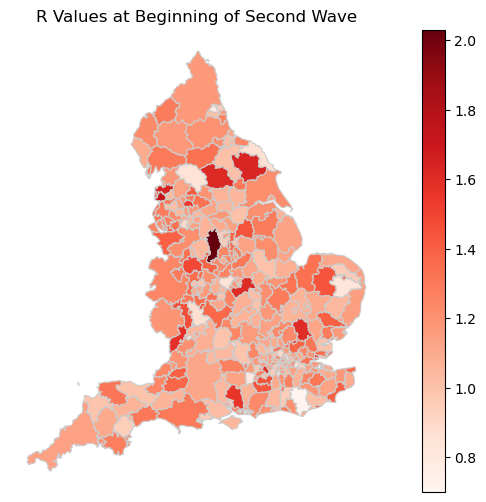

In [1151]:
variable = 'R Value'
vmin, vmax = 0.7, 2.03
fig, ax = plt.subplots(1, figsize =(10, 6))
ax.axis('off')
ax.set_title('R Values at Beginning of Second Wave')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

r_map_join.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')

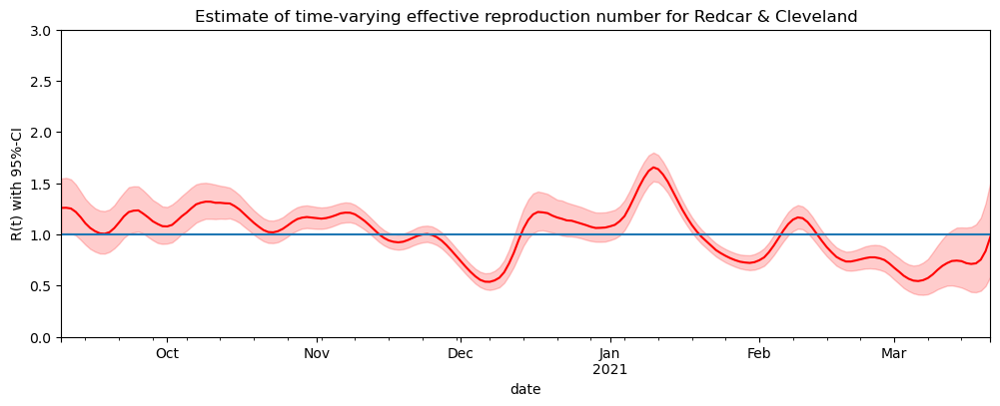

In [1038]:
fig, ax = plt.subplots(1,1, figsize=(12, 4))

test5.loc[:,'Q0.5'].plot(ax=ax, color='red')
ax.fill_between(test5.index, 
                    test5['Q0.025'], 
                    test5['Q0.975'], 
                    color='red', alpha=0.2)
ax.set_xlabel('date')
ax.set_ylabel('R(t) with 95%-CI')
ax.set_ylim([0,3])
ax.axhline(y=1)
ax.set_title('Estimate of time-varying effective reproduction number for Redcar & Cleveland')
plt.show()

In [1040]:
def swr_cross_corr(x, y):
    
    series1 = (sw_r_values[x])['R_mean']
    series2 = (sw_r_values[y])['R_mean']
    
    cc_forward = sm.tsa.stattools.ccf(series1, series2, adjusted = False)
    cc_backward = sm.tsa.stattools.ccf(series1[::-1], series2[::-1], adjusted = False)[::-1]
    
    return np.r_[cc_backward[:-1], cc_forward]
        #return scipy.stats.pearsonr(series1, series2)
#res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
sw_r_corrs = [swr_cross_corr(x, y) for x, y in itertools.combinations(range(len(ltlas)), 2)]

In [1041]:
swr_max_corrs = [max(sw_r_corrs[i]) for i in range(len(sw_r_corrs))]
swr_lag = [(list(sw_r_corrs[i])).index(max(list(sw_r_corrs[i]))) - (len(sw_r_corrs[i])/2) + 0.5  for i in range(len(sw_r_corrs))]

In [1042]:
swr_tuples_list = list(zip(ltlas1, ltlas2, swr_max_corrs, swr_lag))

swr_cc = pd.DataFrame(swr_tuples_list, columns = ['LTLA 1','LTLA 2','Maximum Correlation', 'Lag in Days'])
swr_cc

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.510294,2.0
1,Redcar and Cleveland,Havant,0.513457,1.0
2,Redcar and Cleveland,Surrey Heath,0.556980,0.0
3,Redcar and Cleveland,Worthing,0.369575,0.0
4,Redcar and Cleveland,Bolton,0.681294,2.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.586482,-3.0
49451,Basingstoke and Deane,Hillingdon,0.785477,-9.0
49452,Tunbridge Wells,Rushcliffe,0.376819,2.0
49453,Tunbridge Wells,Hillingdon,0.583710,-2.0


In [1066]:
swr_cc.to_csv('Second_Wave_R.csv', index=None)

In [1047]:
thirdwave_r = third_wave.set_index('date')
thirdwave_r = thirdwave_r.drop(columns=['All ages', 'New Cases per 100,000 People', 'index'])

In [1048]:
tw_rseries = [(thirdwave_r.loc[thirdwave_r['areaName'] == ltlas[i]])['newCasesBySpecimenDate'] for i in range(len(ltlas))]
twr_lists = [tw_rseries[i].values.tolist() for i in range(len(ltlas))]
tw_get_ltla = [third_wave.loc[third_wave['areaName'] == ltlas[i]] for i in range(len(ltlas))]

In [1049]:
tw_min_date = [(tw_get_ltla[i])['date'].min() for i in range(len(ltlas))]
tw_r_series = [pd.Series(twr_lists[i], index = pd.date_range(start = tw_min_date[i], periods = len(twr_lists[i]), freq = 'D')) for i in range(len(ltlas))]

In [1050]:
tw_r_values = [covid19.r_covid(tw_r_series[i], smoothing_window = 14, r_window_size = 7) for i in range(len(ltlas))]

In [1051]:
test10 = tw_r_values[0]

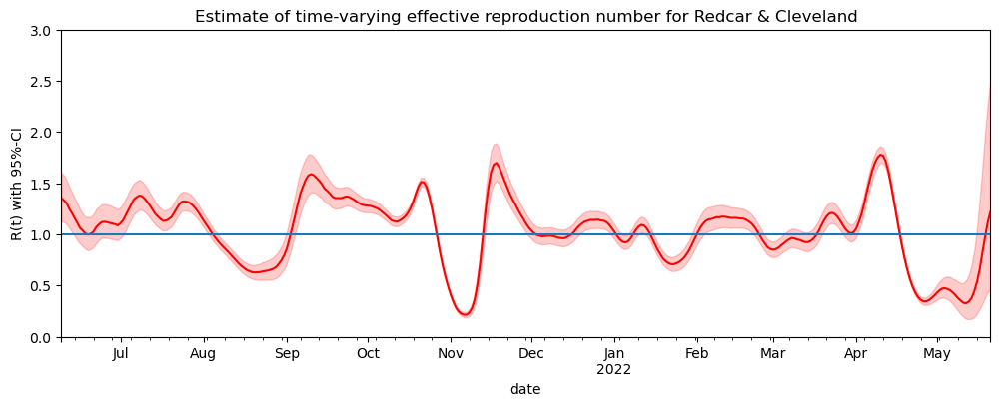

In [1052]:
fig, ax = plt.subplots(1,1, figsize=(12, 4))

test10.loc[:,'Q0.5'].plot(ax=ax, color='red')
ax.fill_between(test10.index, 
                    test10['Q0.025'], 
                    test10['Q0.975'], 
                    color='red', alpha=0.2)
ax.set_xlabel('date')
ax.set_ylabel('R(t) with 95%-CI')
ax.set_ylim([0,3])
ax.axhline(y=1)
ax.set_title('Estimate of time-varying effective reproduction number for Redcar & Cleveland')
plt.show()

In [1053]:
def twr_cross_corr(x, y):
    
    series1 = (tw_r_values[x])['R_mean']
    series2 = (tw_r_values[y])['R_mean']
    
    cc_forward = sm.tsa.stattools.ccf(series1, series2, adjusted = False)
    cc_backward = sm.tsa.stattools.ccf(series1[::-1], series2[::-1], adjusted = False)[::-1]
    
    return np.r_[cc_backward[:-1], cc_forward]
        #return scipy.stats.pearsonr(series1, series2)
#res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
tw_r_corrs = [twr_cross_corr(x, y) for x, y in itertools.combinations(range(len(ltlas)), 2)]

In [1054]:
twr_max_corrs = [max(tw_r_corrs[i]) for i in range(len(tw_r_corrs))]
twr_lag = [(list(tw_r_corrs[i])).index(max(list(tw_r_corrs[i]))) - (len(tw_r_corrs[i])/2) + 0.5  for i in range(len(tw_r_corrs))]

In [1055]:
twr_tuples_list = list(zip(ltlas1, ltlas2, twr_max_corrs, twr_lag))

twr_cc = pd.DataFrame(twr_tuples_list, columns = ['LTLA 1','LTLA 2','Maximum Correlation', 'Lag in Days'])
twr_cc

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.729717,-3.0
1,Redcar and Cleveland,Havant,0.792831,-2.0
2,Redcar and Cleveland,Surrey Heath,0.567554,-2.0
3,Redcar and Cleveland,Worthing,0.642351,-3.0
4,Redcar and Cleveland,Bolton,0.702724,-1.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.817918,-1.0
49451,Basingstoke and Deane,Hillingdon,0.862722,0.0
49452,Tunbridge Wells,Rushcliffe,0.859649,0.0
49453,Tunbridge Wells,Hillingdon,0.837198,1.0


In [ ]:
twr_cc.to_csv('Third_Wave_R.csv', index=None)

# Correlation/Lag Analysis

## Whole Dataset Positive Cases

In [408]:
pandemicp_cc = pd.read_csv('Whole_Pandemic_Corrs.csv')

In [362]:
pandemicp_cc.describe()

,Maximum Correlation,Lag in Days
count,49455.000000,49455.000000
mean,0.865241,2.638004
std,0.065229,9.000761
min,0.511161,-77.500000
25%,0.829014,-1.500000
50%,0.875875,-0.500000
75%,0.913302,5.500000
max,0.998398,94.500000


In [409]:
pandemicp_cc = pandemicp_cc.set_index('LTLA 1')
pandemicp_cc = pandemicp_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [410]:
pandemicp_cc = pandemicp_cc.reset_index()

In [411]:
pandemicp_cc = pandemicp_cc.set_index('LTLA 2')
pandemicp_cc = pandemicp_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [412]:
pandemicp_cc = pandemicp_cc.reset_index()
pandemicp_cc

,LTLA 2,LTLA 1,Maximum Correlation,Lag in Days
0,East Devon,Redcar and Cleveland,0.684507,7.5
1,Havant,Redcar and Cleveland,0.762000,-1.5
2,Surrey Heath,Redcar and Cleveland,0.759980,-1.5
3,Worthing,Redcar and Cleveland,0.696813,-1.5
4,Bolton,Redcar and Cleveland,0.908389,8.5
...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,0.911049,-1.5
49451,Hillingdon,Basingstoke and Deane,0.902859,1.5
49452,Rushcliffe,Tunbridge Wells,0.924659,3.5
49453,Hillingdon,Tunbridge Wells,0.893895,13.5


In [413]:
pandemicp_cc = pandemicp_cc.loc[pandemicp_cc['LTLA 2'] != 'Hackney and City of London']
pandemicp_cc = pandemicp_cc.loc[pandemicp_cc['LTLA 1'] != 'Hackney and City of London']
pandemicp_cc['Distance between centroids'] = ltla_distances
pandemicp_cc['Distance between centroids'] = pandemicp_cc['Distance between centroids'] / 1000

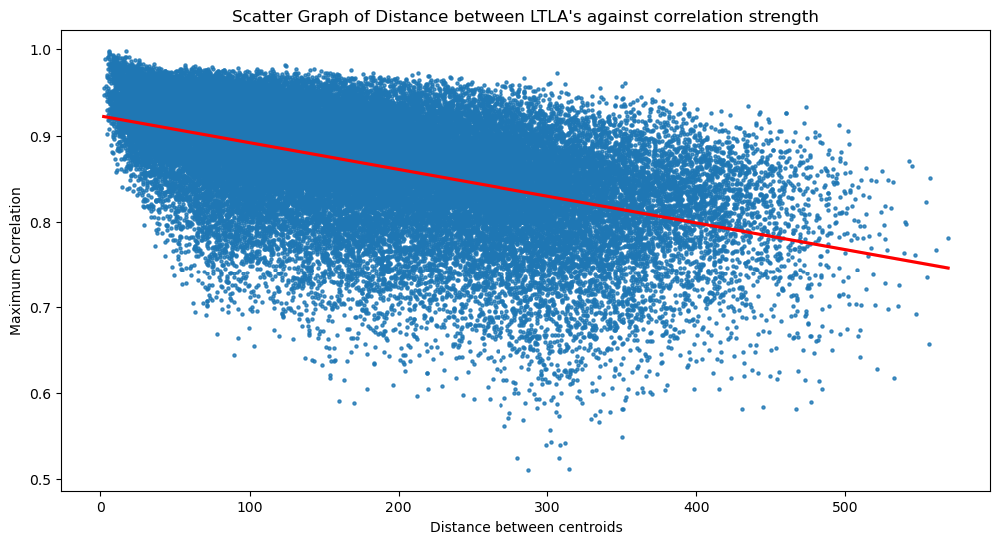

In [368]:
plt.figure(figsize=(12,6))

sns.regplot(data = pandemicp_cc, x = "Distance between centroids", y = "Maximum Correlation", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [369]:
from scipy.stats import pearsonr
data1 = pandemicp_cc['Distance between centroids']
data2 = pandemicp_cc['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.498


In [379]:
abs_lag = pandemicp_cc

In [380]:
abs_lag['Lag in Days'] = abs(abs_lag['Lag in Days'])
abs_lag

,LTLA 2,LTLA 1,Maximum Correlation,Lag in Days,Distance between centroids
0,East Devon,Redcar and Cleveland,0.684507,7.5,446.686187
1,Havant,Redcar and Cleveland,0.762000,1.5,411.943769
2,Surrey Heath,Redcar and Cleveland,0.759980,1.5,357.783404
3,Worthing,Redcar and Cleveland,0.696813,1.5,416.062959
4,Bolton,Redcar and Cleveland,0.908389,8.5,143.901356
...,...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,0.911049,1.5,181.384385
49451,Hillingdon,Basingstoke and Deane,0.902859,1.5,60.445984
49452,Rushcliffe,Tunbridge Wells,0.924659,3.5,222.863872
49453,Hillingdon,Tunbridge Wells,0.893895,13.5,77.442951


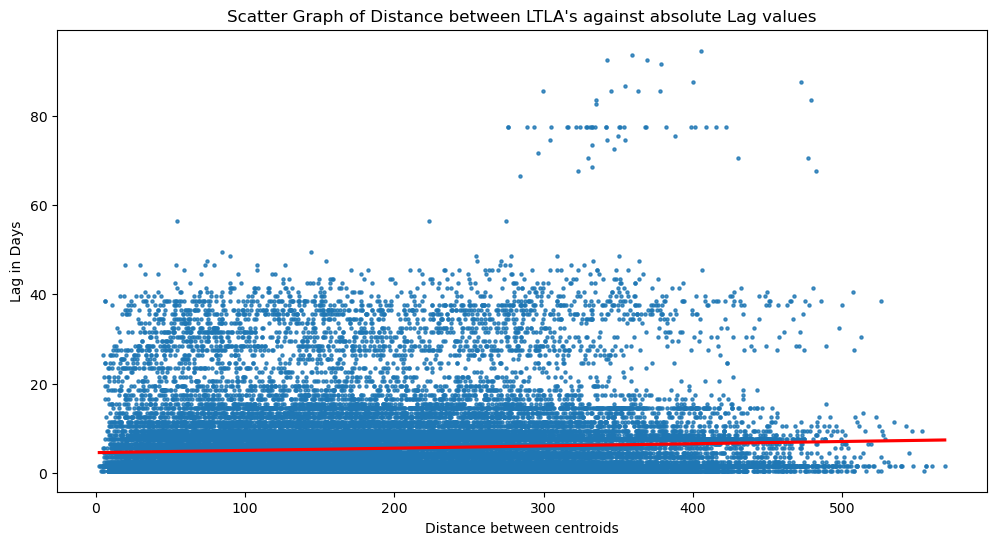

In [381]:
plt.figure(figsize=(12,6))

sns.regplot(data = abs_lag, x = "Distance between centroids", y = "Lag in Days", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against absolute Lag values")

plt.show()

In [382]:
from scipy.stats import pearsonr
data1 = abs_lag['Distance between centroids']
data2 = abs_lag['Lag in Days']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.068


In [414]:
pandemicp_top_cc = pandemicp_cc.nlargest(5000,'Maximum Correlation')
pandemicp_top_cc

,LTLA 2,LTLA 1,Maximum Correlation,Lag in Days,Distance between centroids
42518,Lewisham,Haringey,0.998398,25.5,16.912316
28918,Lewisham,Greenwich,0.997848,24.5,5.957507
13230,Liverpool,Knowsley,0.996535,38.5,5.990289
28728,Ealing,Brent,0.995157,24.5,6.048477
3378,Ealing,Hounslow,0.994869,19.5,6.361900
...,...,...,...,...,...
28299,Gedling,Sefton,0.938607,16.5,138.265853
39828,East Hertfordshire,Wealden,0.938604,9.5,100.956916
30916,North Warwickshire,East Staffordshire,0.938599,4.5,37.165325
37448,Sutton,Newham,0.938595,4.5,23.739740


In [415]:
pandemicp_top_cc.describe()

,Maximum Correlation,Lag in Days,Distance between centroids
count,5000.000000,5000.00000,5000.000000
mean,0.953695,7.16760,94.892091
std,0.010838,9.55283,66.467612
min,0.938589,-7.50000,2.246661
25%,0.944698,1.50000,41.934112
50%,0.951903,4.50000,79.443692
75%,0.960971,8.50000,134.356645
max,0.998398,56.50000,377.846994


In [443]:
pand_ltla1_top = pandemicp_top_cc['LTLA 1'].value_counts()
pand_ltla2_top = pandemicp_top_cc['LTLA 2'].value_counts()

In [444]:
pand_topcc = pd.DataFrame(pand_ltla1_top)
pand_topcc = pand_topcc.rename(columns = {'LTLA 1':'No. Correlations 1'})

In [445]:
pand_topcc = pand_topcc.reset_index()


In [446]:
pand_topcc2 = pd.DataFrame(pand_ltla2_top)
pand_topcc2 = pand_topcc2.rename(columns = {'LTLA 2':'No. Correlations 2'})

In [447]:
pand_topcc2 = pand_topcc2.reset_index()

In [448]:
pand_topcc2

,index,No. Correlations 2
0,Stevenage,105
1,Basingstoke and Deane,85
2,Southampton,77
3,Chichester,74
4,Lichfield,69
...,...,...
274,Nottingham,1
275,Babergh,1
276,South Holland,1
277,Barnet,1


In [449]:
map_df_topcc = map_df.merge(pand_topcc,how='left', left_on = 'LAD19NM', right_on='index')


In [450]:
map_df_topcc = map_df_topcc.merge(pand_topcc2,how='left', left_on = 'LAD19NM', right_on='index')
map_df_topcc

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,index_x,No. Correlations 1,index_y,No. Correlations 2
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,1.0,Hartlepool,2.0
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,3.0,NaN,NaN
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,11.0,NaN,NaN
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,24.0,Stockton-on-Tees,3.0
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),Darlington,9.0,Darlington,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,10.0,Sutton,40.0
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,12.0,Tower Hamlets,3.0
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,18.0,Waltham Forest,9.0
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,11.0,NaN,NaN


In [451]:
map_df_topcc["No. Correlations 1"] = map_df_topcc["No. Correlations 1"].fillna(0)
map_df_topcc["No. Correlations 2"] = map_df_topcc["No. Correlations 2"].fillna(0)

In [452]:
map_df_topcc['No. Correlations'] = map_df_topcc["No. Correlations 1"] + map_df_topcc["No. Correlations 2"]


,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,index_x,No. Correlations 1,index_y,No. Correlations 2,No. Correlations
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,1.0,Hartlepool,2.0,3.0
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,3.0,NaN,0.0,3.0
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,11.0,NaN,0.0,11.0
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,24.0,Stockton-on-Tees,3.0,27.0
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),Darlington,9.0,Darlington,6.0,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,10.0,Sutton,40.0,50.0
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,12.0,Tower Hamlets,3.0,15.0
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,18.0,Waltham Forest,9.0,27.0
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,11.0,NaN,0.0,11.0


,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,index_x,No. Correlations 1,index_y,No. Correlations 2,No. Correlations
244,E07000243,Stevenage,NaN,524622,224531,-0.18987,51.9054,5a10136d-43b4-4ed3-bd7d-d13cc9cf3fcb,"POLYGON ((525826.204 221215.497, 524544.303 22...",POINT (524576.985 224399.559),NaN,0.0,Stevenage,105.0,105.0
42,E06000045,Southampton,NaN,442253,113608,-1.40025,50.9204,53d9438c-7628-4a96-80ba-ec0d50531b4d,"POLYGON ((436828.801 114465.220, 438763.503 11...",POINT (442373.831 113537.895),Southampton,16.0,Southampton,77.0,93.0
219,E07000214,Surrey Heath,NaN,491362,160483,-0.68986,51.3361,6a80d4cf-b3f8-4532-8dec-9648f52b217a,"POLYGON ((496215.798 166832.904, 499361.198 16...",POINT (492689.382 161238.561),Surrey Heath,88.0,NaN,0.0,88.0
110,E07000084,Basingstoke and Deane,NaN,454508,151423,-1.22021,51.2594,e22fc013-2390-4ae8-9098-80b82298382b,"POLYGON ((439824.503 159869.997, 438804.704 16...",POINT (455884.552 152949.361),NaN,0.0,Basingstoke and Deane,85.0,85.0
185,E07000169,Selby,NaN,457551,426670,-1.12908,53.7333,5b162d86-888c-4c9b-84a5-79434c98bf7e,"POLYGON ((452922.697 447657.799, 458933.703 44...",POINT (457067.088 432609.146),Selby,85.0,NaN,0.0,85.0


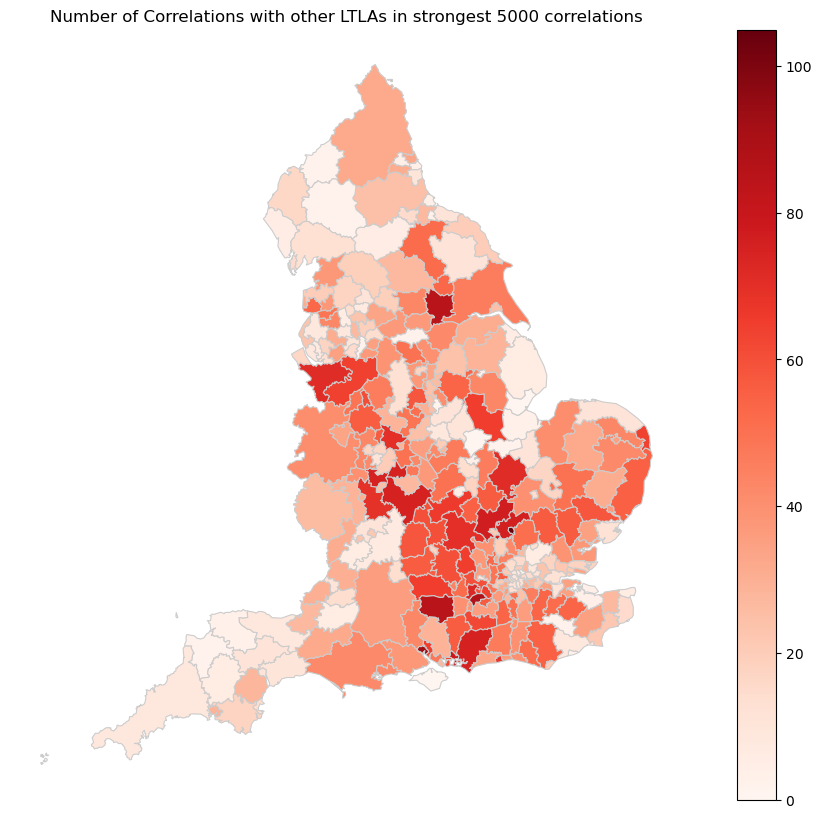

In [466]:
variable = 'No. Correlations'
vmin, vmax = 0.0, 105.0
fig, ax = plt.subplots(1, figsize =(14, 10))
ax.axis('off')
ax.set_title('Number of Correlations with other LTLAs in strongest 5000 correlations')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

map_df_topcc.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [431]:
map_df = map_df.merge(pand_topcc2,how='left', left_on = 'LAD19NM', right_on='index')
map_df

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,index_x,No. Correlations 1_x,level_0,index_y,No. Correlations 1_y
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,1.0,285.0,Hartlepool,1.0
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),Middlesbrough,3.0,240.0,Middlesbrough,3.0
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,11.0,158.0,Redcar and Cleveland,11.0
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,24.0,73.0,Stockton-on-Tees,24.0
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),Darlington,9.0,176.0,Darlington,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,10.0,165.0,Sutton,10.0
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,12.0,145.0,Tower Hamlets,12.0
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,18.0,101.0,Waltham Forest,18.0
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,11.0,159.0,Wandsworth,11.0


In [422]:
top_cctest2 = pd.DataFrame(pand_ltla2_top)
top_cctest2

,LTLA 2
Stevenage,105
Basingstoke and Deane,85
Southampton,77
Chichester,74
Lichfield,69
...,...
Nottingham,1
Babergh,1
South Holland,1
Barnet,1


## First Wave Positive Cases

In [351]:
firstwp_cc = pd.read_csv('First_Wave_Corrs.csv')

In [352]:
firstwp_cc.describe()

,Maximum Correlation,Lag in Days
count,49455.000000,49455.000000
mean,0.572610,-0.470620
std,0.126334,16.448681
min,0.155391,-114.500000
25%,0.492566,-7.500000
50%,0.584112,-0.500000
75%,0.662450,6.500000
max,0.937753,114.500000


In [353]:
firstwp_cc = firstwp_cc.set_index('LTLA 1')
firstwp_cc = firstwp_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [354]:
firstwp_cc = firstwp_cc.reset_index()

In [355]:
firstwp_cc = firstwp_cc.set_index('LTLA 2')
firstwp_cc = firstwp_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [356]:
firstwp_cc = firstwp_cc.reset_index()
firstwp_cc

,LTLA 2,LTLA 1,Maximum Correlation,Lag in Days
0,East Devon,Redcar and Cleveland,0.597890,5.5
1,Havant,Redcar and Cleveland,0.705012,-6.5
2,Surrey Heath,Redcar and Cleveland,0.610272,-6.5
3,Worthing,Redcar and Cleveland,0.618926,-6.5
4,Bolton,Redcar and Cleveland,0.696269,8.5
...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,0.476345,5.5
49451,Hillingdon,Basingstoke and Deane,0.750190,-3.5
49452,Rushcliffe,Tunbridge Wells,0.382597,-7.5
49453,Hillingdon,Tunbridge Wells,0.413961,-47.5


In [357]:
firstwp_cc = firstwp_cc.loc[firstwp_cc['LTLA 2'] != 'Hackney and City of London']
firstwp_cc = firstwp_cc.loc[firstwp_cc['LTLA 1'] != 'Hackney and City of London']
firstwp_cc['Distance between centroids'] = ltla_distances
firstwp_cc['Distance between centroids'] = firstwp_cc['Distance between centroids'] / 1000

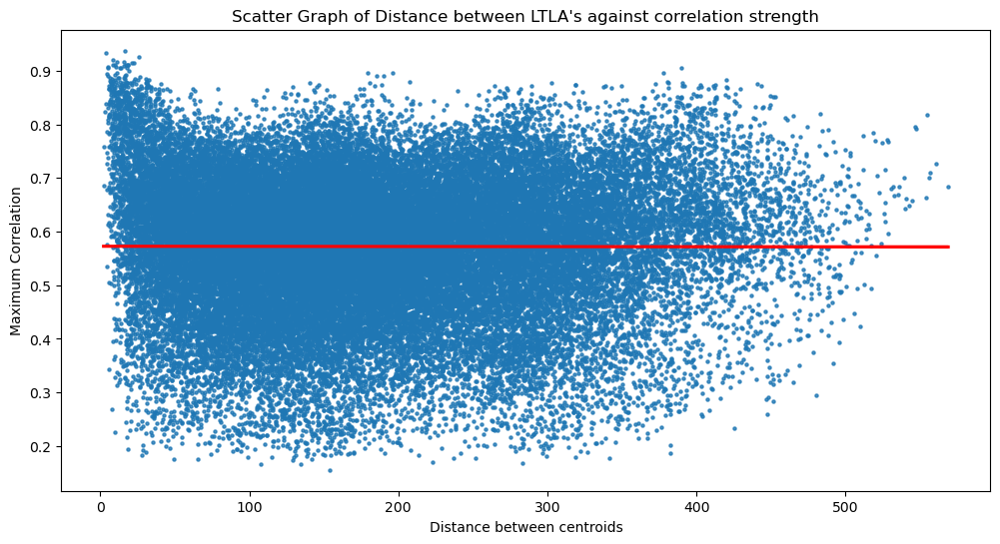

In [358]:
plt.figure(figsize=(12,6))

sns.regplot(data = firstwp_cc, x = "Distance between centroids", y = "Maximum Correlation", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [360]:
from scipy.stats import pearsonr
data1 = firstwp_cc['Distance between centroids']
data2 = firstwp_cc['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.002


In [383]:
fwp_abs_lag = firstwp_cc

In [384]:
fwp_abs_lag['Lag in Days'] = abs(fwp_abs_lag['Lag in Days'])


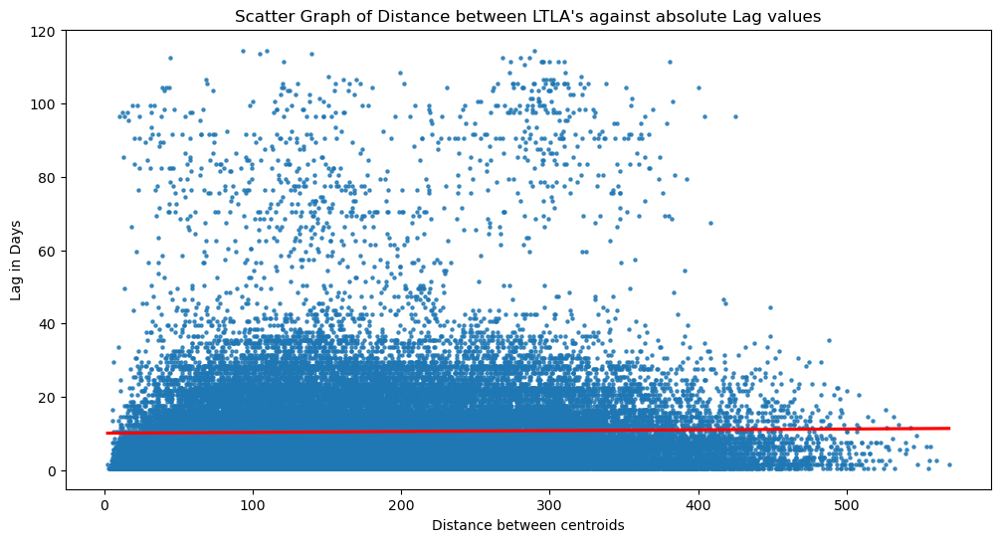

In [385]:
plt.figure(figsize=(12,6))

sns.regplot(data = fwp_abs_lag, x = "Distance between centroids", y = "Lag in Days", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against absolute Lag values")

plt.show()

In [386]:
from scipy.stats import pearsonr
data1 = fwp_abs_lag['Distance between centroids']
data2 = fwp_abs_lag['Lag in Days']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.019


## Second Wave Positive Cases

In [342]:
secondwp_cc = pd.read_csv('Second_Wave_Corrs.csv')

In [343]:
secondwp_cc.describe()

,Maximum Correlation,Lag in Days
count,49455.000000,49455.000000
mean,0.743703,-0.630553
std,0.141329,23.973519
min,0.223044,-119.000000
25%,0.635335,0.000000
50%,0.759074,0.000000
75%,0.863976,0.000000
max,0.992296,105.000000


In [344]:
secondwp_cc = secondwp_cc.set_index('LTLA 1')
secondwp_cc = secondwp_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [345]:
secondwp_cc = secondwp_cc.reset_index()

In [346]:
secondwp_cc = secondwp_cc.set_index('LTLA 2')
secondwp_cc = secondwp_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [347]:
secondwp_cc = secondwp_cc.reset_index()
secondwp_cc

,LTLA 2,LTLA 1,Maximum Correlation,Lag in Days
0,East Devon,Redcar and Cleveland,0.693965,0.0
1,Havant,Redcar and Cleveland,0.611459,0.0
2,Surrey Heath,Redcar and Cleveland,0.565359,0.0
3,Worthing,Redcar and Cleveland,0.601492,0.0
4,Bolton,Redcar and Cleveland,0.724827,0.0
...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,0.553512,0.0
49451,Hillingdon,Basingstoke and Deane,0.913231,0.0
49452,Rushcliffe,Tunbridge Wells,0.440782,0.0
49453,Hillingdon,Tunbridge Wells,0.922426,0.0


In [348]:
secondwp_cc = secondwp_cc.loc[secondwp_cc['LTLA 2'] != 'Hackney and City of London']
secondwp_cc = secondwp_cc.loc[secondwp_cc['LTLA 1'] != 'Hackney and City of London']
secondwp_cc['Distance between centroids'] = ltla_distances
secondwp_cc['Distance between centroids'] = secondwp_cc['Distance between centroids'] / 1000

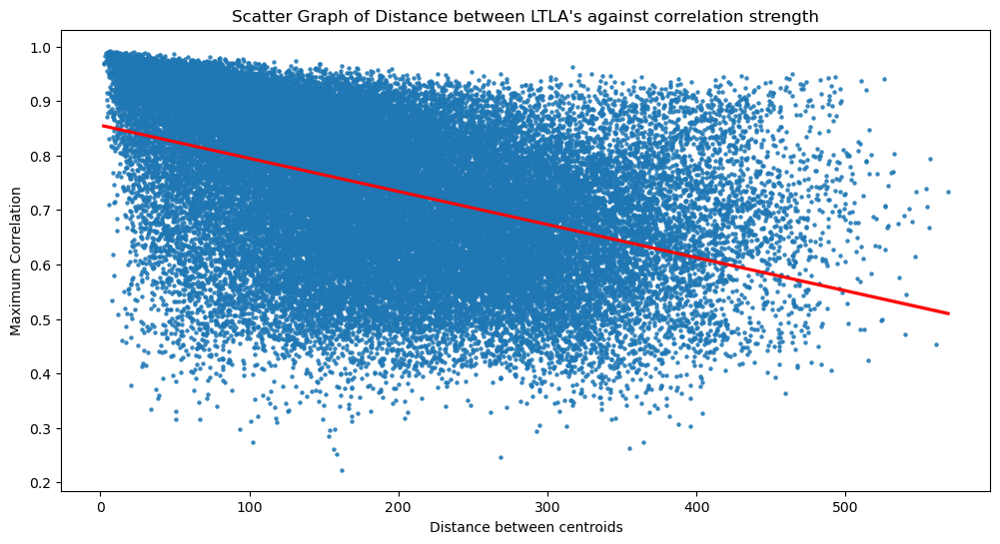

In [349]:
plt.figure(figsize=(12,6))

sns.regplot(data = secondwp_cc, x = "Distance between centroids", y = "Maximum Correlation", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [350]:
from scipy.stats import pearsonr
data1 = secondwp_cc['Distance between centroids']
data2 = secondwp_cc['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.450


In [387]:
swp_abs_lag = secondwp_cc
swp_abs_lag['Lag in Days'] = abs(swp_abs_lag['Lag in Days'])

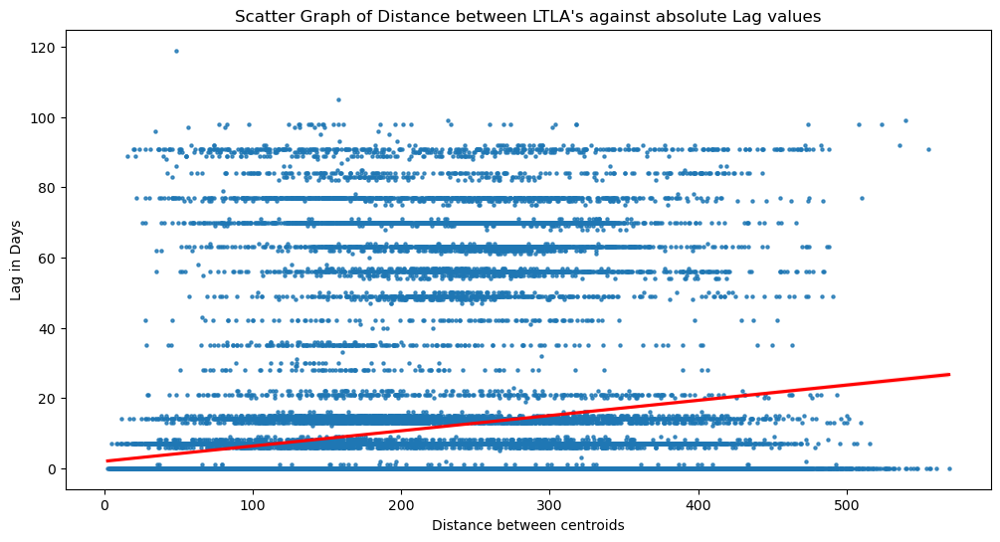

In [388]:
plt.figure(figsize=(12,6))

sns.regplot(data = swp_abs_lag, x = "Distance between centroids", y = "Lag in Days", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against absolute Lag values")

plt.show()

In [389]:
from scipy.stats import pearsonr
data1 = swp_abs_lag['Distance between centroids']
data2 = swp_abs_lag['Lag in Days']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.208


## Third Wave Positive Cases

In [334]:
thirdwp_cc = pd.read_csv('Third_Wave_Corrs.csv')

In [330]:
thirdwp_cc.describe()

,Maximum Correlation,Lag in Days
count,49455.000000,49455.000000
mean,0.849928,0.003175
std,0.083769,3.775306
min,0.457233,-77.000000
25%,0.806903,0.000000
50%,0.866982,0.000000
75%,0.912337,0.000000
max,0.992052,77.000000


In [335]:
thirdwp_cc = thirdwp_cc.set_index('LTLA 1')
thirdwp_cc = thirdwp_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [336]:
thirdwp_cc = thirdwp_cc.reset_index()

In [337]:
thirdwp_cc = thirdwp_cc.set_index('LTLA 2')
thirdwp_cc = thirdwp_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [338]:
thirdwp_cc = thirdwp_cc.reset_index()
thirdwp_cc

,LTLA 2,LTLA 1,Maximum Correlation,Lag in Days
0,East Devon,Redcar and Cleveland,0.534703,0.0
1,Havant,Redcar and Cleveland,0.718688,0.0
2,Surrey Heath,Redcar and Cleveland,0.709259,0.0
3,Worthing,Redcar and Cleveland,0.615529,0.0
4,Bolton,Redcar and Cleveland,0.907420,0.0
...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,0.917484,0.0
49451,Hillingdon,Basingstoke and Deane,0.906936,0.0
49452,Rushcliffe,Tunbridge Wells,0.903993,0.0
49453,Hillingdon,Tunbridge Wells,0.868682,0.0


In [339]:
thirdwp_cc = thirdwp_cc.loc[thirdwp_cc['LTLA 2'] != 'Hackney and City of London']
thirdwp_cc = thirdwp_cc.loc[thirdwp_cc['LTLA 1'] != 'Hackney and City of London']
thirdwp_cc['Distance between centroids'] = ltla_distances
thirdwp_cc['Distance between centroids'] = thirdwp_cc['Distance between centroids'] / 1000

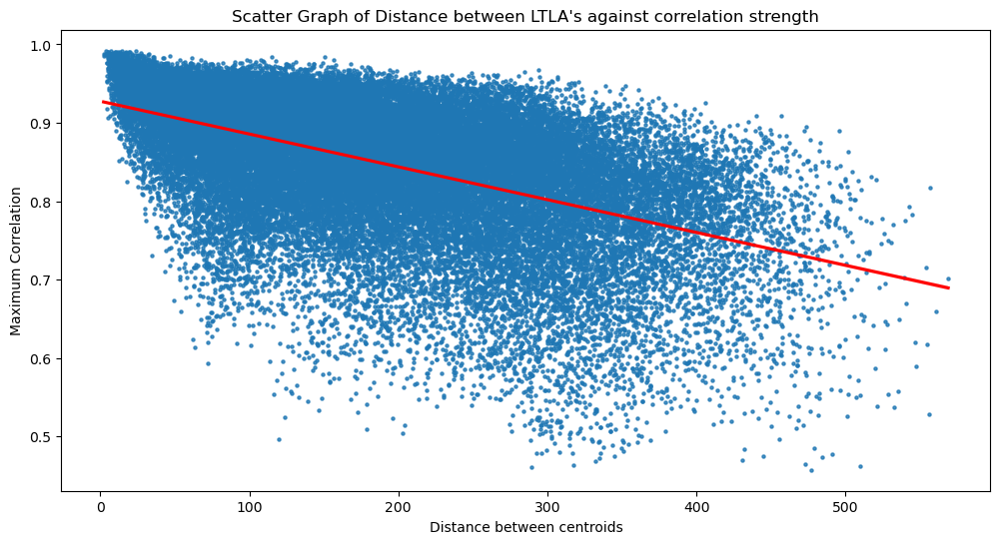

In [340]:
plt.figure(figsize=(12,6))

sns.regplot(data = thirdwp_cc, x = "Distance between centroids", y = "Maximum Correlation", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [341]:
from scipy.stats import pearsonr
data1 = thirdwp_cc['Distance between centroids']
data2 = thirdwp_cc['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.524


In [390]:
twp_abs_lag = thirdwp_cc
twp_abs_lag['Lag in Days'] = abs(twp_abs_lag['Lag in Days'])

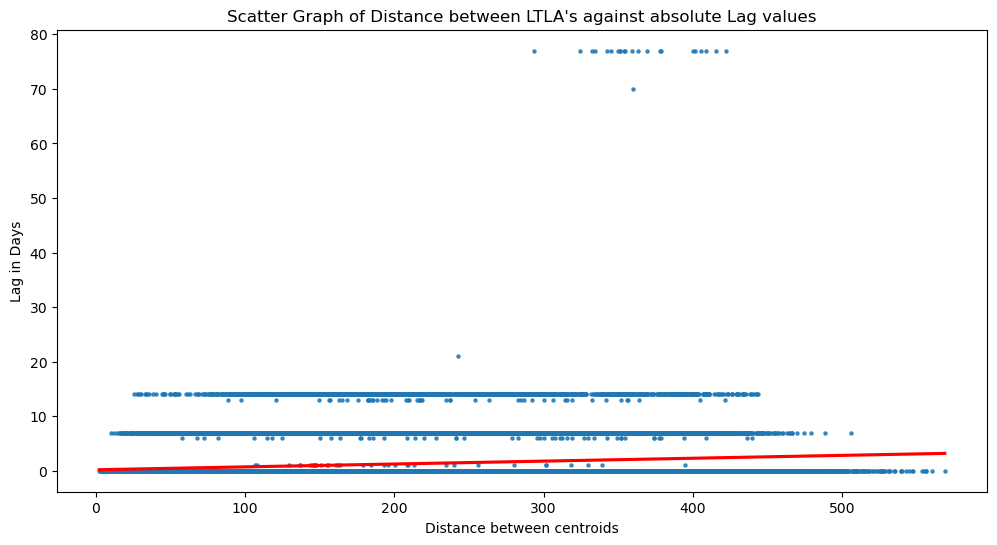

In [391]:
plt.figure(figsize=(12,6))

sns.regplot(data = twp_abs_lag, x = "Distance between centroids", y = "Lag in Days", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against absolute Lag values")

plt.show()

In [392]:
from scipy.stats import pearsonr
data1 = twp_abs_lag['Distance between centroids']
data2 = twp_abs_lag['Lag in Days']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.158


## Whole Dataset R Values

In [321]:
pandemicr_cc = pd.read_csv('Whole_Pandemic_R.csv')

In [313]:
pandemicr_cc.describe()

,Maximum Correlation,Lag in Days
count,49455.000000,49455.000000
mean,0.470491,3.510039
std,0.110451,63.093137
min,0.129034,-1060.000000
25%,0.401339,-5.000000
50%,0.480058,-1.000000
75%,0.548132,3.000000
max,0.858722,1163.000000


In [322]:
pandemicr_cc = pandemicr_cc.set_index('LTLA 1')
pandemicr_cc = pandemicr_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [323]:
pandemicr_cc = pandemicr_cc.reset_index()


,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.657899,9.0
1,Redcar and Cleveland,Havant,0.550277,0.0
2,Redcar and Cleveland,Surrey Heath,0.450203,0.0
3,Redcar and Cleveland,Worthing,0.474090,0.0
4,Redcar and Cleveland,Bolton,0.468786,-4.0
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.406654,0.0
49451,Basingstoke and Deane,Hillingdon,0.406430,-5.0
49452,Tunbridge Wells,Rushcliffe,0.604155,5.0
49453,Tunbridge Wells,Hillingdon,0.359444,-10.0


In [324]:
pandemicr_cc = pandemicr_cc.set_index('LTLA 2')
pandemicr_cc = pandemicr_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [325]:
pandemicr_cc = pandemicr_cc.reset_index()
pandemicr_cc

,LTLA 2,LTLA 1,Maximum Correlation,Lag in Days
0,East Devon,Redcar and Cleveland,0.657899,9.0
1,Havant,Redcar and Cleveland,0.550277,0.0
2,Surrey Heath,Redcar and Cleveland,0.450203,0.0
3,Worthing,Redcar and Cleveland,0.474090,0.0
4,Bolton,Redcar and Cleveland,0.468786,-4.0
...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,0.406654,0.0
49451,Hillingdon,Basingstoke and Deane,0.406430,-5.0
49452,Rushcliffe,Tunbridge Wells,0.604155,5.0
49453,Hillingdon,Tunbridge Wells,0.359444,-10.0


In [326]:
pandemicr_cc = pandemicr_cc.loc[pandemicr_cc['LTLA 2'] != 'Hackney and City of London']
pandemicr_cc = pandemicr_cc.loc[pandemicr_cc['LTLA 1'] != 'Hackney and City of London']
pandemicr_cc['Distance between centroids'] = ltla_distances
pandemicr_cc['Distance between centroids'] = pandemicr_cc['Distance between centroids'] / 1000

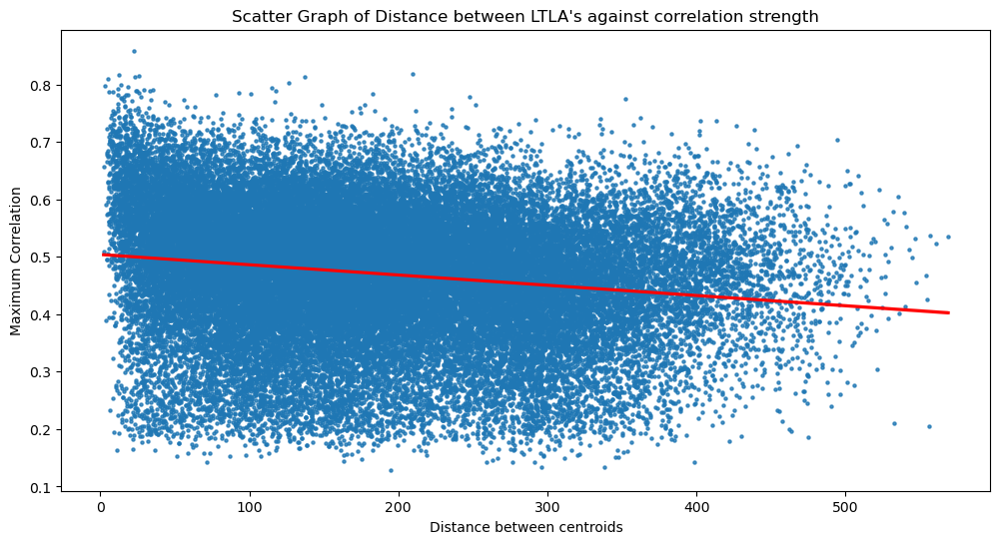

In [327]:
plt.figure(figsize=(12,6))

sns.regplot(data = pandemicr_cc, x = "Distance between centroids", y = "Maximum Correlation", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [328]:
from scipy.stats import pearsonr
data1 = pandemicr_cc['Distance between centroids']
data2 = pandemicr_cc['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.169


In [393]:
r_abs_lag = pandemicr_cc
r_abs_lag['Lag in Days'] = abs(r_abs_lag['Lag in Days'])

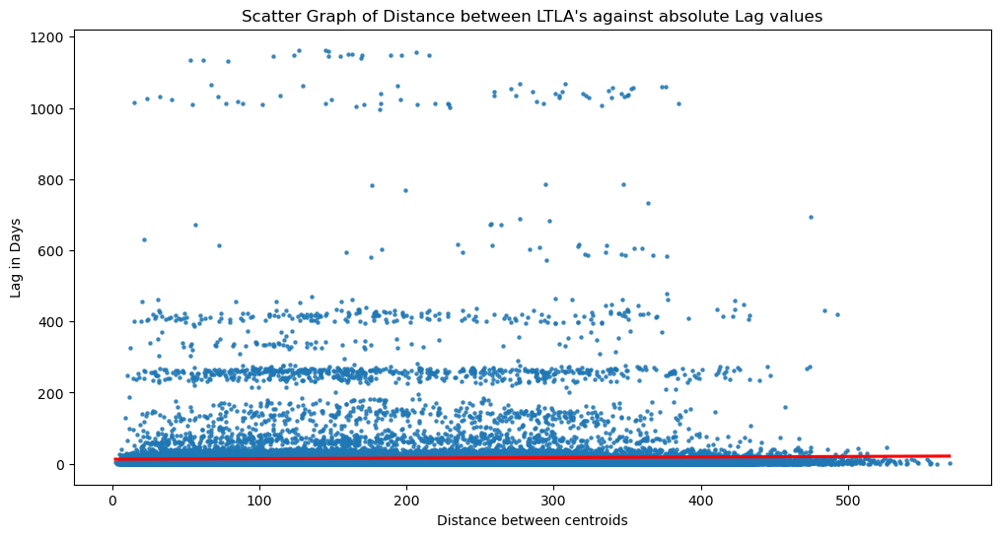

In [394]:
plt.figure(figsize=(12,6))

sns.regplot(data = r_abs_lag, x = "Distance between centroids", y = "Lag in Days", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against absolute Lag values")

plt.show()

In [395]:
from scipy.stats import pearsonr
data1 = r_abs_lag['Distance between centroids']
data2 = r_abs_lag['Lag in Days']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.026


## First Wave R Values

In [370]:
firstwr_cc = pd.read_csv('First_Wave_R.csv')

In [371]:
firstwr_cc.describe()

,Maximum Correlation,Lag in Days
count,49455.000000,49455.000000
mean,0.545916,-2.989971
std,0.140071,20.468326
min,0.002745,-130.000000
25%,0.457497,-12.000000
50%,0.551007,0.000000
75%,0.641654,7.000000
max,1.240669,118.000000


In [372]:
firstwr_cc = firstwr_cc.set_index('LTLA 1')
firstwr_cc = firstwr_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [373]:
firstwr_cc = firstwr_cc.reset_index()

In [374]:
firstwr_cc = firstwr_cc.set_index('LTLA 2')
firstwr_cc = firstwr_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [375]:
firstwr_cc = firstwr_cc.reset_index()
firstwr_cc

,LTLA 2,LTLA 1,Maximum Correlation,Lag in Days
0,East Devon,Redcar and Cleveland,0.720792,7.0
1,Havant,Redcar and Cleveland,0.684387,2.0
2,Surrey Heath,Redcar and Cleveland,0.750170,-3.0
3,Worthing,Redcar and Cleveland,0.701347,-5.0
4,Bolton,Redcar and Cleveland,0.675584,-17.0
...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,0.603410,-3.0
49451,Hillingdon,Basingstoke and Deane,0.526178,-46.0
49452,Rushcliffe,Tunbridge Wells,0.673384,1.0
49453,Hillingdon,Tunbridge Wells,0.427123,-31.0


In [376]:
firstwr_cc = firstwr_cc.loc[firstwr_cc['LTLA 2'] != 'Hackney and City of London']
firstwr_cc = firstwr_cc.loc[firstwr_cc['LTLA 1'] != 'Hackney and City of London']
firstwr_cc['Distance between centroids'] = ltla_distances
firstwr_cc['Distance between centroids'] = firstwr_cc['Distance between centroids'] / 1000

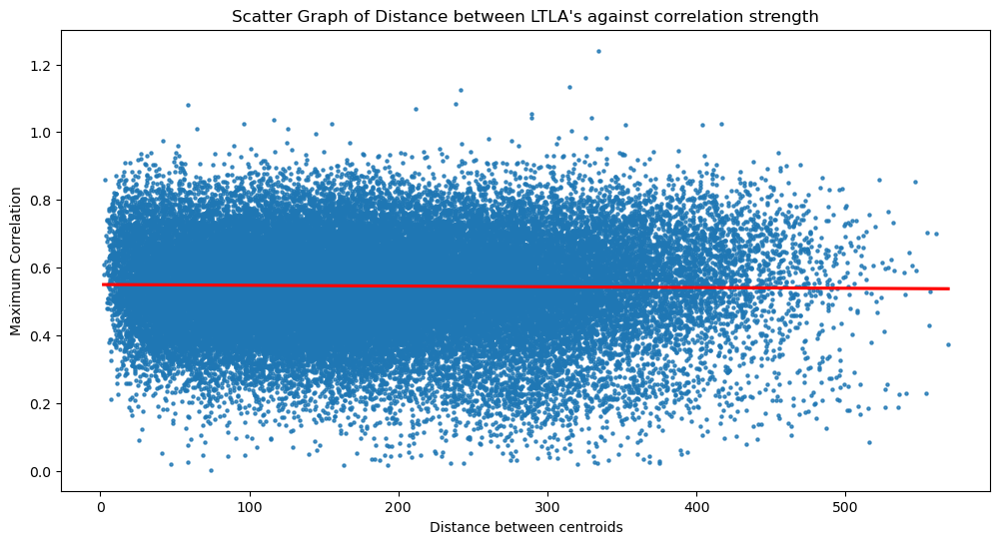

In [377]:
plt.figure(figsize=(12,6))

sns.regplot(data = firstwr_cc, x = "Distance between centroids", y = "Maximum Correlation", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [378]:
from scipy.stats import pearsonr
data1 = firstwr_cc['Distance between centroids']
data2 = firstwr_cc['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.016


In [396]:
fwr_abs_lag = firstwr_cc
fwr_abs_lag['Lag in Days'] = abs(fwr_abs_lag['Lag in Days'])

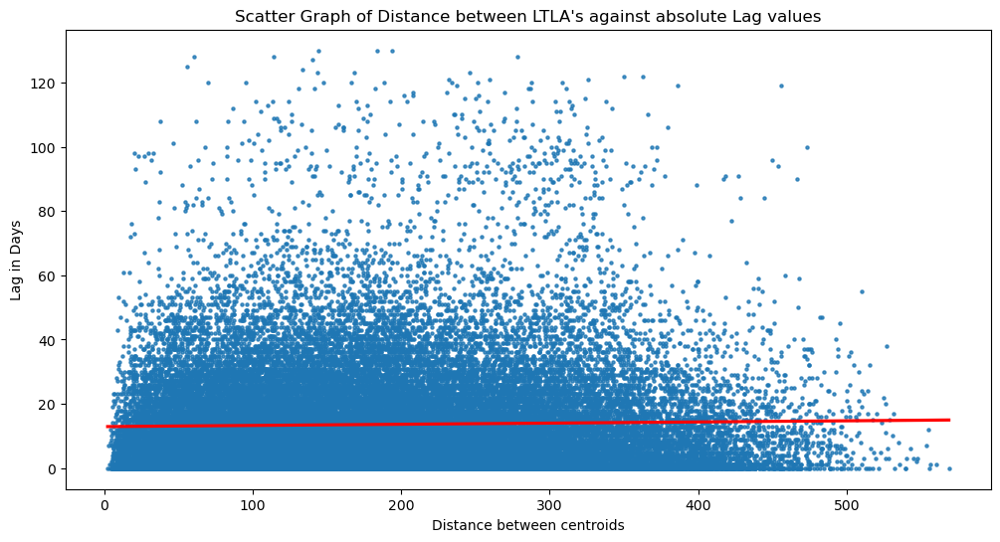

In [397]:
plt.figure(figsize=(12,6))

sns.regplot(data = fwr_abs_lag, x = "Distance between centroids", y = "Lag in Days", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against absolute Lag values")

plt.show()

In [398]:
from scipy.stats import pearsonr
data1 = fwr_abs_lag['Distance between centroids']
data2 = fwr_abs_lag['Lag in Days']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.024


## Second Wave R Values

In [302]:
secondwr_cc = pd.read_csv('Second_Wave_R.csv')

In [297]:
secondwr_cc.describe()

,Maximum Correlation,Lag in Days
count,49455.000000,49455.000000
mean,0.613736,-0.412719
std,0.128457,20.783010
min,0.182508,-186.000000
25%,0.523861,-2.000000
50%,0.620568,0.000000
75%,0.708934,2.000000
max,0.958269,187.000000


In [303]:
secodwr_cc = secondwr_cc.set_index('LTLA 1')
secondwr_cc = secondwr_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [304]:
secodwr_cc = secondwr_cc.set_index('LTLA 2')
secondwr_cc = secondwr_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [305]:
secondwr_cc = secondwr_cc.reset_index()
secondwr_cc

,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,0,Redcar and Cleveland,East Devon,0.510294,2.0
1,1,Redcar and Cleveland,Havant,0.513457,1.0
2,2,Redcar and Cleveland,Surrey Heath,0.556980,0.0
3,3,Redcar and Cleveland,Worthing,0.369575,0.0
4,4,Redcar and Cleveland,Bolton,0.681294,2.0
...,...,...,...,...,...
49450,49450,Basingstoke and Deane,Rushcliffe,0.586482,-3.0
49451,49451,Basingstoke and Deane,Hillingdon,0.785477,-9.0
49452,49452,Tunbridge Wells,Rushcliffe,0.376819,2.0
49453,49453,Tunbridge Wells,Hillingdon,0.583710,-2.0


In [306]:
secondwr_cc = secondwr_cc.loc[secondwr_cc['LTLA 2'] != 'Hackney and City of London']
secondwr_cc = secondwr_cc.loc[secondwr_cc['LTLA 1'] != 'Hackney and City of London']

In [308]:
secondwr_cc['Distance between centroids'] = ltla_distances

In [309]:
secondwr_cc['Distance between centroids'] = secondwr_cc['Distance between centroids'] / 1000

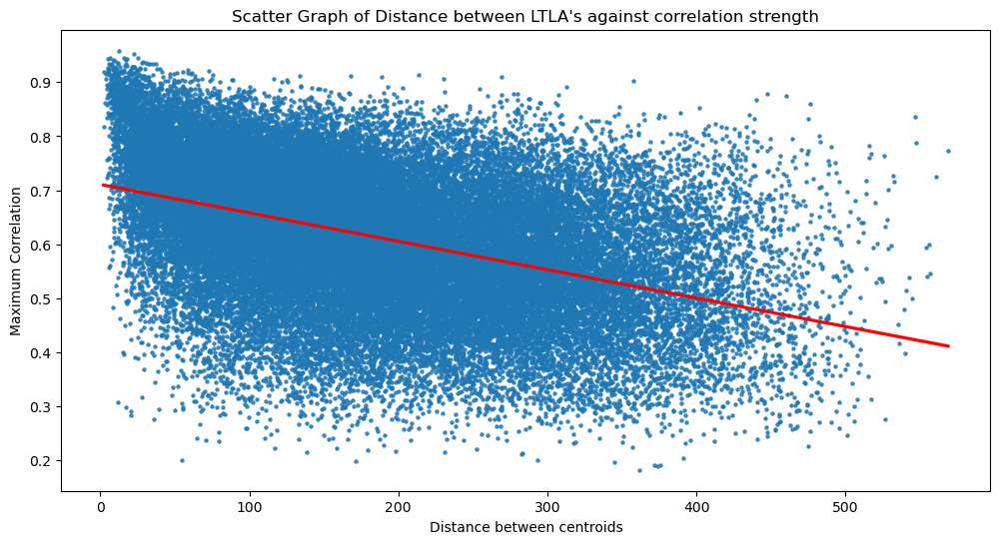

In [310]:
plt.figure(figsize=(12,6))

sns.regplot(data = secondwr_cc, x = "Distance between centroids", y = "Maximum Correlation", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [311]:
from scipy.stats import pearsonr
data1 = secondwr_cc['Distance between centroids']
data2 = secondwr_cc['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.428


In [399]:
swr_abs_lag = secondwr_cc
swr_abs_lag['Lag in Days'] = abs(swr_abs_lag['Lag in Days'])

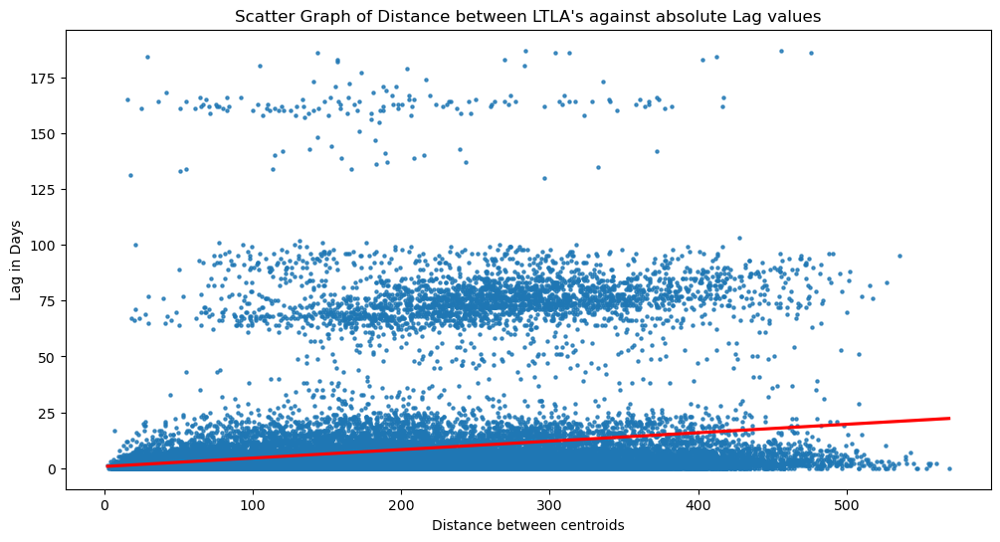

In [400]:
plt.figure(figsize=(12,6))

sns.regplot(data = swr_abs_lag, x = "Distance between centroids", y = "Lag in Days", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against absolute Lag values")

plt.show()

In [401]:
from scipy.stats import pearsonr
data1 = swr_abs_lag['Distance between centroids']
data2 = swr_abs_lag['Lag in Days']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.205


In [468]:
swr_top_cc = secondwr_cc.nlargest(5000,'Maximum Correlation')


In [469]:
swr_ltla1_top = swr_top_cc['LTLA 1'].value_counts()
swr_ltla2_top = swr_top_cc['LTLA 2'].value_counts()

In [470]:
swr_topcc = pd.DataFrame(swr_ltla1_top)
swr_topcc = swr_topcc.rename(columns = {'LTLA 1':'No. Correlations 1'})
swr_topcc = swr_topcc.reset_index()

In [471]:
swr_topcc2 = pd.DataFrame(swr_ltla2_top)
swr_topcc2 = swr_topcc2.rename(columns = {'LTLA 2':'No. Correlations 2'})
swr_topcc2 = swr_topcc2.reset_index()

In [472]:
swrmap_df_topcc = map_df.merge(swr_topcc,how='left', left_on = 'LAD19NM', right_on='index')
swrmap_df_topcc = swrmap_df_topcc.merge(swr_topcc2,how='left', left_on = 'LAD19NM', right_on='index')

In [473]:
swrmap_df_topcc["No. Correlations 1"] = swrmap_df_topcc["No. Correlations 1"].fillna(0)
swrmap_df_topcc["No. Correlations 2"] = swrmap_df_topcc["No. Correlations 2"].fillna(0)

In [474]:
swrmap_df_topcc['No. Correlations'] = swrmap_df_topcc["No. Correlations 1"] + swrmap_df_topcc["No. Correlations 2"]

In [475]:
swrmap_df_topcc.nlargest(5, 'No. Correlations')

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,index_x,No. Correlations 1,index_y,No. Correlations 2,No. Correlations
118,E07000092,Rushmoor,NaN,486022,153944,-0.76807,51.2781,174994fc-f16b-4dc0-a74b-51eada02eb61,"POLYGON ((483524.101 150221.899, 483275.900 15...",POINT (486065.481 153496.168),Rushmoor,17.0,Rushmoor,94.0,111.0
292,E09000009,Ealing,NaN,517057,181960,-0.31407,51.5244,622e3322-a56f-4b7d-9bf5-00b638413d8a,"POLYGON ((512561.797 185257.900, 515484.902 18...",POINT (515810.855 181660.178),Ealing,8.0,Ealing,93.0,101.0
301,E09000018,Hounslow,NaN,512744,174965,-0.37844,51.4624,ef34f201-81b6-4a03-88a4-9134f49e94ff,"POLYGON ((519424.202 179613.695, 520357.403 17...",POINT (513703.453 175657.461),Hounslow,97.0,Hounslow,2.0,99.0
196,E07000180,Vale of White Horse,NaN,435693,195197,-1.48543,51.6544,d4253d0c-46bb-4073-9ccf-10567620a52f,"POLYGON ((446837.801 210125.501, 448032.898 21...",POINT (438752.437 192963.747),Vale of White Horse,61.0,Vale of White Horse,34.0,95.0
45,E06000049,Cheshire East,NaN,380510,363462,-2.29299,53.1679,f36f7cf4-98e9-48a6-9be4-1628a52a1930,"POLYGON ((371724.899 387929.696, 375091.003 38...",POINT (376738.221 364926.648),Cheshire East,66.0,Cheshire East,26.0,92.0


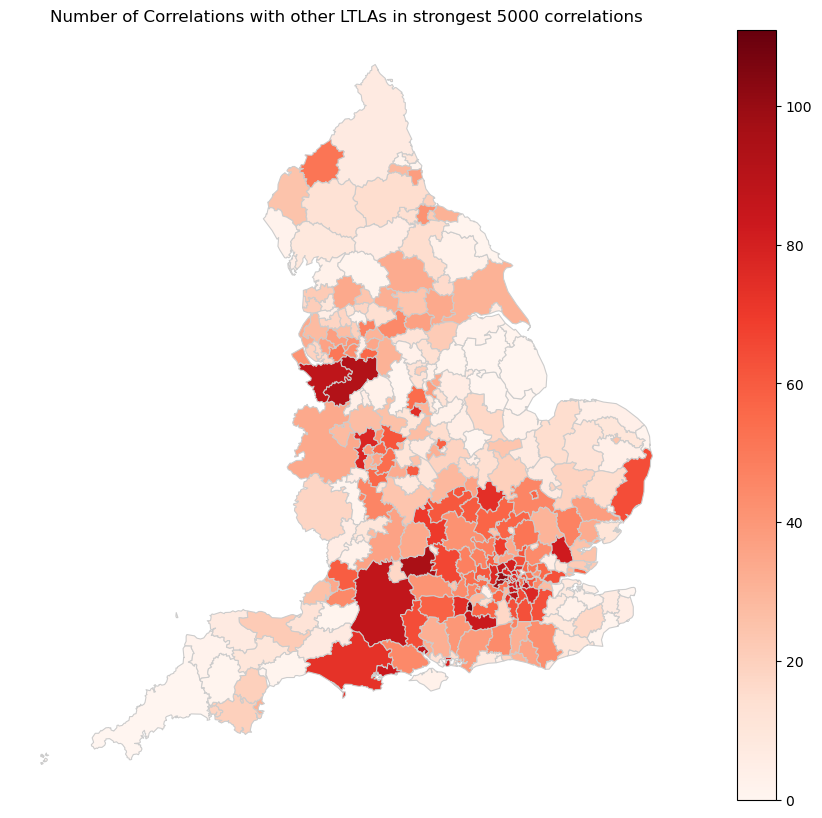

In [476]:
variable = 'No. Correlations'
vmin, vmax = 0.0, 111.0
fig, ax = plt.subplots(1, figsize =(14, 10))
ax.axis('off')
ax.set_title('Number of Correlations with other LTLAs in strongest 5000 correlations')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

swrmap_df_topcc.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

In [487]:
swr_abs_lag

,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids
0,0,Redcar and Cleveland,East Devon,0.510294,2.0,446.686187
1,1,Redcar and Cleveland,Havant,0.513457,1.0,411.943769
2,2,Redcar and Cleveland,Surrey Heath,0.556980,0.0,357.783404
3,3,Redcar and Cleveland,Worthing,0.369575,0.0,416.062959
4,4,Redcar and Cleveland,Bolton,0.681294,2.0,143.901356
...,...,...,...,...,...,...
49450,49450,Basingstoke and Deane,Rushcliffe,0.586482,3.0,181.384385
49451,49451,Basingstoke and Deane,Hillingdon,0.785477,9.0,60.445984
49452,49452,Tunbridge Wells,Rushcliffe,0.376819,2.0,222.863872
49453,49453,Tunbridge Wells,Hillingdon,0.583710,2.0,77.442951


In [479]:
swr_abs_lag2 = swr_abs_lag.nlargest(5000, 'Maximum Correlation')
swr_withlag = swr_abs_lag2.loc[swr_abs_lag2['Lag in Days']> 4.0]

In [480]:
swr_withlag.describe()

,index,Maximum Correlation,Lag in Days,Distance between centroids
count,157.000000,157.000000,157.000000,157.000000
mean,28527.433121,0.800796,6.388535,164.508349
std,13678.203975,0.022349,1.903605,126.656656
min,1135.000000,0.776106,5.000000,9.766921
25%,17504.000000,0.783053,5.000000,72.228676
50%,29944.000000,0.793598,6.000000,125.092510
75%,39399.000000,0.814592,7.000000,189.166156
max,49451.000000,0.861104,14.000000,476.122850


In [481]:
swr_withlag

,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids
7095,7095,Merton,Aylesbury Vale,0.861104,5.0,71.852070
39401,39401,Carlisle,Portsmouth,0.860582,5.0,476.122850
42548,42548,Haringey,Basingstoke and Deane,0.853595,8.0,83.770810
42073,42073,South Staffordshire,Hillingdon,0.852922,6.0,169.065825
35307,35307,Guildford,Wolverhampton,0.852460,10.0,183.882166
...,...,...,...,...,...,...
8201,8201,Cotswold,Eden,0.776416,5.0,314.885800
28395,28395,Barking and Dagenham,Watford,0.776334,7.0,39.646898
32332,32332,Bedford,"Bournemouth, Christchurch and Poole",0.776274,5.0,187.387156
17421,17421,Wiltshire,Newham,0.776263,6.0,140.058203


In [509]:
c_distances.loc[c_distances['index'] == 7095]

,LTLA 2,LTLA 1,index,Maximum Correlation,Lag in Days,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,line
7095,Aylesbury Vale,Merton,7095,0.82279,0.0,E09000024,Merton,NaN,526069.0,169507.0,-0.18867,51.4106,dffb6c08-ba9e-4da9-bccc-85d9a9ed3ff8,"POLYGON ((521672.103 171846.599, 525890.804 17...",POINT (525657.167 169405.838),"LINESTRING (525657.167 169405.838, 476817.439 ..."


In [510]:
network_swr = c_distances.merge(swr_withlag ,how='left', left_on = 'index', right_on='index')

In [512]:
network_swr = network_swr.dropna(subset=['LTLA 1_y'])

In [515]:
network_swr = gpd.GeoDataFrame(network_swr)

In [532]:
network_swr

,LTLA 2_x,LTLA 1_x,index,Maximum Correlation_x,Lag in Days_x,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,...,LAT,GlobalID,geometry,Centroid,line,LTLA 1_y,LTLA 2_y,Maximum Correlation_y,Lag in Days_y,Distance between centroids
1132,Gloucester,Surrey Heath,1135,0.606863,2.0,E07000214,Surrey Heath,NaN,491362.0,160483.0,...,51.3361,6a80d4cf-b3f8-4532-8dec-9648f52b217a,"POLYGON ((496215.798 166832.904, 499361.198 16...",POINT (492689.382 161238.561),"LINESTRING (492689.382 161238.561, 383492.770 ...",Surrey Heath,Gloucester,0.783425,11.0,122.470446
2007,Erewash,Trafford,2013,0.829231,1.0,E08000009,Trafford,NaN,375790.0,391162.0,...,53.4167,4974ca50-bd30-457c-894d-8e2ebe914615,"POLYGON ((370229.203 391101.898, 372218.300 39...",POINT (376505.623 391373.690),"LINESTRING (376505.623 391373.690, 444103.005 ...",Trafford,Erewash,0.779059,6.0,86.353569
2971,Gloucester,Barnet,2980,0.641163,0.0,E09000003,Barnet,NaN,523472.0,191753.0,...,51.6111,141fbdfb-533c-43e2-b6ca-183305d0e19e,"POLYGON ((517435.197 194421.097, 520681.797 19...",POINT (524111.504 192352.925),"LINESTRING (524111.504 192352.925, 383492.770 ...",Barnet,Gloucester,0.799088,5.0,142.709602
3317,Central Bedfordshire,Hounslow,3328,0.800133,0.0,E09000018,Hounslow,NaN,512744.0,174965.0,...,51.4624,ef34f201-81b6-4a03-88a4-9134f49e94ff,"POLYGON ((519424.202 179613.695, 520357.403 17...",POINT (513703.453 175657.461),"LINESTRING (513703.453 175657.461, 507448.573 ...",Hounslow,Central Bedfordshire,0.788362,5.0,60.128742
3384,Basingstoke and Deane,Hounslow,3395,0.844799,-1.0,E09000018,Hounslow,NaN,512744.0,174965.0,...,51.4624,ef34f201-81b6-4a03-88a4-9134f49e94ff,"POLYGON ((519424.202 179613.695, 520357.403 17...",POINT (513703.453 175657.461),"LINESTRING (513703.453 175657.461, 455884.552 ...",Hounslow,Basingstoke and Deane,0.790395,5.0,62.118299
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47961,Basingstoke and Deane,Rushmoor,48275,0.923131,0.0,E07000092,Rushmoor,NaN,486022.0,153944.0,...,51.2781,174994fc-f16b-4dc0-a74b-51eada02eb61,"POLYGON ((483524.101 150221.899, 483275.900 15...",POINT (486065.481 153496.168),"LINESTRING (486065.481 153496.168, 455884.552 ...",Rushmoor,Basingstoke and Deane,0.830855,5.0,30.185882
48147,Basingstoke and Deane,Bromley,48461,0.846002,0.0,E09000006,Bromley,NaN,542036.0,165708.0,...,51.3727,f47271d8-9029-4cde-afbb-8bed8aa8225c,"POLYGON ((541137.200 173365.504, 543441.497 17...",POINT (542850.728 165609.269),"LINESTRING (542850.728 165609.269, 455884.552 ...",Bromley,Basingstoke and Deane,0.778964,9.0,87.882814
48191,Basingstoke and Deane,Harrow,48505,0.820898,0.0,E09000015,Harrow,NaN,515356.0,189736.0,...,51.5947,459d2768-0025-4df1-a827-e8a71b2e6567,"POLYGON ((517435.197 194421.097, 520113.102 19...",POINT (515027.587 190113.869),"LINESTRING (515027.587 190113.869, 455884.552 ...",Harrow,Basingstoke and Deane,0.799451,10.0,69.850549
48609,Basingstoke and Deane,Lewisham,48923,0.786906,0.0,E09000023,Lewisham,NaN,537889.0,173344.0,...,51.4423,d1b83f92-9f8c-416e-b919-3fa2a70c8ac1,"POLYGON ((536691.001 178958.603, 537238.704 17...",POINT (537730.574 174010.156),"LINESTRING (537730.574 174010.156, 455884.552 ...",Lewisham,Basingstoke and Deane,0.823421,8.0,84.512297


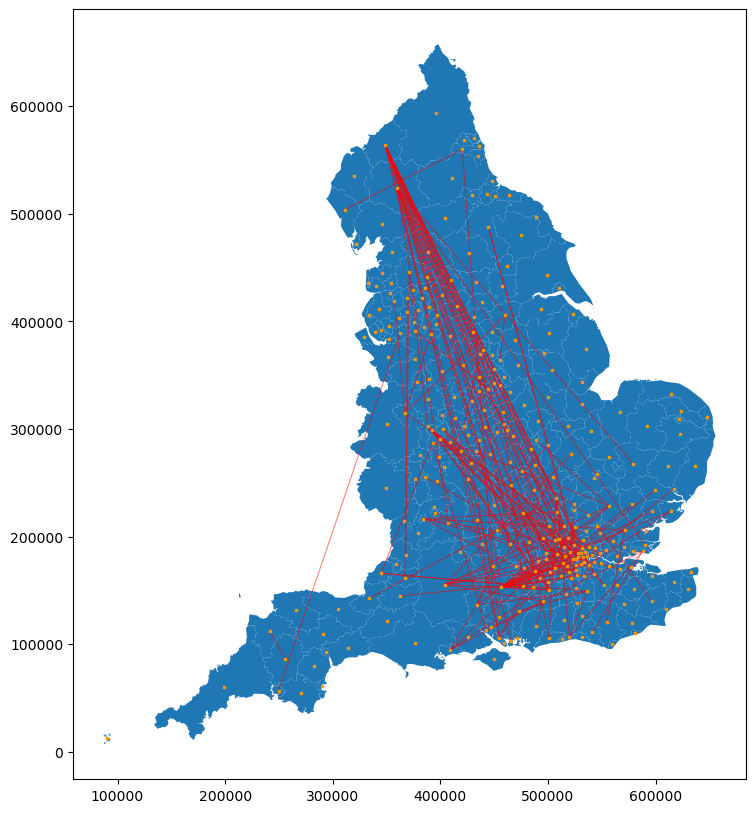

In [535]:
from matplotlib import pyplot as plt
fig, ax = plt.subplots(figsize=(14,10))
map_df['geometry'].plot(ax=ax)
map_df['Centroid'].plot(ax=ax, color='#FF9800', marker='s', zorder=2, alpha=0.9, markersize=4)
network_swr.set_geometry('line', inplace=True)
network_swr['line'].plot(ax=ax, color='red', zorder=1, alpha=0.5, linewidth = network_swr['Maximum Correlation_y'])
plt.show()

In [536]:
secondwr_cc

,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids
0,0,Redcar and Cleveland,East Devon,0.510294,2.0,446.686187
1,1,Redcar and Cleveland,Havant,0.513457,1.0,411.943769
2,2,Redcar and Cleveland,Surrey Heath,0.556980,0.0,357.783404
3,3,Redcar and Cleveland,Worthing,0.369575,0.0,416.062959
4,4,Redcar and Cleveland,Bolton,0.681294,2.0,143.901356
...,...,...,...,...,...,...
49450,49450,Basingstoke and Deane,Rushcliffe,0.586482,3.0,181.384385
49451,49451,Basingstoke and Deane,Hillingdon,0.785477,9.0,60.445984
49452,49452,Tunbridge Wells,Rushcliffe,0.376819,2.0,222.863872
49453,49453,Tunbridge Wells,Hillingdon,0.583710,2.0,77.442951


In [539]:
(secondwr_cc.loc[secondwr_cc['LTLA 1'] == 'Redcar and Cleveland']).nlargest(1, 'Maximum Correlation')

,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids
147,147,Redcar and Cleveland,Middlesbrough,0.896964,0.0,13.113734


In [540]:
max_ltla1_corr = [(secondwr_cc.loc[secondwr_cc['LTLA 1'] == ltlas[i]]).nlargest(1, 'Maximum Correlation') for i in range(len(ltlas))]

In [542]:
max_ltla2_corr = [(secondwr_cc.loc[secondwr_cc['LTLA 2'] == ltlas[i]]).nlargest(1, 'Maximum Correlation') for i in range(len(ltlas))]

In [551]:
frames = [max_ltla1_corr[i] for i in range(len(max_ltla1_corr))]

result = pd.concat(frames)

In [553]:
frames2 = [max_ltla2_corr[i] for i in range(len(max_ltla2_corr))]

result2 = pd.concat(frames2)

In [560]:
max(int((result.loc[result['LTLA 1'] == 'Redcar and Cleveland'])['Maximum Correlation']), int((result2.loc[result['LTLA 2'] == 'Redcar and Cleveland'])['Maximum Correlation']))

IndexingError: Unalignable boolean Series provided as indexer (index of the boolean Series and of the indexed object do not match).

In [558]:
max_corrs = [max((result.loc[result['LTLA 1'] == ltlas[i]])['Maximum Correlation'], (result2.loc[result['LTLA 2'] == ltlas[i]])['Maximum Correlation']) for i in range(len(max_ltla1_corr))]

IndexingError: Unalignable boolean Series provided as indexer (index of the boolean Series and of the indexed object do not match).

In [554]:
frames_join = [result, result2]

ltla_maxcorr = pd.concat(frames_join)

In [555]:
ltla_maxcorr

,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids
147,147,Redcar and Cleveland,Middlesbrough,0.896964,0.0,13.113734
382,382,East Devon,Staffordshire Moorlands,0.811118,1.0,271.127694
868,868,Havant,Central Bedfordshire,0.892135,4.0,134.499109
1026,1026,Surrey Heath,Three Rivers,0.868553,1.0,38.328563
1415,1415,Worthing,Adur,0.841924,1.0,7.040460
...,...,...,...,...,...,...
47559,47559,Cherwell,Colchester,0.888262,1.0,147.122134
42548,42548,Haringey,Basingstoke and Deane,0.853595,8.0,83.770810
49046,49046,Tonbridge and Malling,Tunbridge Wells,0.861480,1.0,18.477668
48673,48673,Gedling,Rushcliffe,0.833147,1.0,15.270758


In [561]:
network_maxcorr = c_distances.merge(result ,how='left', left_on = 'index', right_on='index')

In [562]:
network_maxcorr

,LTLA 2_x,LTLA 1_x,index,Maximum Correlation_x,Lag in Days_x,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,...,LAT,GlobalID,geometry,Centroid,line,LTLA 1_y,LTLA 2_y,Maximum Correlation_y,Lag in Days_y,Distance between centroids
0,East Devon,Redcar and Cleveland,0,0.729717,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),"LINESTRING (463481.094 517827.737, 313900.406 ...",NaN,NaN,NaN,NaN,NaN
1,Havant,Redcar and Cleveland,1,0.792831,-2.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),"LINESTRING (463481.094 517827.737, 471137.407 ...",NaN,NaN,NaN,NaN,NaN
2,Surrey Heath,Redcar and Cleveland,2,0.567554,-2.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),"LINESTRING (463481.094 517827.737, 492689.382 ...",NaN,NaN,NaN,NaN,NaN
3,Worthing,Redcar and Cleveland,3,0.642351,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),"LINESTRING (463481.094 517827.737, 513021.067 ...",NaN,NaN,NaN,NaN,NaN
4,Bolton,Redcar and Cleveland,4,0.702724,-1.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),"LINESTRING (463481.094 517827.737, 369139.334 ...",NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49136,Rushcliffe,Basingstoke and Deane,49450,0.817918,-1.0,E07000084,Basingstoke and Deane,NaN,454508.0,151423.0,...,51.2594,e22fc013-2390-4ae8-9098-80b82298382b,"POLYGON ((439824.503 159869.997, 438804.704 16...",POINT (455884.552 152949.361),"LINESTRING (455884.552 152949.361, 464817.056 ...",NaN,NaN,NaN,NaN,NaN
49137,Hillingdon,Basingstoke and Deane,49451,0.862722,0.0,E07000084,Basingstoke and Deane,NaN,454508.0,151423.0,...,51.2594,e22fc013-2390-4ae8-9098-80b82298382b,"POLYGON ((439824.503 159869.997, 438804.704 16...",POINT (455884.552 152949.361),"LINESTRING (455884.552 152949.361, 507929.434 ...",Basingstoke and Deane,Hillingdon,0.785477,9.0,60.445984
49138,Rushcliffe,Tunbridge Wells,49452,0.859649,0.0,E07000116,Tunbridge Wells,NaN,573139.0,136599.0,...,51.1025,c0d2129e-50a6-4d0d-ab7f-cc7cbed4d880,"POLYGON ((555736.400 145126.397, 559287.102 14...",POINT (570309.724 137798.607),"LINESTRING (570309.724 137798.607, 464817.056 ...",NaN,NaN,NaN,NaN,NaN
49139,Hillingdon,Tunbridge Wells,49453,0.837198,1.0,E07000116,Tunbridge Wells,NaN,573139.0,136599.0,...,51.1025,c0d2129e-50a6-4d0d-ab7f-cc7cbed4d880,"POLYGON ((555736.400 145126.397, 559287.102 14...",POINT (570309.724 137798.607),"LINESTRING (570309.724 137798.607, 507929.434 ...",Tunbridge Wells,Hillingdon,0.583710,2.0,77.442951


In [563]:
network_maxcorr = network_maxcorr.dropna(subset=['LTLA 1_y'])

In [566]:
network_maxcorr2 = c_distances.merge(result2 ,how='left', left_on = 'index', right_on='index')

In [567]:
network_maxcorr2 = network_maxcorr2.dropna(subset=['LTLA 1_y'])

In [564]:
network_maxcorr = gpd.GeoDataFrame(network_maxcorr)

In [568]:
network_maxcorr2 = gpd.GeoDataFrame(network_maxcorr2)

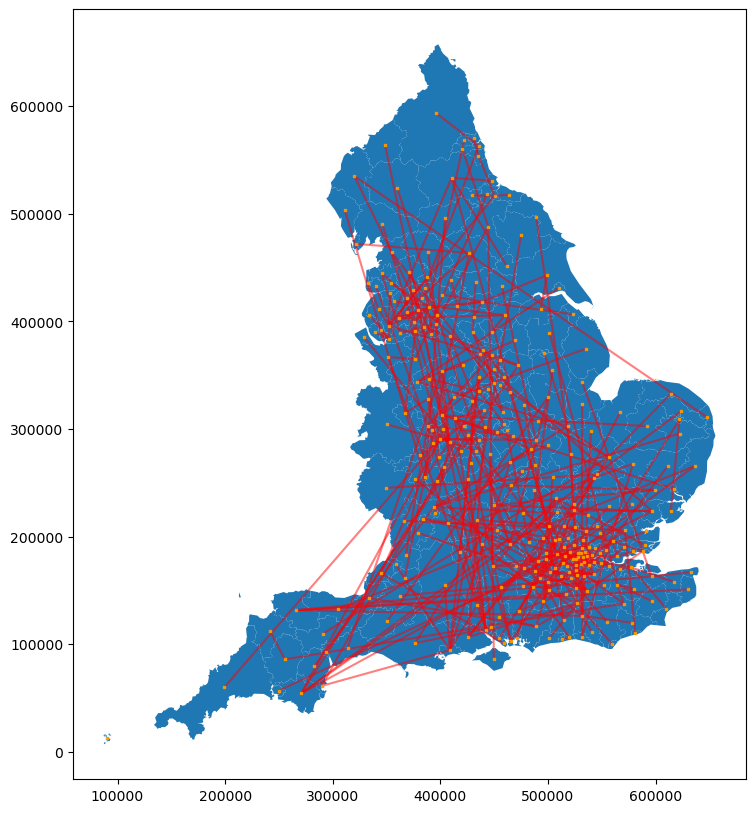

In [565]:
from matplotlib import pyplot as plt
fig, ax = plt.subplots(figsize=(14,10))
map_df['geometry'].plot(ax=ax)
map_df['Centroid'].plot(ax=ax, color='#FF9800', marker='s', zorder=2, alpha=0.9, markersize=4)
network_maxcorr.set_geometry('line', inplace=True)
network_maxcorr['line'].plot(ax=ax, color='red', zorder=1, alpha=0.5)
plt.show()

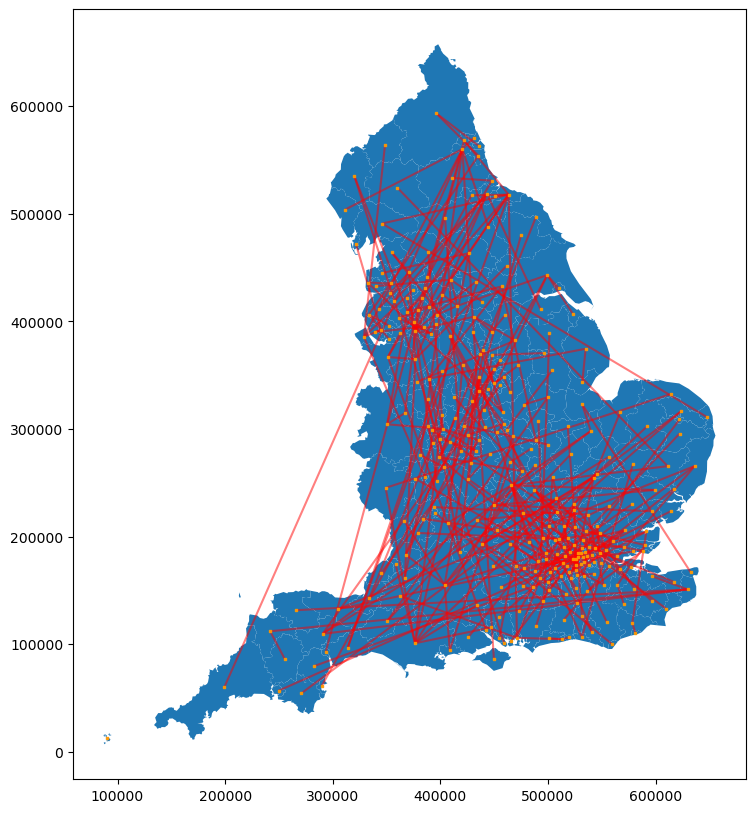

In [569]:
from matplotlib import pyplot as plt
fig, ax = plt.subplots(figsize=(14,10))
map_df['geometry'].plot(ax=ax)
map_df['Centroid'].plot(ax=ax, color='#FF9800', marker='s', zorder=2, alpha=0.9, markersize=4)
network_maxcorr2.set_geometry('line', inplace=True)
network_maxcorr2['line'].plot(ax=ax, color='red', zorder=1, alpha=0.5)
plt.show()

In [570]:
result

,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids
147,147,Redcar and Cleveland,Middlesbrough,0.896964,0.0,13.113734
382,382,East Devon,Staffordshire Moorlands,0.811118,1.0,271.127694
868,868,Havant,Central Bedfordshire,0.892135,4.0,134.499109
1026,1026,Surrey Heath,Three Rivers,0.868553,1.0,38.328563
1415,1415,Worthing,Adur,0.841924,1.0,7.040460
...,...,...,...,...,...,...
49444,49444,South Hams,Hillingdon,0.759688,2.0,270.321106
49445,49445,Colchester,Basingstoke and Deane,0.802985,2.0,157.684476
49451,49451,Basingstoke and Deane,Hillingdon,0.785477,9.0,60.445984
49453,49453,Tunbridge Wells,Hillingdon,0.583710,2.0,77.442951


In [573]:
result3 = result.merge(result2 ,how='left', left_on = 'LTLA 1', right_on='LTLA 2')

In [579]:
max(result3['Maximum Correlation_x'].iloc[10], result3['Maximum Correlation_y'].iloc[10])

0.9443045428049954

In [581]:
max_vals = [max(result3['Maximum Correlation_x'].iloc[i], result3['Maximum Correlation_y'].iloc[i]) for i in range(len(result3))]

In [583]:
result3['Max Correlation'] = max_vals

In [584]:
result3

,index_x,LTLA 1_x,LTLA 2_x,Maximum Correlation_x,Lag in Days_x,Distance between centroids_x,index_y,LTLA 1_y,LTLA 2_y,Maximum Correlation_y,Lag in Days_y,Distance between centroids_y,Max Correlation
0,147,Redcar and Cleveland,Middlesbrough,0.896964,0.0,13.113734,NaN,NaN,NaN,NaN,NaN,NaN,0.896964
1,382,East Devon,Staffordshire Moorlands,0.811118,1.0,271.127694,0.0,Redcar and Cleveland,East Devon,0.510294,2.0,446.686187,0.811118
2,868,Havant,Central Bedfordshire,0.892135,4.0,134.499109,1.0,Redcar and Cleveland,Havant,0.513457,1.0,411.943769,0.892135
3,1026,Surrey Heath,Three Rivers,0.868553,1.0,38.328563,627.0,Havant,Surrey Heath,0.653574,3.0,59.335875,0.868553
4,1415,Worthing,Adur,0.841924,1.0,7.040460,628.0,Havant,Worthing,0.720307,0.0,41.901732,0.841924
...,...,...,...,...,...,...,...,...,...,...,...,...,...
308,49444,South Hams,Hillingdon,0.759688,2.0,270.321106,43344.0,Broadland,South Hams,0.867671,3.0,440.006610,0.867671
309,49445,Colchester,Basingstoke and Deane,0.802985,2.0,157.684476,47559.0,Cherwell,Colchester,0.888262,1.0,147.122134,0.888262
310,49451,Basingstoke and Deane,Hillingdon,0.785477,9.0,60.445984,42548.0,Haringey,Basingstoke and Deane,0.853595,8.0,83.770810,0.853595
311,49453,Tunbridge Wells,Hillingdon,0.583710,2.0,77.442951,49046.0,Tonbridge and Malling,Tunbridge Wells,0.861480,1.0,18.477668,0.861480


In [585]:
result3.to_csv('Second_Wave_Max_Corrs.csv', index=None)

In [586]:
swr_max_corrs = pd.read_csv('2ndwave_R_Max_Corrs.csv')

In [628]:
swr_max_corrs

,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids
0,147,Redcar and Cleveland,Middlesbrough,0.896964,0,13.113734
1,382,East Devon,Staffordshire Moorlands,0.811118,1,271.127694
2,868,Havant,Central Bedfordshire,0.892135,4,134.499109
3,1026,Surrey Heath,Three Rivers,0.868553,1,38.328563
4,1415,Worthing,Adur,0.841924,1,7.040460
...,...,...,...,...,...,...
308,43344,Broadland,South Hams,0.867671,3,440.006610
309,47559,Cherwell,Colchester,0.888262,1,147.122134
310,42548,Haringey,Basingstoke and Deane,0.853595,8,83.770810
311,49046,Tonbridge and Malling,Tunbridge Wells,0.861480,1,18.477668


In [631]:
c_distances.loc[c_distances['index'] == 43344]

,LTLA 2,LTLA 1,index,Maximum Correlation,Lag in Days,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,line
43344,South Hams,Broadland,43344,0.663778,0.0,E07000144,Broadland,NaN,619865.0,315909.0,1.25233,52.6962,9321a99f-4509-4ae7-86c7-587f7f58dee6,"POLYGON ((619155.802 329726.496, 619427.600 32...",POINT (623820.764 316653.708),"LINESTRING (623820.764 316653.708, 270595.476 ..."


In [632]:
network_swr_maxcorr = c_distances.merge(swr_max_corrs ,how='left', left_on = 'index', right_on='index')

In [634]:
network_swr_maxcorr = network_swr_maxcorr.dropna(subset=['LTLA 1_y'])

In [635]:
network_swr_maxcorr

,LTLA 2_x,LTLA 1_x,index,Maximum Correlation_x,Lag in Days_x,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,...,LAT,GlobalID,geometry,Centroid,line,LTLA 1_y,LTLA 2_y,Maximum Correlation_y,Lag in Days_y,Distance between centroids
147,Middlesbrough,Redcar and Cleveland,147,0.911568,1.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),"LINESTRING (463481.094 517827.737, 450414.504 ...",Redcar and Cleveland,Middlesbrough,0.896964,0.0,13.113734
148,Middlesbrough,Redcar and Cleveland,147,0.911568,1.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),"LINESTRING (463481.094 517827.737, 450414.504 ...",Redcar and Cleveland,Middlesbrough,0.896964,0.0,13.113734
382,Staffordshire Moorlands,East Devon,382,0.737266,1.0,E07000040,East Devon,NaN,313775.0,96055.0,...,50.7576,34756475-7088-465e-99fd-07fa0f383c56,"POLYGON ((326101.999 112616.903, 325882.400 10...",POINT (313900.406 96930.876),"LINESTRING (313900.406 96930.876, 401347.870 3...",East Devon,Staffordshire Moorlands,0.811118,1.0,271.127694
383,Staffordshire Moorlands,East Devon,382,0.737266,1.0,E07000040,East Devon,NaN,313775.0,96055.0,...,50.7576,34756475-7088-465e-99fd-07fa0f383c56,"POLYGON ((326101.999 112616.903, 325882.400 10...",POINT (313900.406 96930.876),"LINESTRING (313900.406 96930.876, 401347.870 3...",East Devon,Staffordshire Moorlands,0.811118,1.0,271.127694
867,Central Bedfordshire,Havant,868,0.831024,1.0,E07000090,Havant,NaN,470177.0,108563.0,...,50.8723,f3ef4f4e-6d3b-4a84-a100-0b3fcaa8bd04,"MULTIPOLYGON (((468828.400 103430.701, 468895....",POINT (471137.407 105955.124),"LINESTRING (471137.407 105955.124, 507448.573 ...",Havant,Central Bedfordshire,0.892135,4.0,134.499109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48576,Tewkesbury,East Hertfordshire,48846,0.555814,1.0,E07000242,East Hertfordshire,NaN,537995.0,220370.0,...,51.8648,797e0b74-9eb7-494c-9c25-f7e3c7566fbf,"POLYGON ((526484.803 226240.799, 527584.496 22...",POINT (537254.778 220496.117),"LINESTRING (537254.778 220496.117, 393965.039 ...",East Hertfordshire,Tewkesbury,0.847692,1.0,143.457843
48776,Tunbridge Wells,Tonbridge and Malling,49046,0.896760,0.0,E07000115,Tonbridge and Malling,NaN,564014.0,153898.0,...,51.2606,da1c56d9-1a6f-44e5-b266-256fb734d223,"POLYGON ((574622.302 163408.524, 576032.302 16...",POINT (564576.282 155364.251),"LINESTRING (564576.282 155364.251, 570309.724 ...",Tonbridge and Malling,Tunbridge Wells,0.861480,1.0,18.477668
48777,Tunbridge Wells,Tonbridge and Malling,49046,0.896760,0.0,E07000115,Tonbridge and Malling,NaN,564014.0,153898.0,...,51.2606,da1c56d9-1a6f-44e5-b266-256fb734d223,"POLYGON ((574622.302 163408.524, 576032.302 16...",POINT (564576.282 155364.251),"LINESTRING (564576.282 155364.251, 570309.724 ...",Tonbridge and Malling,Tunbridge Wells,0.861480,1.0,18.477668
48845,East Cambridgeshire,North Norfolk,49114,0.703764,-2.0,E07000147,North Norfolk,NaN,611083.0,330845.0,...,52.8338,43bfd726-f205-4685-8d26-a280933a5b42,"MULTIPOLYGON (((591691.396 343888.002, 592608....",POINT (613966.355 332476.448),"LINESTRING (613966.355 332476.448, 556428.352 ...",North Norfolk,East Cambridgeshire,0.836653,0.0,81.961173


In [636]:
network_swr_maxcorr = gpd.GeoDataFrame(network_swr_maxcorr)

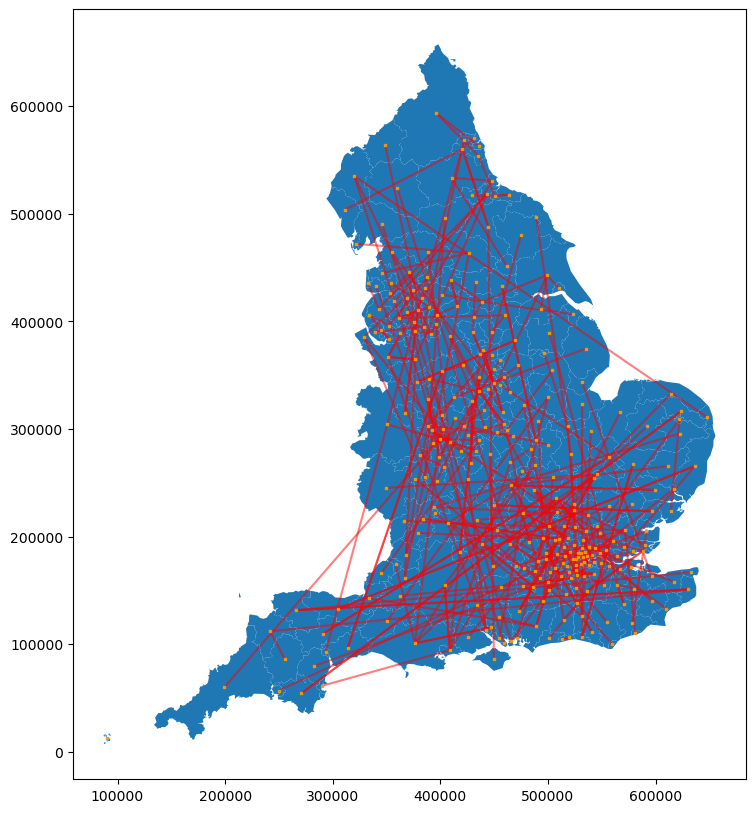

In [637]:
from matplotlib import pyplot as plt
fig, ax = plt.subplots(figsize=(14,10))
map_df['geometry'].plot(ax=ax)
map_df['Centroid'].plot(ax=ax, color='#FF9800', marker='s', zorder=2, alpha=0.9, markersize=4)
network_swr_maxcorr.set_geometry('line', inplace=True)
network_swr_maxcorr['line'].plot(ax=ax, color='red', zorder=1, alpha=0.5)
plt.show()

In [638]:
swr_max_counts1 = swr_max_corrs['LTLA 1'].value_counts()

In [641]:
swr_max_counts2 = swr_max_corrs['LTLA 2'].value_counts()

In [639]:
swr_max_counts1

South Northamptonshire    6
Dorset                    5
Barking and Dagenham      5
Knowsley                  4
Derby                     4
                         ..
Pendle                    1
Barrow-in-Furness         1
Plymouth                  1
North Lincolnshire        1
Gedling                   1
Name: LTLA 1, Length: 197, dtype: int64

In [642]:
swr_max_counts2

Sandwell                               7
South Staffordshire                    6
Birmingham                             5
Central Bedfordshire                   5
Bournemouth, Christchurch and Poole    5
                                      ..
Northumberland                         1
South Kesteven                         1
Newham                                 1
Liverpool                              1
Rushcliffe                             1
Name: LTLA 2, Length: 180, dtype: int64

In [647]:
swr_topcc_new1 = pd.DataFrame(swr_max_counts1)
swr_topcc_new1 = swr_topcc_new1.rename(columns = {'LTLA 1':'No. Correlations 1'})
swr_topcc_new1 = swr_topcc_new1.reset_index()

In [648]:
swr_topcc_new2 = pd.DataFrame(swr_max_counts2)
swr_topcc_new2 = swr_topcc_new2.rename(columns = {'LTLA 2':'No. Correlations 2'})
swr_topcc_new2 = swr_topcc_new2.reset_index()

In [649]:
swr_topcc_new2

,index,No. Correlations 2
0,Sandwell,7
1,South Staffordshire,6
2,Birmingham,5
3,Central Bedfordshire,5
4,"Bournemouth, Christchurch and Poole",5
...,...,...
175,Northumberland,1
176,South Kesteven,1
177,Newham,1
178,Liverpool,1


In [650]:
swr_topcc_new3 = map_df.merge(swr_topcc_new1,how='left', left_on = 'LAD19NM', right_on='index')

In [651]:
swr_topcc_new3 = swr_topcc_new3.merge(swr_topcc_new2,how='left', left_on = 'LAD19NM', right_on='index')

In [654]:
swr_topcc_new3

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,index_x,No. Correlations 1,index_y,No. Correlations 2,No. Correlations
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756),Hartlepool,1.0,Hartlepool,1.0,2.0
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770),NaN,0.0,Middlesbrough,4.0,4.0
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),Redcar and Cleveland,2.0,NaN,0.0,2.0
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696),Stockton-on-Tees,3.0,NaN,0.0,3.0
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470),Darlington,1.0,NaN,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121),Sutton,3.0,Sutton,2.0,5.0
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072),Tower Hamlets,1.0,Tower Hamlets,1.0,2.0
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653),Waltham Forest,3.0,NaN,0.0,3.0
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545),Wandsworth,3.0,NaN,0.0,3.0


In [653]:
swr_topcc_new3["No. Correlations 1"] = swr_topcc_new3["No. Correlations 1"].fillna(0)
swr_topcc_new3["No. Correlations 2"] = swr_topcc_new3["No. Correlations 2"].fillna(0)
swr_topcc_new3['No. Correlations'] = swr_topcc_new3["No. Correlations 1"] + swr_topcc_new3["No. Correlations 2"]

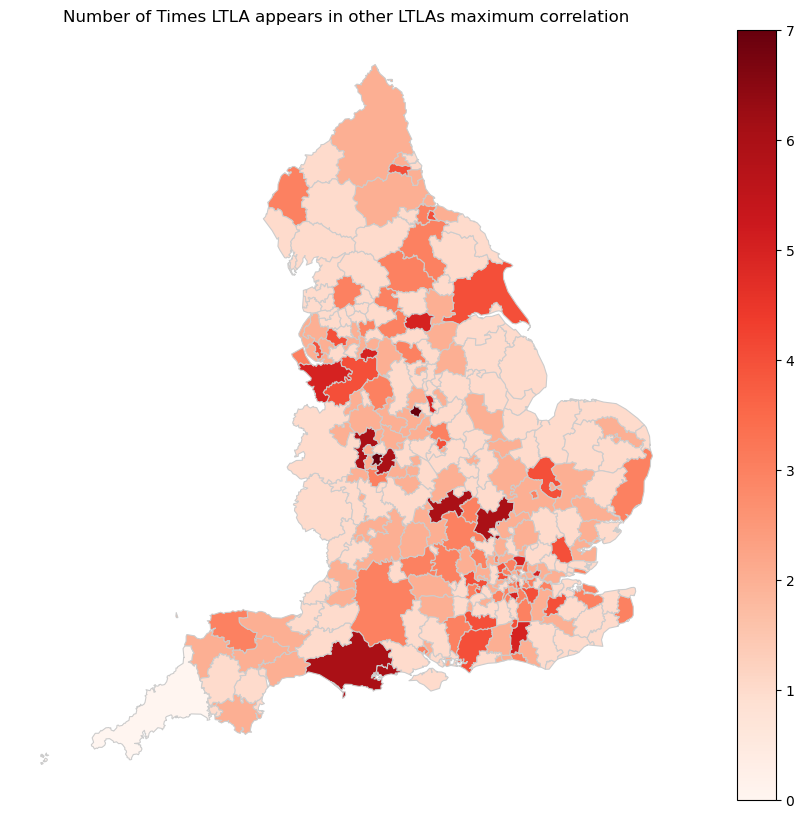

In [656]:
variable = 'No. Correlations'
vmin, vmax = 0.0, 7.0
fig, ax = plt.subplots(1, figsize =(14, 10))
ax.axis('off')
ax.set_title('Number of Times LTLA appears in other LTLAs maximum correlation')
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))

sm._A = []

cbar = fig.colorbar(sm)

swr_topcc_new3.plot(column=variable, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
plt.show()

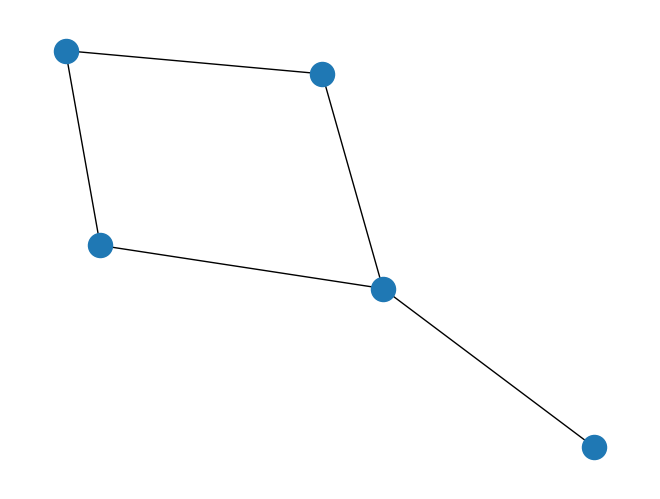

In [627]:
g = nx.Graph()

g.add_edge(1, 2)
g.add_edge(2, 3)
g.add_edge(3, 4)
g.add_edge(1, 4)
g.add_edge(1, 5)
 
nx.draw(g)

In [691]:
swr_max_corrs = swr_max_corrs.merge(ltla2region, how='left', left_on = 'LTLA 1', right_on='LAD19NM')


,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids,LAD19NM,RGN19NM
0,147,Redcar and Cleveland,Middlesbrough,0.896964,0,13.113734,Redcar and Cleveland,North East
1,382,East Devon,Staffordshire Moorlands,0.811118,1,271.127694,East Devon,South West
2,868,Havant,Central Bedfordshire,0.892135,4,134.499109,Havant,South East
3,1026,Surrey Heath,Three Rivers,0.868553,1,38.328563,Surrey Heath,South East
4,1415,Worthing,Adur,0.841924,1,7.040460,Worthing,South East
...,...,...,...,...,...,...,...,...
308,43344,Broadland,South Hams,0.867671,3,440.006610,Broadland,East of England
309,47559,Cherwell,Colchester,0.888262,1,147.122134,Cherwell,South East
310,42548,Haringey,Basingstoke and Deane,0.853595,8,83.770810,Haringey,London
311,49046,Tonbridge and Malling,Tunbridge Wells,0.861480,1,18.477668,Tonbridge and Malling,South East


In [692]:
swr_max_corrs = swr_max_corrs.merge(ltla2region, how='left', left_on = 'LTLA 2', right_on='LAD19NM')

In [694]:
swr_max_corrs = swr_max_corrs.rename(columns={'RGN19NM_x' : 'Region 1', 'RGN19NM_y' : 'Region 2'})

In [696]:
swr_max_corrs = swr_max_corrs.drop(columns={'LAD19NM_x', 'LAD19NM_y'})
swr_max_corrs

,index,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,Distance between centroids,Region 1,Region 2
0,147,Redcar and Cleveland,Middlesbrough,0.896964,0,13.113734,North East,North East
1,382,East Devon,Staffordshire Moorlands,0.811118,1,271.127694,South West,West Midlands
2,868,Havant,Central Bedfordshire,0.892135,4,134.499109,South East,East of England
3,1026,Surrey Heath,Three Rivers,0.868553,1,38.328563,South East,East of England
4,1415,Worthing,Adur,0.841924,1,7.040460,South East,South East
...,...,...,...,...,...,...,...,...
308,43344,Broadland,South Hams,0.867671,3,440.006610,East of England,South West
309,47559,Cherwell,Colchester,0.888262,1,147.122134,South East,East of England
310,42548,Haringey,Basingstoke and Deane,0.853595,8,83.770810,London,South East
311,49046,Tonbridge and Malling,Tunbridge Wells,0.861480,1,18.477668,South East,South East


In [704]:
ltla2region

,LAD19NM,RGN19NM
0,City of London,London
1,Wiltshire,South West
2,Barking and Dagenham,London
3,Barnet,London
4,Bexley,London
...,...,...
312,Bassetlaw,East Midlands
313,Broxtowe,East Midlands
314,Gedling,East Midlands
315,Mansfield,East Midlands


In [705]:
col         = 'RGN19NM'
conditions  = [ ltla2region[col] == 'London', (ltla2region[col] == 'South West') ,(ltla2region[col] == 'South East'), ltla2region[col] == 'East of England', ltla2region[col] == 'East Midlands', ltla2region[col] == 'West Midlands', ltla2region[col] == 'North West', ltla2region[col] == 'North East', ltla2region[col] == 'Yorkshire and the Humber' ]
choices     = [ "red", 'blue', 'green', 'orange', 'yellow', 'grey', 'black', 'cyan', 'purple']

In [706]:
ltla2region["Colour"] = np.select(conditions, choices, default=np.nan)

In [707]:
nodes = []
for idx, row in ltla2region.iterrows():
    nodes.append((row["LAD19NM"], {"colour": row.Colour, "region": row.RGN19NM}))
nodes[:1]

[('City of London', {'colour': 'red', 'region': 'London'})]

In [708]:
G = nx.Graph()
G.add_nodes_from(nodes)

In [709]:
edge_list = []
for idx, row in swr_max_corrs.iterrows():
    edge_list.append((row['LTLA 1'], row['LTLA 2']))
edge_list[:1]

[('Redcar and Cleveland', 'Middlesbrough')]

In [710]:
G.add_edges_from(edge_list)

In [714]:
pip install pyvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 4.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 1.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [715]:
from pyvis.network import Network
#from IPython.display import HTML

In [716]:
net = Network(notebook=True)
net.from_nx(G)

ValueError: 'c' argument has 313 elements, which is inconsistent with 'x' and 'y' with size 314.

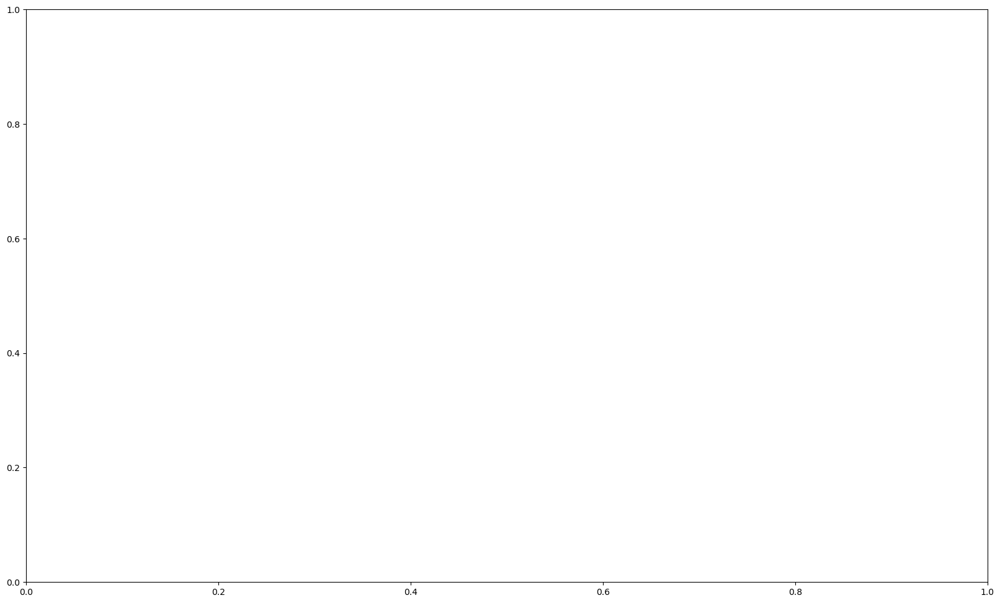

In [703]:
G = nx.from_pandas_edgelist(swr_max_corrs,'LTLA 1','LTLA 2', edge_attr='Maximum Correlation')
correlations = [i['Maximum Correlation'] for i in dict(G.edges).values()]
#distance = [i['Distance between centroids'] for i in dict(G.edges).values()]
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

#carac = pd.DataFrame({ 'Region':['North East', 'North West', 'West Midlands','East Midlands','East of England', 'South East', 'London', 'South West'], 'myvalue':['group1','group2','group3','group4','group5', 'group6', 'group7', 'group8'] })
#swr_max_corrs['Region 1']=pd.Categorical(swr_max_corrs['Region 1'])
#swr_max_corrs['Region 1'].cat.codes

fig, ax = plt.subplots(figsize=(20,12))
pos = nx.spring_layout(G, seed=7)
nx.draw_networkx_nodes(G, pos, node_size = 100, ax = ax, node_color = swr_max_corrs['Region 1'].cat.codes, cmap=plt.cm.Set1, label=True)
nx.draw_networkx_edges(G, pos, width=correlations, ax=ax)
#nx.draw_networkx_labels(G, pos, labels, font_size = 6, ax=ax)
plt.show()

## Third Wave R Values

In [152]:
thirdwr_cc = pd.read_csv('Third_Wave_R.csv')


In [109]:
thirdwr_cc.describe()

,Maximum Correlation,Lag in Days
count,49455.000000,49455.000000
mean,0.730554,0.001375
std,0.111949,8.760058
min,0.211935,-171.000000
25%,0.672657,-1.000000
50%,0.750610,0.000000
75%,0.811297,1.000000
max,0.971065,251.000000


In [114]:
twr_top_corrs = thirdwr_cc.loc[thirdwr_cc['Maximum Correlation'] > 0.811297]
twr_top_corrs.nlargest(10, 'Lag in Days')

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
36293,Lancaster,South Tyneside,0.812407,4.0
1957,Trafford,Rotherham,0.830793,3.0
2154,Trafford,Rochdale,0.878916,3.0
2317,Barnsley,Middlesbrough,0.867912,3.0
5012,Rossendale,North Tyneside,0.829862,3.0
6474,Bromsgrove,Isle of Wight,0.811713,3.0
7952,South Lakeland,Northumberland,0.828382,3.0
8456,Dacorum,Walsall,0.822613,3.0
12910,Runnymede,Dudley,0.813698,3.0
13017,Runnymede,South Staffordshire,0.833086,3.0


In [115]:
import seaborn as sns

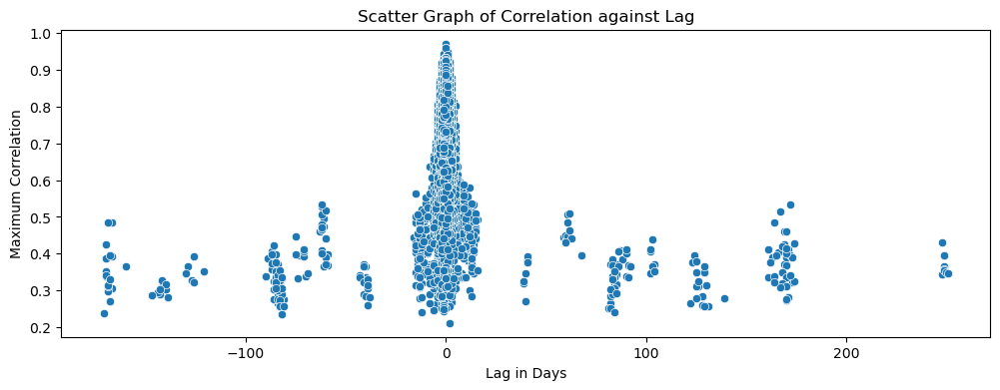

In [117]:
plt.figure(figsize=(12,4))

sns.scatterplot(data = thirdwr_cc, x = "Lag in Days", y = "Maximum Correlation")
plt.title("Scatter Graph of Correlation against Lag")

plt.show()

In [154]:
thirdwr_cc = thirdwr_cc.set_index('LTLA 1')
thirdwr_cc = thirdwr_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [155]:
thirdwr_cc = thirdwr_cc.reset_index()
thirdwr_cc

,LTLA 1,index,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,0,East Devon,0.729717,-3.0
1,Redcar and Cleveland,1,Havant,0.792831,-2.0
2,Redcar and Cleveland,2,Surrey Heath,0.567554,-2.0
3,Redcar and Cleveland,3,Worthing,0.642351,-3.0
4,Redcar and Cleveland,4,Bolton,0.702724,-1.0
...,...,...,...,...,...
49450,Basingstoke and Deane,49450,Rushcliffe,0.817918,-1.0
49451,Basingstoke and Deane,49451,Hillingdon,0.862722,0.0
49452,Tunbridge Wells,49452,Rushcliffe,0.859649,0.0
49453,Tunbridge Wells,49453,Hillingdon,0.837198,1.0


In [156]:
thirdwr_cc = thirdwr_cc.set_index('LTLA 2')
thirdwr_cc = thirdwr_cc.rename(index = {'Cornwall and Isles of Scilly': 'Cornwall'})

In [157]:
thirdwr_cc = thirdwr_cc.reset_index()
thirdwr_cc

,LTLA 2,LTLA 1,index,Maximum Correlation,Lag in Days
0,East Devon,Redcar and Cleveland,0,0.729717,-3.0
1,Havant,Redcar and Cleveland,1,0.792831,-2.0
2,Surrey Heath,Redcar and Cleveland,2,0.567554,-2.0
3,Worthing,Redcar and Cleveland,3,0.642351,-3.0
4,Bolton,Redcar and Cleveland,4,0.702724,-1.0
...,...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,49450,0.817918,-1.0
49451,Hillingdon,Basingstoke and Deane,49451,0.862722,0.0
49452,Rushcliffe,Tunbridge Wells,49452,0.859649,0.0
49453,Hillingdon,Tunbridge Wells,49453,0.837198,1.0


,LTLA 2,Maximum Correlation,Lag in Days
0,East Devon,0.729717,-3.0
1,Havant,0.792831,-2.0
2,Surrey Heath,0.567554,-2.0
3,Worthing,0.642351,-3.0
4,Bolton,0.702724,-1.0
...,...,...,...
49450,Rushcliffe,0.817918,-1.0
49451,Hillingdon,0.862722,0.0
49452,Rushcliffe,0.859649,0.0
49453,Hillingdon,0.837198,1.0


In [177]:
c_distances = thirdwr_cc.merge(map_df,how='left', left_on = 'LTLA 1', right_on='LAD19NM')
c_distances = c_distances.loc[c_distances['LTLA 1'] != 'Hackney and City of London']
c_distances = c_distances.loc[c_distances['LTLA 2'] != 'Hackney and City of London']
c_distances

,LTLA 2,LTLA 1,index,Maximum Correlation,Lag in Days,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid
0,East Devon,Redcar and Cleveland,0,0.729717,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,-1.006110,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737)
1,Havant,Redcar and Cleveland,1,0.792831,-2.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,-1.006110,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737)
2,Surrey Heath,Redcar and Cleveland,2,0.567554,-2.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,-1.006110,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737)
3,Worthing,Redcar and Cleveland,3,0.642351,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,-1.006110,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737)
4,Bolton,Redcar and Cleveland,4,0.702724,-1.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,-1.006110,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,49450,0.817918,-1.0,E07000084,Basingstoke and Deane,NaN,454508.0,151423.0,-1.220210,51.2594,e22fc013-2390-4ae8-9098-80b82298382b,"POLYGON ((439824.503 159869.997, 438804.704 16...",POINT (455884.552 152949.361)
49451,Hillingdon,Basingstoke and Deane,49451,0.862722,0.0,E07000084,Basingstoke and Deane,NaN,454508.0,151423.0,-1.220210,51.2594,e22fc013-2390-4ae8-9098-80b82298382b,"POLYGON ((439824.503 159869.997, 438804.704 16...",POINT (455884.552 152949.361)
49452,Rushcliffe,Tunbridge Wells,49452,0.859649,0.0,E07000116,Tunbridge Wells,NaN,573139.0,136599.0,0.471632,51.1025,c0d2129e-50a6-4d0d-ab7f-cc7cbed4d880,"POLYGON ((555736.400 145126.397, 559287.102 14...",POINT (570309.724 137798.607)
49453,Hillingdon,Tunbridge Wells,49453,0.837198,1.0,E07000116,Tunbridge Wells,NaN,573139.0,136599.0,0.471632,51.1025,c0d2129e-50a6-4d0d-ab7f-cc7cbed4d880,"POLYGON ((555736.400 145126.397, 559287.102 14...",POINT (570309.724 137798.607)


In [179]:
c_distances2 = thirdwr_cc.merge(map_df,how='left', left_on = 'LTLA 2', right_on='LAD19NM')
c_distances2 = c_distances2.loc[c_distances2['LTLA 2'] != 'Hackney and City of London']
c_distances2 = c_distances2.loc[c_distances2['LTLA 1'] != 'Hackney and City of London']
c_distances2

,LTLA 2,LTLA 1,index,Maximum Correlation,Lag in Days,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid
0,East Devon,Redcar and Cleveland,0,0.729717,-3.0,E07000040,East Devon,NaN,313775.0,96055.0,-3.22381,50.7576,34756475-7088-465e-99fd-07fa0f383c56,"POLYGON ((326101.999 112616.903, 325882.400 10...",POINT (313900.406 96930.876)
1,Havant,Redcar and Cleveland,1,0.792831,-2.0,E07000090,Havant,NaN,470177.0,108563.0,-1.00400,50.8723,f3ef4f4e-6d3b-4a84-a100-0b3fcaa8bd04,"MULTIPOLYGON (((468828.400 103430.701, 468895....",POINT (471137.407 105955.124)
2,Surrey Heath,Redcar and Cleveland,2,0.567554,-2.0,E07000214,Surrey Heath,NaN,491362.0,160483.0,-0.68986,51.3361,6a80d4cf-b3f8-4532-8dec-9648f52b217a,"POLYGON ((496215.798 166832.904, 499361.198 16...",POINT (492689.382 161238.561)
3,Worthing,Redcar and Cleveland,3,0.642351,-3.0,E07000229,Worthing,NaN,512679.0,104948.0,-0.40127,50.8331,94595d5d-8423-4497-904c-e9a8f00b0b45,"POLYGON ((510306.797 101564.297, 509513.103 10...",POINT (513021.067 104724.630)
4,Bolton,Redcar and Cleveland,4,0.702724,-1.0,E08000001,Bolton,NaN,368352.0,409873.0,-2.47952,53.5845,c3e2b968-8f2e-4f9a-b853-f68b59d3fa25,"POLYGON ((366280.602 414615.697, 368397.901 41...",POINT (369139.334 409166.646)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,49450,0.817918,-1.0,E07000176,Rushcliffe,NaN,466606.0,335453.0,-1.01097,52.9124,3ea9fc97-b8c4-483a-8a2c-dd1e3b8ed7f6,"POLYGON ((466755.296 343583.000, 468843.300 34...",POINT (464817.056 334113.667)
49451,Hillingdon,Basingstoke and Deane,49451,0.862722,0.0,E09000017,Hillingdon,NaN,508166.0,183120.0,-0.44182,51.5366,3fa22fa5-402f-4b82-8367-05ddb5d0b309,"POLYGON ((503946.104 190047.399, 504132.500 19...",POINT (507929.434 183690.982)
49452,Rushcliffe,Tunbridge Wells,49452,0.859649,0.0,E07000176,Rushcliffe,NaN,466606.0,335453.0,-1.01097,52.9124,3ea9fc97-b8c4-483a-8a2c-dd1e3b8ed7f6,"POLYGON ((466755.296 343583.000, 468843.300 34...",POINT (464817.056 334113.667)
49453,Hillingdon,Tunbridge Wells,49453,0.837198,1.0,E09000017,Hillingdon,NaN,508166.0,183120.0,-0.44182,51.5366,3fa22fa5-402f-4b82-8367-05ddb5d0b309,"POLYGON ((503946.104 190047.399, 504132.500 19...",POINT (507929.434 183690.982)


In [252]:
c_distances = gpd.GeoDataFrame(c_distances)

In [254]:
c_distances2 = gpd.GeoDataFrame(c_distances2)

In [255]:
cent1 = c_distances['Centroid']
cent2 = c_distances2['Centroid']

In [256]:
tuples_list_line = list(zip(cent1, cent2))

#cc_firstwave = pd.DataFrame(tuples_list_lin, columns = ['LTLA 1','LTLA 2','Maximum Correlation', 'Lag in Days'])
#cc_firstwave

In [257]:
line_df = pd.DataFrame(tuples_list_line, columns = ['centroid 1', 'centroid 2'])

In [258]:
line_df

,centroid 1,centroid 2
0,POINT (463481.0938432957 517827.7366536767),POINT (313900.4055742031 96930.87570594721)
1,POINT (463481.0938432957 517827.7366536767),POINT (471137.40657286544 105955.12363992531)
2,POINT (463481.0938432957 517827.7366536767),POINT (492689.3816611632 161238.5607230209)
3,POINT (463481.0938432957 517827.7366536767),POINT (513021.06727073697 104724.62990412654)
4,POINT (463481.0938432957 517827.7366536767),POINT (369139.3343325167 409166.64598261553)
...,...,...
49136,POINT (455884.55230258836 152949.36099162974),POINT (464817.0559905276 334113.6665742705)
49137,POINT (455884.55230258836 152949.36099162974),POINT (507929.4343179959 183690.982342484)
49138,POINT (570309.7235836362 137798.6067146158),POINT (464817.0559905276 334113.6665742705)
49139,POINT (570309.7235836362 137798.6067146158),POINT (507929.4343179959 183690.982342484)


In [220]:
#import shapely.geometry
from shapely.geometry import LineString

In [260]:
line_df['line'] = line_df.apply(lambda row: LineString([row['centroid 1'], row['centroid 2']]), axis=1)

In [261]:
line_df = gpd.GeoDataFrame(line_df)

In [266]:
get_lines = line_df['line']

In [267]:
c_distances['line'] = list(get_lines)

In [269]:
c_distances = gpd.GeoDataFrame(c_distances)
c_distances

,LTLA 2,LTLA 1,index,Maximum Correlation,Lag in Days,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid,line
0,East Devon,Redcar and Cleveland,0,0.729717,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,-1.006110,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),LINESTRING (463481.0938432957 517827.736653676...
1,Havant,Redcar and Cleveland,1,0.792831,-2.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,-1.006110,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),LINESTRING (463481.0938432957 517827.736653676...
2,Surrey Heath,Redcar and Cleveland,2,0.567554,-2.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,-1.006110,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),LINESTRING (463481.0938432957 517827.736653676...
3,Worthing,Redcar and Cleveland,3,0.642351,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,-1.006110,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),LINESTRING (463481.0938432957 517827.736653676...
4,Bolton,Redcar and Cleveland,4,0.702724,-1.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,-1.006110,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737),LINESTRING (463481.0938432957 517827.736653676...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49450,Rushcliffe,Basingstoke and Deane,49450,0.817918,-1.0,E07000084,Basingstoke and Deane,NaN,454508.0,151423.0,-1.220210,51.2594,e22fc013-2390-4ae8-9098-80b82298382b,"POLYGON ((439824.503 159869.997, 438804.704 16...",POINT (455884.552 152949.361),LINESTRING (455884.55230258836 152949.36099162...
49451,Hillingdon,Basingstoke and Deane,49451,0.862722,0.0,E07000084,Basingstoke and Deane,NaN,454508.0,151423.0,-1.220210,51.2594,e22fc013-2390-4ae8-9098-80b82298382b,"POLYGON ((439824.503 159869.997, 438804.704 16...",POINT (455884.552 152949.361),LINESTRING (455884.55230258836 152949.36099162...
49452,Rushcliffe,Tunbridge Wells,49452,0.859649,0.0,E07000116,Tunbridge Wells,NaN,573139.0,136599.0,0.471632,51.1025,c0d2129e-50a6-4d0d-ab7f-cc7cbed4d880,"POLYGON ((555736.400 145126.397, 559287.102 14...",POINT (570309.724 137798.607),LINESTRING (570309.7235836362 137798.606714615...
49453,Hillingdon,Tunbridge Wells,49453,0.837198,1.0,E07000116,Tunbridge Wells,NaN,573139.0,136599.0,0.471632,51.1025,c0d2129e-50a6-4d0d-ab7f-cc7cbed4d880,"POLYGON ((555736.400 145126.397, 559287.102 14...",POINT (570309.724 137798.607),LINESTRING (570309.7235836362 137798.606714615...


In [262]:
test_line = line_df.head(10)
#test_line = gpd.GeoDataFrame(test_line)

,centroid 1,centroid 2,line
0,POINT (463481.0938432957 517827.7366536767),POINT (313900.4055742031 96930.87570594721),LINESTRING (463481.0938432957 517827.736653676...
1,POINT (463481.0938432957 517827.7366536767),POINT (471137.40657286544 105955.12363992531),LINESTRING (463481.0938432957 517827.736653676...
2,POINT (463481.0938432957 517827.7366536767),POINT (492689.3816611632 161238.5607230209),LINESTRING (463481.0938432957 517827.736653676...
3,POINT (463481.0938432957 517827.7366536767),POINT (513021.06727073697 104724.62990412654),LINESTRING (463481.0938432957 517827.736653676...
4,POINT (463481.0938432957 517827.7366536767),POINT (369139.3343325167 409166.64598261553),LINESTRING (463481.0938432957 517827.736653676...
5,POINT (463481.0938432957 517827.7366536767),POINT (376505.62254589726 391373.69010680023),LINESTRING (463481.0938432957 517827.736653676...
6,POINT (463481.0938432957 517827.7366536767),POINT (431070.43973638746 404473.47853819124),LINESTRING (463481.0938432957 517827.736653676...
7,POINT (463481.0938432957 517827.7366536767),POINT (409716.48443205067 438734.13399014313),LINESTRING (463481.0938432957 517827.736653676...
8,POINT (463481.0938432957 517827.7366536767),POINT (524111.5044094055 192352.9254240141),LINESTRING (463481.0938432957 517827.736653676...
9,POINT (463481.0938432957 517827.7366536767),POINT (513703.4528162615 175657.46058895736),LINESTRING (463481.0938432957 517827.736653676...


In [ ]:
c_distances['line'] = c_distances.apply(lambda row: LineString([row['fr_point'], row['to_point']]), axis=1)

In [217]:
c_distances_join = c_distances.merge(c_distances2 , how='left', left_on = 'LTLA 1', right_on='LTLA 1')
c_distances_join

,LTLA 2_x,LTLA 1,index_x,Maximum Correlation_x,Lag in Days_x,LAD19CD_x,LAD19NM_x,LAD19NMW_x,BNG_E_x,BNG_N_x,...,LAD19CD_y,LAD19NM_y,LAD19NMW_y,BNG_E_y,BNG_N_y,LONG_y,LAT_y,GlobalID_y,geometry_y,Centroid_y
0,East Devon,Redcar and Cleveland,0,0.729717,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,E07000040,East Devon,NaN,313775.0,96055.0,-3.22381,50.7576,34756475-7088-465e-99fd-07fa0f383c56,"POLYGON ((326101.999 112616.903, 325882.400 10...",POINT (313900.406 96930.876)
1,East Devon,Redcar and Cleveland,0,0.729717,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,E07000090,Havant,NaN,470177.0,108563.0,-1.00400,50.8723,f3ef4f4e-6d3b-4a84-a100-0b3fcaa8bd04,"MULTIPOLYGON (((468828.400 103430.701, 468895....",POINT (471137.407 105955.124)
2,East Devon,Redcar and Cleveland,0,0.729717,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,E07000214,Surrey Heath,NaN,491362.0,160483.0,-0.68986,51.3361,6a80d4cf-b3f8-4532-8dec-9648f52b217a,"POLYGON ((496215.798 166832.904, 499361.198 16...",POINT (492689.382 161238.561)
3,East Devon,Redcar and Cleveland,0,0.729717,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,E07000229,Worthing,NaN,512679.0,104948.0,-0.40127,50.8331,94595d5d-8423-4497-904c-e9a8f00b0b45,"POLYGON ((510306.797 101564.297, 509513.103 10...",POINT (513021.067 104724.630)
4,East Devon,Redcar and Cleveland,0,0.729717,-3.0,E06000003,Redcar and Cleveland,NaN,464359.0,519597.0,...,E08000001,Bolton,NaN,368352.0,409873.0,-2.47952,53.5845,c3e2b968-8f2e-4f9a-b853-f68b59d3fa25,"POLYGON ((366280.602 414615.697, 368397.901 41...",POINT (369139.334 409166.646)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10270464,Rushcliffe,Tunbridge Wells,49452,0.859649,0.0,E07000116,Tunbridge Wells,NaN,573139.0,136599.0,...,E07000176,Rushcliffe,NaN,466606.0,335453.0,-1.01097,52.9124,3ea9fc97-b8c4-483a-8a2c-dd1e3b8ed7f6,"POLYGON ((466755.296 343583.000, 468843.300 34...",POINT (464817.056 334113.667)
10270465,Rushcliffe,Tunbridge Wells,49452,0.859649,0.0,E07000116,Tunbridge Wells,NaN,573139.0,136599.0,...,E09000017,Hillingdon,NaN,508166.0,183120.0,-0.44182,51.5366,3fa22fa5-402f-4b82-8367-05ddb5d0b309,"POLYGON ((503946.104 190047.399, 504132.500 19...",POINT (507929.434 183690.982)
10270466,Hillingdon,Tunbridge Wells,49453,0.837198,1.0,E07000116,Tunbridge Wells,NaN,573139.0,136599.0,...,E07000176,Rushcliffe,NaN,466606.0,335453.0,-1.01097,52.9124,3ea9fc97-b8c4-483a-8a2c-dd1e3b8ed7f6,"POLYGON ((466755.296 343583.000, 468843.300 34...",POINT (464817.056 334113.667)
10270467,Hillingdon,Tunbridge Wells,49453,0.837198,1.0,E07000116,Tunbridge Wells,NaN,573139.0,136599.0,...,E09000017,Hillingdon,NaN,508166.0,183120.0,-0.44182,51.5366,3fa22fa5-402f-4b82-8367-05ddb5d0b309,"POLYGON ((503946.104 190047.399, 504132.500 19...",POINT (507929.434 183690.982)


In [133]:
map_df

,LAD19CD,LAD19NM,LAD19NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,Centroid
0,E06000001,Hartlepool,NaN,447157,531476,-1.27023,54.6762,04419154-a30d-4803-ad36-adff535bdc4f,"POLYGON ((453098.301 534104.204, 453343.303 53...",POINT (447858.222 530775.756)
1,E06000002,Middlesbrough,NaN,451141,516887,-1.21099,54.5447,8c58c819-b053-440b-a820-4f325831bae7,"POLYGON ((446483.900 519130.144, 447775.604 51...",POINT (450414.504 516716.770)
2,E06000003,Redcar and Cleveland,NaN,464359,519597,-1.00611,54.5675,a28340e3-933d-4e5f-b0bb-db0141fd39f5,"POLYGON ((455049.503 524684.000, 454677.099 52...",POINT (463481.094 517827.737)
3,E06000004,Stockton-on-Tees,NaN,444937,518183,-1.30669,54.5569,45846d1d-0ddc-478c-9709-46a63608934f,"POLYGON ((446483.900 519130.144, 447271.401 51...",POINT (443311.722 518610.696)
4,E06000005,Darlington,NaN,428029,515648,-1.56835,54.5353,073fde2a-793d-488d-8028-641cc746e271,"POLYGON ((419709.299 515678.298, 419162.998 51...",POINT (429079.949 517181.470)
...,...,...,...,...,...,...,...,...,...,...
312,E09000029,Sutton,NaN,527356,163640,-0.17227,51.3576,6837438e-5a87-4614-9a8a-99cdb7b6bfa0,"POLYGON ((522578.499 167053.601, 524104.000 16...",POINT (526921.511 164072.121)
313,E09000030,Tower Hamlets,NaN,536345,181451,-0.03640,51.5155,db3d3b42-aab6-4a55-bd76-1b03ce4b2b4e,"POLYGON ((539209.254 180727.265, 538506.172 18...",POINT (536284.163 181655.072)
314,E09000031,Waltham Forest,NaN,537327,190277,-0.01881,51.5946,d549bb9f-d79a-46af-b840-6a12883f055b,"POLYGON ((537625.101 196029.497, 540060.799 19...",POINT (537733.549 190362.653)
315,E09000032,Wandsworth,NaN,525152,174137,-0.20021,51.4524,ae8b0119-ba95-4f3a-bf05-112793bf65c4,"POLYGON ((528519.296 175722.099, 529115.703 17...",POINT (525991.101 174101.545)


In [180]:
ltla_distances = [(c_distances['Centroid'].iloc[i]).distance(c_distances2['Centroid'].iloc[i]) for i in range(len(c_distances))]


In [183]:
thirdwr_cc = thirdwr_cc.loc[thirdwr_cc['LTLA 2'] != 'Hackney and City of London']
thirdwr_cc = thirdwr_cc.loc[thirdwr_cc['LTLA 1'] != 'Hackney and City of London']

In [184]:
thirdwr_cc['Distance between centroids'] = ltla_distances

In [187]:
thirdwr_cc['Distance between centroids'] = thirdwr_cc['Distance between centroids'] / 1000

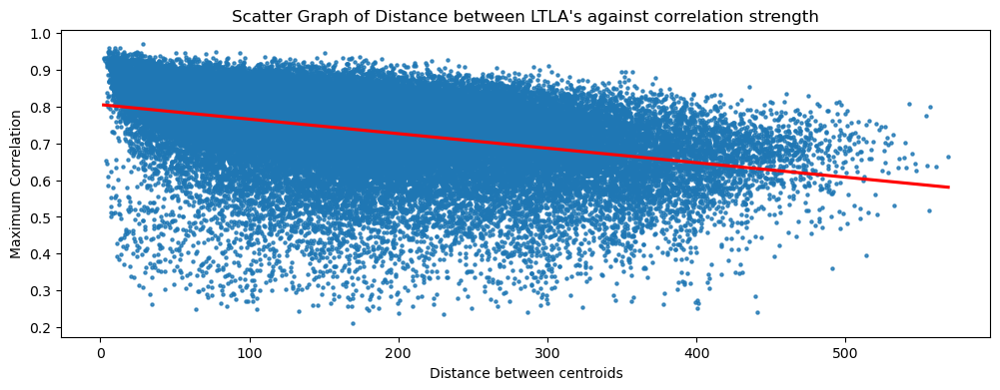

In [198]:
plt.figure(figsize=(12,4))

sns.regplot(data = thirdwr_cc, x = "Distance between centroids", y = "Maximum Correlation", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [294]:
from scipy.stats import pearsonr
data1 = thirdwr_cc['Distance between centroids']
data2 = thirdwr_cc['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.377


In [402]:
twr_abs_lag = thirdwr_cc
twr_abs_lag['Lag in Days'] = abs(twr_abs_lag['Lag in Days'])

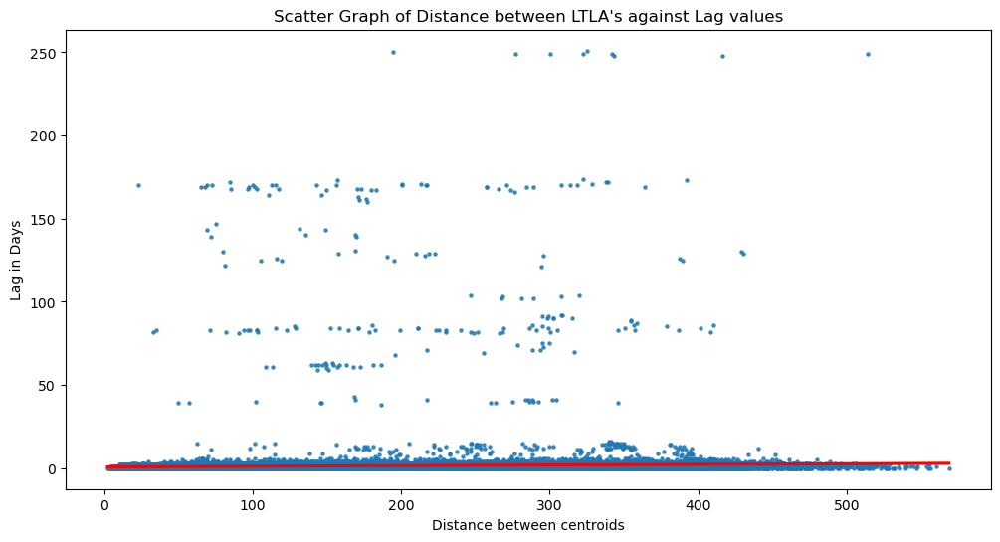

In [403]:
plt.figure(figsize=(12,6))

sns.regplot(data = twr_abs_lag, x = "Distance between centroids", y = "Lag in Days", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against Lag values")

plt.show()

In [404]:
from scipy.stats import pearsonr
data1 = twr_abs_lag['Distance between centroids']
data2 = twr_abs_lag['Lag in Days']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.048


In [191]:
twr_top_corrs2 = thirdwr_cc.loc[thirdwr_cc['Maximum Correlation'] > 0.811297]

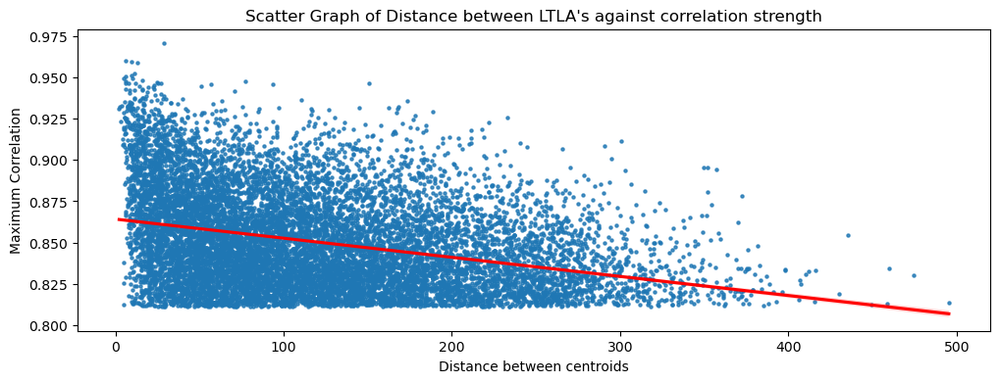

In [200]:
plt.figure(figsize=(12,4))

sns.regplot(data = twr_top_corrs2, x = "Distance between centroids", y = "Maximum Correlation", line_kws = {"color": "red"}, scatter_kws={'s':5})
plt.title("Scatter Graph of Distance between LTLA's against correlation strength")

plt.show()

In [295]:
data1 = twr_top_corrs2['Distance between centroids']
data2 = twr_top_corrs2['Maximum Correlation']

corr, _ = pearsonr(data1, data2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.323


In [292]:
ltla1_top = twr_top_corrs2['LTLA 1'].value_counts()
ltla2_top = twr_top_corrs2['LTLA 2'].value_counts()

In [293]:
ltla2_top

Colchester               161
Hillingdon               160
Stevenage                155
Basingstoke and Deane    151
Harlow                   136
                        ... 
Cambridge                  1
Havant                     1
Oxford                     1
Wellingborough             1
Barnsley                   1
Name: LTLA 2, Length: 305, dtype: int64

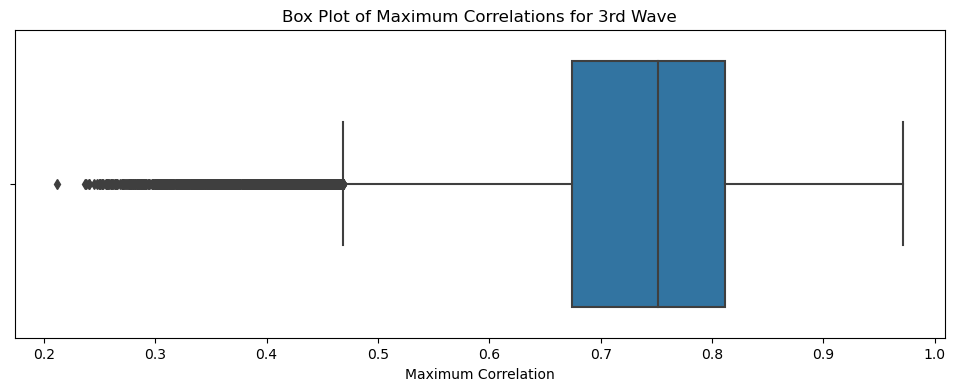

In [204]:
plt.figure(figsize=(12,4))
sns.boxplot(x=thirdwr_cc["Maximum Correlation"])
plt.title('Box Plot of Maximum Correlations for 3rd Wave')
plt.show()

In [278]:
c_distances_test = c_distances.head(30)
c_distances_test = gpd.GeoDataFrame(c_distances_test)

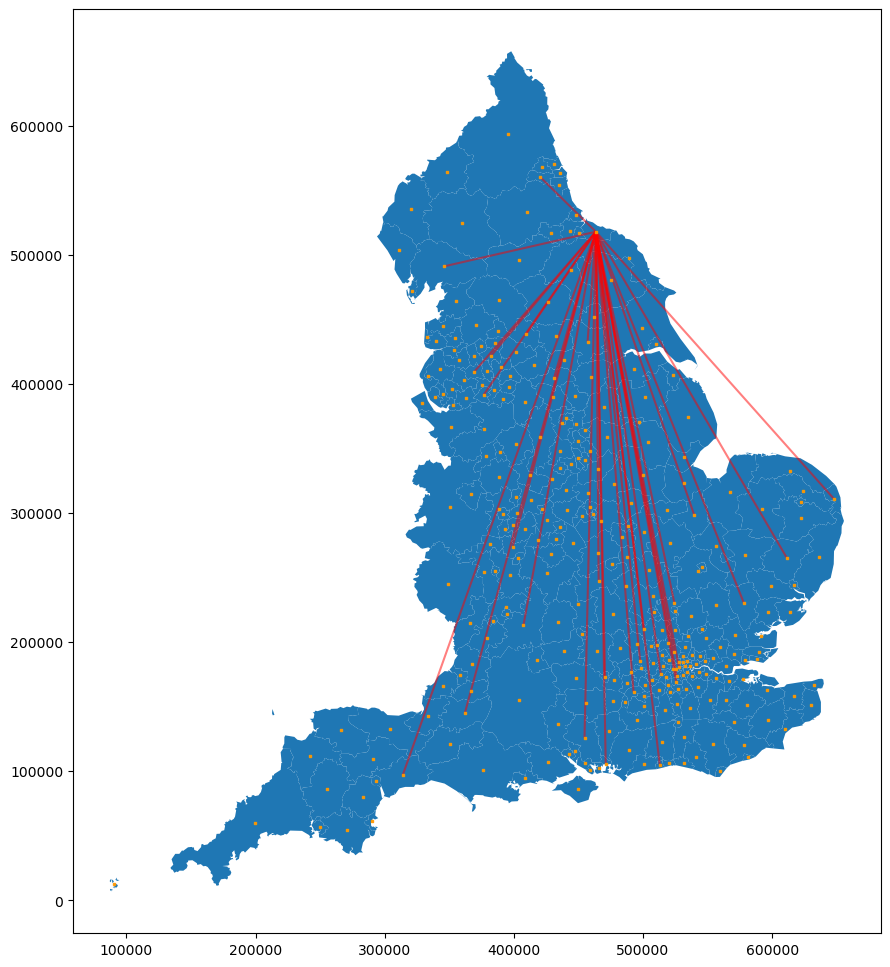

In [284]:
from matplotlib import pyplot as plt
fig, ax = plt.subplots(figsize=(16,12))
map_df['geometry'].plot(ax=ax)
map_df['Centroid'].plot(ax=ax, color='#FF9800', marker='s', zorder=2, alpha=0.9, markersize=4)
c_distances_test.set_geometry('line', inplace=True)
c_distances_test['line'].plot(ax=ax, color='red', zorder=1, alpha=0.5)
plt.show()

In [162]:
(c_distances['Centroid'].iloc[0]).distance(c_distances2['Centroid'].iloc[0])

446686.1872262313

In [1175]:
twr_cc_test = twr_cc.merge(ltla2region, how='left', left_on = 'LTLA 1', right_on='LAD19NM')
twr_cc_test = twr_cc_test.merge(ltla2region, how='left', left_on = 'LTLA 2', right_on = 'LAD19NM')

In [1176]:
twr_cc_test

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,LAD19NM_x,RGN19NM_x,LAD19NM_y,RGN19NM_y
0,Redcar and Cleveland,East Devon,0.729717,-3.0,Redcar and Cleveland,North East,East Devon,South West
1,Redcar and Cleveland,Havant,0.792831,-2.0,Redcar and Cleveland,North East,Havant,South East
2,Redcar and Cleveland,Surrey Heath,0.567554,-2.0,Redcar and Cleveland,North East,Surrey Heath,South East
3,Redcar and Cleveland,Worthing,0.642351,-3.0,Redcar and Cleveland,North East,Worthing,South East
4,Redcar and Cleveland,Bolton,0.702724,-1.0,Redcar and Cleveland,North East,Bolton,North West
...,...,...,...,...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.817918,-1.0,Basingstoke and Deane,South East,Rushcliffe,East Midlands
49451,Basingstoke and Deane,Hillingdon,0.862722,0.0,Basingstoke and Deane,South East,Hillingdon,London
49452,Tunbridge Wells,Rushcliffe,0.859649,0.0,Tunbridge Wells,South East,Rushcliffe,East Midlands
49453,Tunbridge Wells,Hillingdon,0.837198,1.0,Tunbridge Wells,South East,Hillingdon,London


In [1177]:
twr_cc_test = twr_cc_test.rename(columns={'RGN19NM_x':'LTLA 1 Region', 'RGN19NM_y':'LTLA 2 Region'})
twr_cc_test = twr_cc_test.drop(columns = ['LAD19NM_x', 'LAD19NM_y'])
twr_cc_test

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,LTLA 1 Region,LTLA 2 Region
0,Redcar and Cleveland,East Devon,0.729717,-3.0,North East,South West
1,Redcar and Cleveland,Havant,0.792831,-2.0,North East,South East
2,Redcar and Cleveland,Surrey Heath,0.567554,-2.0,North East,South East
3,Redcar and Cleveland,Worthing,0.642351,-3.0,North East,South East
4,Redcar and Cleveland,Bolton,0.702724,-1.0,North East,North West
...,...,...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.817918,-1.0,South East,East Midlands
49451,Basingstoke and Deane,Hillingdon,0.862722,0.0,South East,London
49452,Tunbridge Wells,Rushcliffe,0.859649,0.0,South East,East Midlands
49453,Tunbridge Wells,Hillingdon,0.837198,1.0,South East,London


In [1178]:
twr_cc_test.nlargest(20, 'Maximum Correlation')

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,LTLA 1 Region,LTLA 2 Region
20909,South Gloucestershire,North Somerset,0.971065,0.0,South West,South West
28917,Greenwich,Bexley,0.960418,0.0,London,London
47685,Birmingham,Sandwell,0.959443,0.0,West Midlands,West Midlands
17035,Havering,Bexley,0.959215,0.0,London,London
42375,Wolverhampton,Sandwell,0.952664,0.0,West Midlands,West Midlands
3050,Barnet,Harrow,0.951259,0.0,London,London
28728,Brent,Ealing,0.950751,0.0,London,London
45975,Manchester,Salford,0.949688,0.0,North West,North West
3629,Wandsworth,Lambeth,0.949282,0.0,London,London
6780,Gateshead,Sunderland,0.948317,1.0,North East,North East


In [1187]:
diff_region = twr_cc_test[twr_cc_test['LTLA 1 Region'] != twr_cc_test['LTLA 2 Region']]
diff_region

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,LTLA 1 Region,LTLA 2 Region
0,Redcar and Cleveland,East Devon,0.729717,-3.0,North East,South West
1,Redcar and Cleveland,Havant,0.792831,-2.0,North East,South East
2,Redcar and Cleveland,Surrey Heath,0.567554,-2.0,North East,South East
3,Redcar and Cleveland,Worthing,0.642351,-3.0,North East,South East
4,Redcar and Cleveland,Bolton,0.702724,-1.0,North East,North West
...,...,...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.817918,-1.0,South East,East Midlands
49451,Basingstoke and Deane,Hillingdon,0.862722,0.0,South East,London
49452,Tunbridge Wells,Rushcliffe,0.859649,0.0,South East,East Midlands
49453,Tunbridge Wells,Hillingdon,0.837198,1.0,South East,London


In [1189]:
diff_region.nsmallest(20, 'Maximum Correlation')

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,LTLA 1 Region,LTLA 2 Region
46871,Lambeth,North West Leicestershire,0.211935,2.0,London,East Midlands
554,East Devon,Lambeth,0.236701,-82.0,South West,London
27227,East Lindsey,Lambeth,0.237492,-171.0,East Midlands,London
34331,Northumberland,Lambeth,0.240656,-12.0,North East,London
46893,Lambeth,South Hams,0.240845,84.0,London,South West
31237,Rugby,Lambeth,0.244889,-1.0,West Midlands,London
19979,Walsall,Lambeth,0.247452,-6.0,West Midlands,London
22121,Lewes,Lambeth,0.249206,-1.0,South East,London
48313,Kettering,Tewkesbury,0.250298,-1.0,East Midlands,South West
42361,Wolverhampton,Lambeth,0.250498,0.0,West Midlands,London


In [1193]:
london_midlands = diff_region[diff_region['LTLA 1 Region'] == 'London']
london_midlands = london_midlands[london_midlands['LTLA 2 Region'] == 'West Midlands']
london_midlands

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days,LTLA 1 Region,LTLA 2 Region
2801,Barnet,Bromsgrove,0.831144,-1.0,London,West Midlands
2812,Barnet,Malvern Hills,0.796621,0.0,London,West Midlands
2816,Barnet,Stoke-on-Trent,0.767157,0.0,London,West Midlands
2829,Barnet,Shropshire,0.695063,0.0,London,West Midlands
2835,Barnet,Stratford-on-Avon,0.758125,0.0,London,West Midlands
...,...,...,...,...,...,...
48868,Bexley,Lichfield,0.770714,-1.0,London,West Midlands
48883,Bexley,North Warwickshire,0.789054,0.0,London,West Midlands
48901,Lewisham,Lichfield,0.690912,1.0,London,West Midlands
48916,Lewisham,North Warwickshire,0.683804,0.0,London,West Midlands


In [1223]:
fw_r_corrs[0]

array([ 0.00319672,  0.00762061,  0.01304026,  0.01875816,  0.02335004,
        0.02523207,  0.02424294,  0.02060177,  0.01430127,  0.0066504 ,
       -0.00299193, -0.01539178, -0.03112644, -0.05020575, -0.07223081,
       -0.09572685, -0.11856791, -0.1390001 , -0.15517478, -0.16601023,
       -0.17090078, -0.16984547, -0.16420551, -0.15555742, -0.14575522,
       -0.13676169, -0.12994042, -0.12496979, -0.12107841, -0.11642275,
       -0.11017673, -0.1023135 , -0.09523898, -0.09178496, -0.09440946,
       -0.10512349, -0.12397828, -0.15032611, -0.18098751, -0.21316206,
       -0.24412168, -0.27280671, -0.29872642, -0.32168768, -0.34236636,
       -0.3609002 , -0.37770442, -0.39270013, -0.40529754, -0.41453527,
       -0.41925106, -0.41794432, -0.4092086 , -0.39227822, -0.36643553,
       -0.33154658, -0.28798015, -0.23654859, -0.17936418, -0.11961961,
       -0.06018149, -0.00483645,  0.04246682,  0.07934127,  0.10178312,
        0.10724544,  0.09703333,  0.07158795,  0.03397235, -0.01

In [1204]:
pip install pycorrelate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.0/206.0 kB 2.9 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
  Created wheel for pycorrelate: filename=pycorrelate-0.3-py2.py3-none-any.whl size=8175 sha256=6ed551269acfd07470dc824a4c208e940230aa64669d03aba18509fe6279a98a
  Stored in directory: /Users/dansutton/Library/Caches/pip/wheels/d3/ab/60/28bbe735ea98d4021be1efae2cce359be98988900867373436
Successfully built pycorrelate
Note: you may need to restart the kernel to use updated packages.


In [1206]:
import pycorrelate as py

In [1283]:
t = np.array(dudley_firstwave['newCasesBySpecimenDate'])
u = np.array(ss_firstwave['newCasesBySpecimenDate'])
x = np.array(lambeth_firstwave['newCasesBySpecimenDate'])

In [1230]:
ucorr_test = py.ucorrelate(t, x)

In [1217]:
ucorr_test

array([15415, 14632, 14867, 14235, 14099, 14228, 13794, 15238, 14685,
       15048, 14247, 14071, 14487, 14740, 15339, 13797, 13635, 12137,
       12292, 12141, 12354, 12312, 12145, 11244, 10571, 10473, 10413,
        9936,  9295,  8991,  7485,  7241,  6320,  6711,  6300,  6295,
        6640,  5647,  6133,  5704,  6083,  5241,  5246,  4809,  4901,
        4558,  3664,  3426,  3335,  3077,  2742,  2911,  2847,  2640,
        2327,  2463,  2765,  2332,  2043,  2180,  2230,  2100,  1787,
        1981,  2131,  1666,  1247,  1209,  1230,  1170,  1142,  1234,
        1102,  1183,   974,  1104,  1062,   877,   885,   933,   929,
         832,   755,   927,   823,   857,   741,   770,   793,   763,
         841,   847,   831,   687,   799,   760,   705,   751,   709,
         781,   669,   636,   662,   658,   756,   612,   839,   665,
         895,   853,   811,   845,   706,   697,   578,   558,   314,
         322,   212,    43])

In [1222]:
len(ucorr_test)

120

In [1259]:
nsig3 = t - np.mean(t) # Demean
nsig4 = x - np.mean(x) # Demean

corr_test5 = py.ucorrelate(nsig3, nsig4)
corr_test5 /= (len(x) * np.std(t) * np.std(x)) # Normalization

print(corr_test5)

TypeError: ufunc 'true_divide' output (typecode 'd') could not be coerced to provided output parameter (typecode 'l') according to the casting rule ''same_kind''

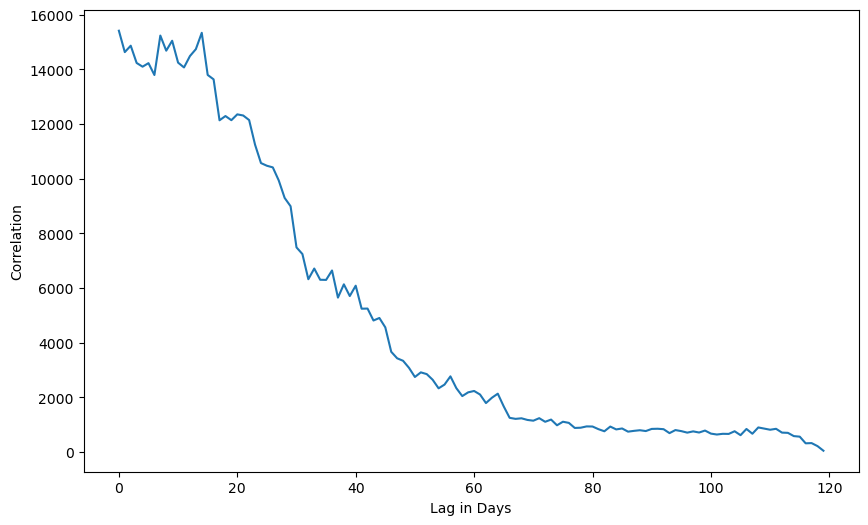

In [1231]:
fig, ax = plt.subplots(figsize=(10, 6))
plt.xlabel('Lag in Days')
plt.ylabel('Correlation')
plt.plot(range(0,120), ucorr_test)


In [1236]:
corr_test2 = np.correlate(t, u)
corr_test2

array([23335])

In [1234]:
import scipy
import scipy.signal

In [1235]:
corr_test3 = scipy.signal.correlate(t, u)
corr_test3

array([   30,   136,   182,   211,   419,   321,   469,   436,   476,
         531,   516,   481,   530,   448,   483,   690,   576,   778,
         799,   694,   955,   742,   862,   948,   830,   900,   758,
         961,   895,  1030,  1049,  1160,   985,  1150,  1106,  1112,
        1127,  1034,  1026,  1080,  1017,  1147,  1153,  1210,  1260,
        1099,  1433,  1368,  1484,  1492,  1496,  1393,  1312,  1433,
        1836,  1862,  2047,  2052,  2126,  2097,  2046,  1950,  2571,
        2292,  2450,  2580,  2536,  2881,  3088,  3086,  3733,  3142,
        3549,  3729,  4162,  4439,  4844,  5062,  5110,  5216,  5229,
        5850,  5768,  6176,  6475,  6468,  6583,  6861,  7697,  7957,
        8954,  9185,  9995, 10574, 10133, 10571, 10712, 11332, 11807,
       12373, 12920, 12764, 12865, 14488, 15055, 16461, 16839, 16122,
       15871, 15346, 15820, 17236, 17717, 17597, 17385, 16670, 17453,
       19061, 19424, 23335, 19424, 19061, 17453, 16670, 17385, 17597,
       17717, 17236,

In [1289]:
nsig1 = t - np.mean(t) # Demean
nsig2 = x - np.mean(x) # Demean

corr_test4 = scipy.signal.correlate(nsig1, nsig2)
corr_test4 /= (len(x) * np.std(t) * np.std(x)) # Normalization

print(corr_test4)

[ 4.51261671e-03  8.05931682e-03  1.02029791e-02  1.34676198e-02
  1.71176945e-02  1.71705616e-02  2.21483639e-02  2.44509881e-02
  2.33506901e-02  2.16263417e-02  2.52609130e-02  2.51346511e-02
  2.49208372e-02  2.53512130e-02  2.49588116e-02  1.79746986e-02
  1.90259603e-02  1.39901417e-02  5.01902445e-03  4.48770300e-03
 -3.91453483e-03 -1.41500891e-02 -1.84419245e-02 -2.61802499e-02
 -4.63506312e-02 -4.74054738e-02 -6.21768514e-02 -6.80512699e-02
 -8.59580561e-02 -9.99101401e-02 -1.15988787e-01 -1.27424016e-01
 -1.44755816e-01 -1.44848642e-01 -1.54870383e-01 -1.68810225e-01
 -1.84507755e-01 -1.93391320e-01 -2.04632458e-01 -2.12141564e-01
 -2.23937966e-01 -2.33566250e-01 -2.34904845e-01 -2.35380677e-01
 -2.48344054e-01 -2.47840991e-01 -2.55684482e-01 -2.60894863e-01
 -2.59864282e-01 -2.62037674e-01 -2.66179402e-01 -2.70416386e-01
 -2.70219227e-01 -2.79509962e-01 -2.70698542e-01 -2.83080451e-01
 -2.74263952e-01 -2.80846683e-01 -2.79497637e-01 -2.80856371e-01
 -2.78994033e-01 -2.76389

In [1285]:
len(corr_test4)

298

In [1290]:
list(corr_test4).index(max(corr_test4))

142

In [1291]:
max(corr_test4)

0.7079900999609129

In [1288]:
lamb_test = fwr_cc.loc[fwr_cc['LTLA 2'] == 'Lambeth']
lamb_test = lamb_test.loc[lamb_test['LTLA 1'] == 'Dudley']
lamb_test

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
23276,Dudley,Lambeth,0.494364,9.0


In [1275]:
def fwr_cross_corr2(x, y):
    
    array1 = np.array((fw_r_values[x])['R_mean'])
    array2 = np.array((fw_r_values[y])['R_mean'])
    
    nsig1 = array1 - np.mean(array1) # Demean
    nsig2 = array2 - np.mean(array2) # Demean

    corr_test = scipy.signal.correlate(nsig1, nsig2)
    corr_test /= (len(array2) * np.std(array1) * np.std(array2))
    
    return corr_test
        #return scipy.stats.pearsonr(series1, series2)
#res = [(a, b) for idx, a in enumerate(ltlas) for b in ltlas[idx + 1:]]
fw_r_corrs2 = [fwr_cross_corr2(x, y) for x, y in itertools.combinations(range(len(ltlas)), 2)]

In [1276]:
fwr_max_corrs2 = [max(fw_r_corrs2[i]) for i in range(len(fw_r_corrs2))]
fwr_lag2 = [(list(fw_r_corrs2[i])).index(max(list(fw_r_corrs2[i]))) - (len(fw_r_corrs2[i])/2) + 0.5  for i in range(len(fw_r_corrs2))]

In [1277]:
fwr_tuples_list2 = list(zip(ltlas1, ltlas2, fwr_max_corrs2, fwr_lag2))

fwr_cc2 = pd.DataFrame(fwr_tuples_list2, columns = ['LTLA 1','LTLA 2','Maximum Correlation', 'Lag in Days'])
fwr_cc2

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
0,Redcar and Cleveland,East Devon,0.640064,0.0
1,Redcar and Cleveland,Havant,0.672274,1.0
2,Redcar and Cleveland,Surrey Heath,0.756990,-3.5
3,Redcar and Cleveland,Worthing,0.695085,-4.5
4,Redcar and Cleveland,Bolton,0.551396,-4.5
...,...,...,...,...
49450,Basingstoke and Deane,Rushcliffe,0.668643,-9.0
49451,Basingstoke and Deane,Hillingdon,0.479407,-40.0
49452,Tunbridge Wells,Rushcliffe,0.727983,5.5
49453,Tunbridge Wells,Hillingdon,0.379665,-23.5


In [1278]:
fwr_cc2.iloc[23276]

LTLA 1                   Dudley
LTLA 2                  Lambeth
Maximum Correlation    0.468919
Lag in Days                 5.5
Name: 23276, dtype: object

In [1294]:
len(fw_r_corrs2[23276])

264

In [1297]:
fwr_cc2.nlargest(20, 'Maximum Correlation')

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
1753,Bolton,Torridge,1.206229,49.5
9999,Wirral,Torridge,1.157594,50.5
29862,Test Valley,North Devon,1.140939,-34.0
15669,Northampton,Torridge,1.133388,53.5
37430,Newham,North Devon,1.117330,45.5
23688,"Herefordshire, County of",Torridge,1.113266,-44.0
41083,Cheshire West and Chester,Torridge,1.108163,52.0
45794,Hinckley and Bosworth,South Hams,1.077370,-21.5
26973,Eden,Torridge,1.069623,-50.0
43587,Mansfield,North Devon,1.069231,-34.0


In [1296]:
fwr_cc.nlargest(20, 'Maximum Correlation')

,LTLA 1,LTLA 2,Maximum Correlation,Lag in Days
48030,West Devon,Wigan,1.240669,0.0
42853,Torridge,Wigan,1.132349,-95.0
45459,North Devon,Daventry,1.123801,-6.0
42841,Torridge,Sandwell,1.084901,87.0
4650,Winchester,Wiltshire,1.080333,4.0
45479,North Devon,Birmingham,1.068968,2.0
45460,North Devon,Ashfield,1.054353,-19.0
42897,Torridge,Tunbridge Wells,1.043291,27.0
45455,North Devon,Manchester,1.041190,7.0
24961,Ryedale,North East Derbyshire,1.037238,-8.0
